In [89]:
import pandas as pd
import json
import os 
import numpy as np
import matplotlib.pyplot as plt
import pickle
import powerlaw
from matplotlib.lines import Line2D
import df2img
from datetime import datetime , timedelta
import TransformData
import scipy as sci
import statsmodels.formula.api as smf
import statsmodels.api as st
import matplotlib as mpl
import matplotlib.colors as mcolors
import seaborn as sns

### Read the data

In [2]:
start_time = '2021-09-23 10:40:00'
end_time = '2023-10-18 16:10:00'

In [3]:
def df_setting(df,T,label,token_0,token_1,timeframe_align):

    df['return'] = df['close'].apply(np.log).diff()
    df['dT'] = T
    df['token'] = f'{token_0} & {token_1}' 
    if timeframe_align == True:
        df = df[(df.index>=start_time)&(df.index<=end_time)].copy()
    else:
        label+= ' all'
    df['label'] =label
    return df

In [4]:
#read pool data

token_0 = 'WETH'
token_1_list =['USDC','USDT','DAI']
time_list = ['10min','1H']
label_dic = {'arb_3000':'arb_3000','arb_500':'arb_500','m_3000':'mainnet_3000','m_500':'mainnet_500'}
df_list =[]
for key , value in label_dic.items():
    for token_1 in token_1_list:
        for T in time_list:
            try:
                df=  pd.read_csv(f'Data/organized data/{token_0}_{token_1}_{value}/{token_0}_{token_1}_{key}_{T}.csv' 
                                 , index_col = 'datetime')[['close']] 
                df.index = pd.to_datetime(df.index)
                df = df_setting(df,T,key,token_0,token_1,timeframe_align=True)
                df_list.append(df)
            except FileNotFoundError:
                print(f'no {key} {token_0} & {token_1} {T}')
                continue


no arb_3000 WETH & USDT 10min
no arb_3000 WETH & USDT 1H
no arb_500 WETH & DAI 10min
no arb_500 WETH & DAI 1H
no m_500 WETH & USDT 10min
no m_500 WETH & USDT 1H
no m_500 WETH & DAI 10min
no m_500 WETH & DAI 1H


In [5]:
#read Binance data
#ETH,BTC
token_1 = 'USD'
label = 'Binance'
for token_0 in ['ETH' , 'BTC']:
    for T in time_list:
        try:
            df=  pd.read_csv(f'Data/Binance/{token_0}/{token_0}_{token_1}_{T}.csv' , index_col = 'datetime') 
            df.index = pd.to_datetime(df.index)
            df1 = df_setting(df,T,label,token_0,token_1,timeframe_align=True)
            df_list.append(df1)

            if token_0 == 'ETH':
                df2 = df_setting(df,T,label,token_0,token_1,timeframe_align=False)
                df_list.append(df2)
            
        except FileNotFoundError:
            print(f'no {label} {token_0} & {token_1} {T}')

            continue


In [489]:
#read Binance data
#ETH,BTC
token_1 = 'USD'
label = 'coinbase'
df_list_cb =[]
for token_0 in ['ETH' , 'BTC']:
    for T in ['1H']:
        try:
            df=  pd.read_csv(f'Data/{label}/{token_0}/{token_0}_{token_1}_{T}.csv' , index_col = 'datetime') 
            df.index = pd.to_datetime(df.index)
            df1 = df_setting(df,T,label,token_0,token_1,timeframe_align=True)
            df_list_cb.append(df1)

            if token_0 == 'ETH':
                df2 = df_setting(df,T,label,token_0,token_1,timeframe_align=False)
                df_list_cb.append(df2)
            
        except FileNotFoundError:
            print(f'no {label} {token_0} & {token_1} {T}')

            continue


In [9]:
# read SPY , EUR data
df_list_trad =[]
def spy_eur(s):
    if s=='SPY':
        return 'SPY & USD'
    elif s == 'EUR':
        return 'EUR & USD'
    
df_trad =pd.read_csv('Data/SPY_EUR_over60min.csv',index_col='datetime')
df_trad.index = pd.to_datetime(df_trad.index)
df_trad.drop(columns='Unnamed: 0',axis=1,inplace = True)
df_trad['dT']='1H'
df_trad['token']=df_trad.apply(lambda r: spy_eur(r.label) ,axis=1)

df_trad_partial =df_trad[(df_trad.index>= start_time)&(df_trad.index<=end_time)].copy()
df_trad['label']= df_trad.apply(lambda r: r.label+' all' ,axis=1)

#note that each dataframe contains both EUR and SPY!!
df_list_trad.append(df_trad_partial[['close','return','dT','label','token']])
df_list_trad.append(df_trad[['close','return','dT','label','token']])

In [10]:
temp = []
# sparate EUR and SPY
for df in df_list_trad:
    lab_array = df.label.unique()
    for lab in lab_array:
        temp.append(df[df.label==lab])
df_list_trad = temp

In [11]:
#put all together
df_all = pd.concat(df_list+df_list_trad)
#df_all_trad = pd.concat(df_list_trad)

Try to plot the price of all pools

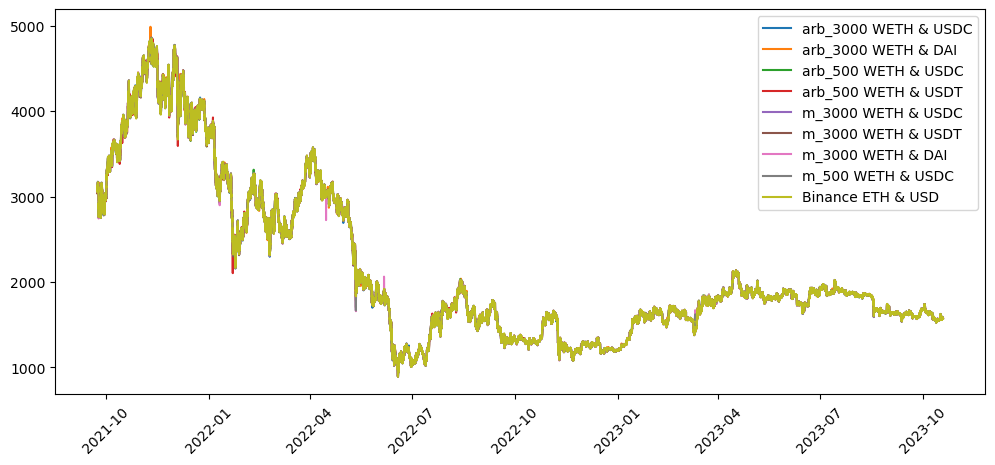

In [7]:
plt.figure(figsize=(12,5))
for df in df_list[:-9]:
    if df.dT[0] != '10min':
        continue
    label= df.label[0]
    token= df.token[0]
    plt.plot(df.index.values , df.close.values ,label = f'{label} {token}');
plt.legend();
plt.xticks(rotation=45);

### Depeg of USDC and DAI around 2023/3

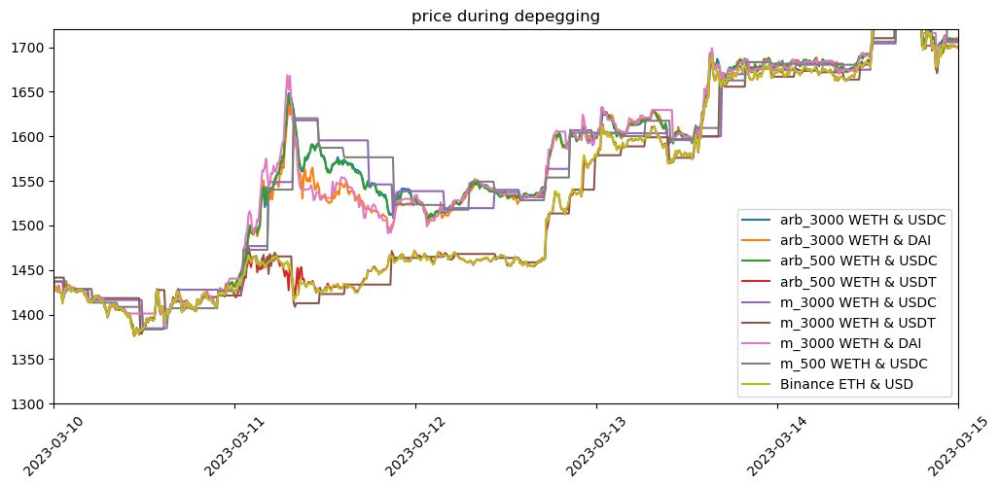

In [269]:
plt.figure(figsize=(12,5))
for df in df_list[:-9]:
    if df.dT[0] != '10min':
        continue
    label= df.label[0]
    token= df.token[0]
    plt.plot(df.index.values , df.close.values ,label = f'{label} {token}');
plt.legend();
plt.xlim(datetime(2023,3,10),datetime(2023,3,15))
plt.ylim(1300,1720)
plt.title('price during depegging' )
plt.xticks(rotation=45);

In [ ]:
token_0 = 'ETH'
token_1 = 'USD'
time_list_cb = ['1H','6H','12H','1D','9to16','1W','1M']

df_list_cb = []
for T in time_list_cb:
    df=  pd.read_csv(f'Data/coinbase/{token_0}_{token_1}_{T}.csv' , index_col = 'datetime') 
    df.index = pd.to_datetime(df.index)
    df['return'] = np.log(df['close']) - np.log(df['close'].shift(1))
    df['dT'] = T
    df['label']= 'coinbase'
    df_list_cb.append(df)
    
df_all = pd.concat([df_all]+  df_list_cb)

In [366]:
df_all.to_csv('Data/organized data/big df.csv')    

## Tools

The following function uses a kind of time-dependant standard deviation:
$$ \sigma_i \equiv \sqrt{\frac{1}{N-1}\sum_{ \{j \leq N \mid  j \neq i \}} (x_j - \mu)^2 }
   = \sqrt{\frac{1}{N-1} (N \sigma^2 - x_i^2) - \frac{N+1}{N-1} \mu^2 + \frac{2 \mu}{N-1} x_i}$$

In [12]:
def std_array(array):
    std_list=[]
    N = len(array)
    var = np.var(array)
    m = np.mean(array)
    for x in array:
        var_new = (N*var - x**2)/(N-1) - (N+1)/(N-1) * m**2 + 2*m*x/(N-1)
        std_list.append( np.sqrt(var_new) )
    return np.array(std_list)
# use usal std
def normalize(array,med_shift = True):
    if med_shift:
        shift = np.median(array)
    else: 
        shift = np.mean(array)
    return (array - shift )/ np.std(array)
#std_array(array)

In [163]:
np.linspace(1,5,10)

array([1.        , 1.44444444, 1.88888889, 2.33333333, 2.77777778,
       3.22222222, 3.66666667, 4.11111111, 4.55555556, 5.        ])

In [13]:
def plot_pdf(array,norm=True,med_shift=True):

    if norm :
        array = normalize(array,med_shift)
        shift = 0
        a = 1
    else:
        a = np.std(array)
        if med_shift:
            shift = np.median(array)
        else:
            shift = np.mean(array)
        
    
    if len(array) < 10000:
        n = 11
        m = 6
    else:
        n = 21
        m = 11
    l = -5*a+shift
    r = 5*a+shift
    c_l = -2*a+shift
    c_r = 2*a+shift
    bin_m = np.linspace(c_l,c_r,60)
    
    bin_l = np.linspace(l,c_l,n)
    bin_r = np.linspace(c_r,r,n)
    bin_l = bin_l[bin_l !=c_l]
    bin_r = bin_r[bin_r != c_r]
    
    r_max=max(array)
    r_min=min(array)
    if r_max > r:
        bin_rr = np.linspace(r,max(array),m)
        bin_rr = bin_rr[bin_rr != r]
    else:
        bin_rr=[]
    if r_min < l:
        bin_ll = np.linspace(min(array),l,m)
        bin_ll = bin_ll[bin_ll !=l]
    else:
        bin_ll=[]
     
    bins = np.concatenate((bin_ll,bin_l,bin_m,bin_r,bin_rr ))
    
    return np.histogram( array  ,bins=bins,density=True );

In [14]:
def cdf_df(array,norm = True,med_shift=True):
    if norm == True:
        array = normalize(array,med_shift)
    value = np.sort(array)
    cdf = np.arange(1, len(array)+1) / (len(array))
    df = pd.DataFrame({'x': value, 'y': cdf}) 
    
    return df.drop_duplicates(['x'],keep='last') #if some value is repeated in data_array, keep last



In [15]:
def cdf_modify(x,y,shift):
    if x>=0:
        if y ==1:
            return -100
        else:
            return np.log(1-y)
    if x <0:
        return np.log(y) +shift
    
        
def shiftlogcdf_df(array):
    df = cdf_df(array,norm=False)

    y_r = df[df.x>=0].values[0,1]
    y_l= df[df.x < 0].values[-1,1]
    shift = np.log(1-y_r) -np.log( y_l)
    df.y =df.apply( lambda r: cdf_modify(r.x,r.y,shift) ,axis=1)

    return df


Generate larger time scale data: rolling window and rolling sum. Note that in the results, the return at time $t$ is
the return between $t$ and $t+T$.

In [16]:
def rolling_window(df,dT):
    if dT =='1D':
        offset_increm = pd.DateOffset(days=1)
    elif dT == '1W':
         offset_increm = pd.DateOffset(weeks=1)
    elif dT == '1M':
         offset_increm = pd.DateOffset(months=1)
    time = df.index[0]
    basic_increm = df.index[1] - time
    time_list =[]
    price_list =[]
    return_list =[]
    scale_array = std_array(df['return'].values)
    while time + offset_increm <= df.index[-1]:
        close =df.xs(time).close
        new_close =df.xs(time +offset_increm).close
        r = np.log(new_close)-np.log(close) 
        return_list.append(r)
        time_list.append(time)
        price_list.append(close)
        time += basic_increm
    dff = pd.DataFrame(data = { 'close': price_list,'return':return_list ,'dT':dT ,
                                'label':df.label[0],'token':df.token[0] },index =time_list )
    
    return dff

In [17]:
def rolling_sum(df,dT):
    if 'scaled return' not in df.columns:
        df['scaled return']= df[['return']].apply(lambda col : col/std_array(col) )

    if dT== '1H':
        offset_increm =pd.to_timedelta('1H')
    elif dT =='1D':
        offset_increm = pd.DateOffset(days=1)
    elif dT == '1W':
        offset_increm = pd.DateOffset(weeks=1)
    elif dT == '1M':
        offset_increm = pd.DateOffset(months=1)
    time = df.index[0]
    basic_increm = df.index[1] - time
    time_list =[]
    price_list =[]
    return_list =[]
    while time + offset_increm <= df.index[-1]:
        close =df.xs(time).close
        time_list.append(time)
        price_list.append(close)
        return_list.append( df.loc[time+basic_increm:time + offset_increm , 'scaled return'].sum() )
        time += basic_increm
    return pd.DataFrame({'close': price_list,'scaled return': return_list, 'dT': dT ,'label': df.label[0],'token':df.token[0] } 
                        , index =time_list)


The results from rolling_window and rolling_sum are almost the same( rolling_window scaled by the std_array of the generating array)

In [18]:

# for 24/7 data
def plot_acf(method_list=['none','abs'],df_all=df_all,time_list=['1H'],nlags=96,scale=False):
    ''' method_list: list of 'none', 'abs', 'square'   '''  
    df = df_all[df_all.dT.isin(time_list)].copy()
    acf_dict = {}
    
    def scale_len(x,scale=False):
        if scale:
            return 1
        else:
            return np.sqrt(len(x))
    for k, method  in enumerate(method_list):
        if method== 'none':
            df_acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf(x[1:],
                                                                            nlags=nlags,fft=False)*scale_len(x[1:]))
        elif method == 'abs':
            df_acf =df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf( np.abs(x[1:]),
                                                                            nlags=nlags,fft=False)*scale_len(x[1:]))
        elif method == 'square':
            df_acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf( x[1:]**2,
                                                                            nlags=10,fft=False)*scale_len(x[1:]))

        df_acf = pd.DataFrame(dict(df_acf)).reset_index()
        df_acf = df_acf.rename(columns={'index':'Lags'})
        df_acf =df_acf.melt(id_vars='Lags',var_name=['label','token','dT'] )
        acf_dict[method] = df_acf
    return acf_dict
 

#### acf
Autocorrelation function is
$$ 
ACF(k) = \frac{\mathbb{E}[ (X_t - \mu) (X_{t+k} - \mu)]}{\sigma^2}
$$
We estimate it by
$$ 
\frac{  \frac{1}{N}\sum_{t \leq T} (x_t - \hat{\mu}) (x_{t+k} - \hat{\mu} )}{\hat{\sigma}^2}
$$

here $N$ can be: 
* $T$ total length of the data 
* $T-k$ exact total number of such pair if there's no time gap in the data 
* $N_k$ exact total number of such pair 

Define new acf function that divide the product by the square root of the exact length.(adjust the scale w.r.t the error bar) 
Also, estimate mean and std by those pair corresponding to the given lag, rather than the whole return time series.

In [19]:
def cor(a1,a2):
    return ((a1 - a1.mean() )@(a2 - a2.mean() ))/ (a1.std()*a2.std())

def plot_acf_2( dff,nlags=96):
    hour = pd.Timedelta('0 days 01:00:00')
    df = dff.copy()
    T_array = df.index
    df['abs return'] = df['return'].abs()
    df_acf = pd.DataFrame(columns=['Lags','return','shifted return','method'])
    R_product = []
    Lags = []
    R =[]
    absR=[]
    for t in T_array:
        # print the time per quarter
        if (t-df.index[0])/hour % (24*30*4)==0:
            print(t)
        for s in T_array[np.logical_and(T_array>=t ,T_array<= t+ nlags*hour)]:
            diff = (s-t)/hour
            Lags.append( int(diff) )
            R.append( ( df.loc[t,'return'], df.loc[s,'return'] ) )
            absR.append( (df.loc[t,'abs return'], df.loc[s,'abs return'] ) )
    R = np.array(R)   
    absR = np.array(absR)      
    df_acf['Lags'] = Lags + Lags
    df_acf['method'] = ['none' for i in range(len(Lags))] + ['abs' for i in range(len(Lags))]
    df_acf.loc[df_acf.method=='none','return'] = R[:,0] 
    df_acf.loc[df_acf.method=='abs','return'] = absR[:,0] 
    df_acf.loc[df_acf.method=='none','shifted return'] = R[:,1] 
    df_acf.loc[df_acf.method=='abs','shifted return'] = absR[:,1] 
    
    df_acf=df_acf.groupby(['method','Lags']).apply(lambda r: pd.Series(
                      {'value': cor(r['return'],r['shifted return'] )/np.sqrt(len(r)) }) ).reset_index()
    df_acf['label']=df.label[0]
    df_acf['dT']='1H'
    df_acf['token'] = df.token[0]
    return df_acf

In [20]:
def cc(pool_label,pool_token,dT,lag):
    cex_return = df_all[ (df_all.label == 'Binance') &( df_all.token == 'ETH & USD' )& (df_all.dT == dT)]['return'].values
    pool_return = df_all[ (df_all.label == pool_label) &( df_all.token == pool_token )& (df_all.dT == dT)]['return'].values
    return np.arange(lag) , st.tsa.stattools.ccf(pool_return,cex_return ,nlags= lag), st.tsa.stattools.ccf(cex_return,pool_return,nlags= lag)

For SPY & EUR data, we need to use different resampling and rolling methods.

In [21]:
def resample_close(x:pd.DataFrame,rPeriod='1D'):

    y = x[['close','label','dT']].copy()
    y.index=pd.to_datetime(y.index)

    result = y[["close"]].resample(rPeriod).last()
    result['return'] = result[['close']].apply(np.log).diff()
    return result.assign(label =y.label[0], dT=rPeriod,token=x.token[0]).dropna()

def resample_by_rolling(x:pd.DataFrame,rPeriod="1W"):
    result = resample_close(x,rPeriod="1D")
    if rPeriod == '1D':
        pass
    else:
        if rPeriod == "1W": days=5 
        elif rPeriod == "1M": days=22
        elif rPeriod == "1Q": days=65
        result.loc[:,'return'] = np.log(result["close"].shift(-days)) - np.log(result["close"])
       
    return result.assign( dT=f"{rPeriod}").dropna()
    

In [87]:
def cdf_tail_fit(df):
    array = normalize(df['return'][1:].values,med_shift=True)
    x_r = array[array>0]  
    x_l = -array[array<0]  
    fit_r = powerlaw.Fit(x_r,xmax=x_r.max())
    fit_l = powerlaw.Fit(x_l,xmax=x_l.max())
    
    slope_r = fit_r.power_law.alpha-1
    x_min_r = fit_r.power_law.xmin
    slope_l = fit_l.power_law.alpha-1
    x_min_l = fit_l.power_law.xmin
    return fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l

## Colors

In [22]:
#color setting


colormap = mpl.colormaps.get_cmap('turbo')  
colors = [colormap(i) for i in range(colormap.N)]

hex_colors = [mpl.colors.rgb2hex(color) for color in colors]

In [23]:
color_list = ['#10A37F', '#147960', '#024736', '#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', 
              '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', 
              '#000075', '#808080', '#00008B', '#000000', '#ffd8b1', '#fffac8', '#aaffc3']

In [24]:
prop_cycle = plt.rcParams['axes.prop_cycle']
c_cycle = prop_cycle.by_key()['color']

## Empirical probability distribution

### pdf

We consider the normalized return of different frequency. A simple check show that $99\%$ of data points fall in the range $[-5,5]$, we'll only show the plot within this range. Since the total
duration of the time is only two years, we only consider 1m, 10m, 30m, 1h,frequencies and adjust the range w.r.t the frequency.

#### Same freq with different label

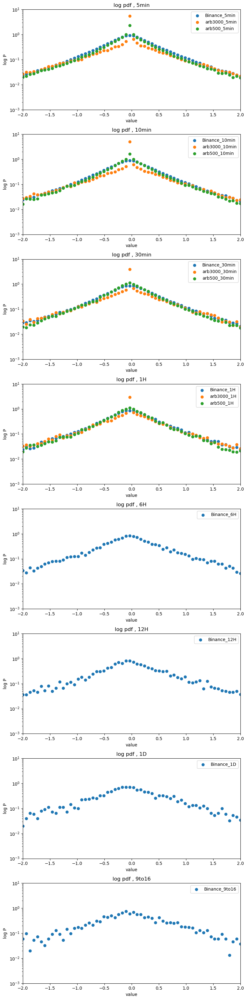

In [17]:
time_list =['5min', '10min','30min','1H','6H','12H','1D','9to16']

fig, ax = plt.subplots(len(time_list),1)

for i,t in enumerate(time_list):
    df = df_all[df_all['dT']==t]
    label_array = np.unique(df['label'].values)
    
    
    for label in label_array:
        
        array =df[df['label']==label]['return'][1:].values
        array = array[array!=0]
        prob, bins= plot_pdf(array);
        ax[i].scatter(bins[:-1], prob,label= f'{label}_{t}' )
   
    ax[i].legend()
    ax[i].set_yscale('log')
    ax[i].set_title(f'log pdf , {t}')
    ax[i].set_xlabel('value')
    ax[i].set_ylabel('log P')
    ax[i].set_xlim(-2,2)
    ax[i].set_ylim(10**(-3),10)
#set figuresize
fig.set_size_inches(8,4*(i+1))
plt.tight_layout()

#### Same label with different freq

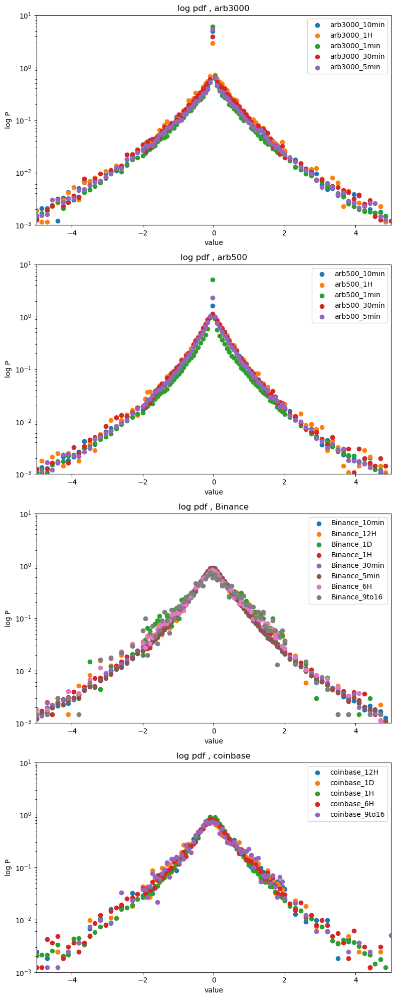

In [132]:
#time_list =[ '1min','5min', '10min','30min','1H','6H','12H','1D','9to16']
label_array =['arb3000','arb500','Binance','coinbase']
fig, ax = plt.subplots(len(label_array),1)
i=0
for label in label_array:
    df = df_all[df_all['label']==label]
    time_array = np.unique(df['dT'].values)

    for t in time_array:
        array =df[df['dT']==t]['return'][1:].values
        array = array[array!=0]
        prob, bins= plot_pdf(array);
        ax[i].scatter(bins[:-1], prob,label= f'{label}_{t}' )
   
    ax[i].legend()
    ax[i].set_yscale('log')
    ax[i].set_title(f'log pdf , {label}')
    ax[i].set_xlabel('value')
    ax[i].set_ylabel('log P')
    ax[i].set_xlim(-5,5)
    ax[i].set_ylim(10**(-3),10)
    i+=1
#set figuresize
fig.set_size_inches(8,4*(i+1))
plt.tight_layout()

##### Daily comparison (different start/end time)

In [36]:
token_0 = 'ETH'
token_1 = 'USD'
T = 'daily'
df_list_daily = []
label_array =['Binance','coinbase']
for label in label_array:
    df=  pd.read_csv(f'Data/{label}/{token_0}_{token_1}_{T}.csv' , index_col = 'datetime') 
    df.index = pd.to_datetime(df.index)
    df['return'] = np.log(df['close']) - np.log(df['close'].shift(1))
    df['label']= label
    df_list_daily.append(df)
    
df_daily = pd.concat(df_list_daily)

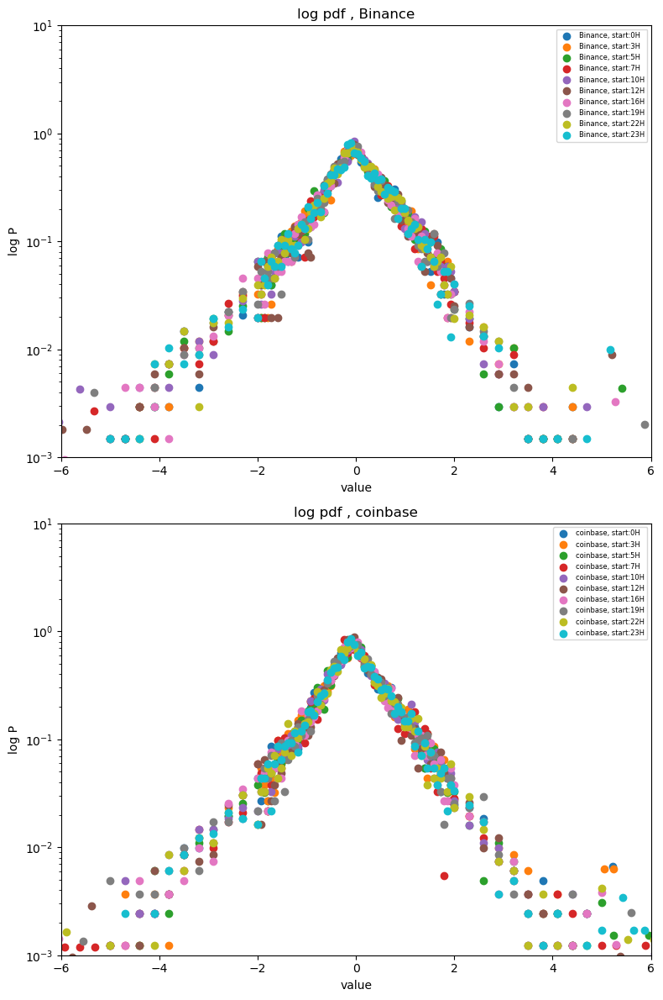

In [37]:
# Same label with different start
label_array =['Binance','coinbase']
fig, ax = plt.subplots(len(label_array),1)
i=0
for label in label_array:
    df = df_daily[df_daily['label']==label]

    for t in[ f'{x}H' for x in [0,3,5,7,10,12,16,19,22,23]]:
        array =df[df['start']==t]['return'][1:].values
        array = array[array!=0]
        prob, bins= plot_pdf(array);
        ax[i].scatter(bins[:-1], prob,label= f'{label}, start:{t}' )
   
    ax[i].legend()
    ax[i].set_yscale('log')
    ax[i].set_title(f'log pdf , {label}')
    ax[i].set_xlabel('value')
    ax[i].set_ylabel('log P')
    ax[i].set_xlim(-6,6)
    ax[i].set_ylim(10**(-3),10)
    ax[i].legend(prop={'size': 6}) 

    i+=1
#set figuresize
fig.set_size_inches(8,4*(i+1))
plt.tight_layout()

Not sure how to present this part, color repeated.

### power law tail fit (both positive negative parts)

arb3000 and 1min
arb500 and 1min
Binance and 5min
arb3000 and 5min
arb500 and 5min
Binance and 10min
arb3000 and 10min
arb500 and 10min
Binance and 30min
arb3000 and 30min
arb500 and 30min
Binance and 1H
arb3000 and 1H
arb500 and 1H
coinbase and 1H
Binance and 6H
coinbase and 6H
Binance and 12H
coinbase and 12H


C:\Users\std92\AppData\Local\Temp\ipykernel_25560\1239523546.py:19: RuntimeWarning: divide by zero encountered in log
  slope_r , intercept_r =np.polyfit( bins_r, np.log(prob_r),1)
C:\Users\std92\AppData\Local\Temp\ipykernel_25560\1239523546.py:20: RuntimeWarning: divide by zero encountered in log
  ax[i].scatter(bins_r, np.log(prob_r),label= f'{label}_{t} ,right' )


Binance and 1D
coinbase and 1D


C:\Users\std92\AppData\Local\Temp\ipykernel_25560\1239523546.py:26: RuntimeWarning: divide by zero encountered in log
  slope_l , intercept_l =np.polyfit(bins_l, np.log(prob_l),1)
C:\Users\std92\AppData\Local\Temp\ipykernel_25560\1239523546.py:27: RuntimeWarning: divide by zero encountered in log
  ax[i].scatter(-bins_l, np.log(prob_l),label= f'{label}_{t} ,left' )


Binance and 9to16
coinbase and 9to16


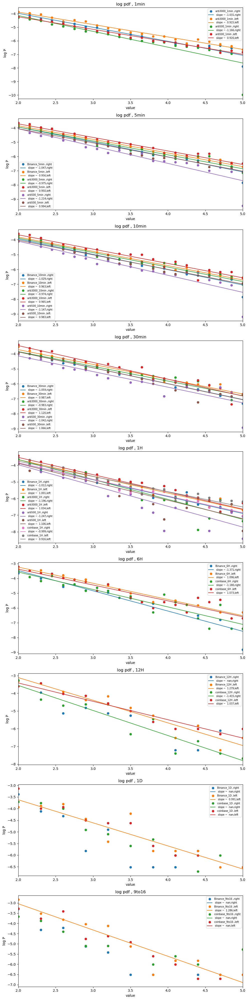

In [106]:
time_list =[ '1min','5min', '10min','30min','1H','6H','12H','1D','9to16']
fig, ax = plt.subplots(len(time_list),1)
i=0
for t in time_list:
    df = df_all[df_all['dT']==t]
    label_array = np.unique(df['label'].values)
    
    
    for label in label_array:
        array =df[df['label']==label]['return'][1:].values
        array = array[array!=0]
        prob, bins= plot_pdf(array);
        bins = bins[:-1]
        
        #fit the positive tails (>=2 )
        bins_r =bins[ np.logical_and(bins>=2,bins<=5)]
        prob_r= prob[ np.logical_and(bins>=2,bins<=5)]
        slope_r , intercept_r =np.polyfit( bins_r, np.log(prob_r),1)
        ax[i].scatter(bins_r, np.log(prob_r),label= f'{label}_{t} ,right' )
        ax[i].plot(bins_r , slope_r*bins_r +intercept_r , label= f' slope ~ {slope_r: .3f},right')
        
        #fit the negative tails (<=-2)
        bins_l=bins[ np.logical_and(bins<=-2,bins>=-5)]
        prob_l=prob[ np.logical_and(bins<=-2,bins>=-5)]
        slope_l , intercept_l =np.polyfit(bins_l, np.log(prob_l),1)
        ax[i].scatter(-bins_l, np.log(prob_l),label= f'{label}_{t} ,left' )
        ax[i].plot(-bins_l , slope_l*bins_l +intercept_l , label= f' slope ~ {slope_l: .3f},left')
       
    
    ax[i].set_title(f'log pdf , {t}')
    ax[i].set_xlabel('value')
    ax[i].set_ylabel('log P')
    ax[i].set_xlim(2,5)
    ax[i].legend(prop={'size': 7}) 
    
    i+=1
#set figuresize
fig.set_size_inches(10,4*(i+1))
plt.tight_layout()

For time interval geq 12H, the fitting fails. Also, it seems that right tails always decay faster than left tails?

### CDF

#### Same label different freq

skewness of arb3000_10min is -0.06281061438884745
skewness of arb3000_1H is -0.3008467897367113
skewness of arb3000_1min is -0.9032760083809654
skewness of arb3000_30min is -0.4006606735512163
skewness of arb3000_5min is 0.04521375817278144
skewness of arb500_10min is 34.823206495725536
skewness of arb500_1H is 14.005596217988503
skewness of arb500_1min is 85.03230876355782
skewness of arb500_30min is 19.597257601881246
skewness of arb500_5min is 47.15349887304766
skewness of Binance_10min is 0.18611307581239706
skewness of Binance_12H is -0.6521397371963107
skewness of Binance_1D is -1.035320508429825
skewness of Binance_1H is -0.5691936313224938
skewness of Binance_1M is -0.14966773898761118
skewness of Binance_1W is -0.3914110933428209
skewness of Binance_30min is -0.26557139553277753
skewness of Binance_5min is -0.11241339615031469
skewness of Binance_6H is -0.5725672469366547
skewness of Binance_9to16 is -0.39529015409603174
skewness of coinbase_12H is -0.291025984772107
skewness 

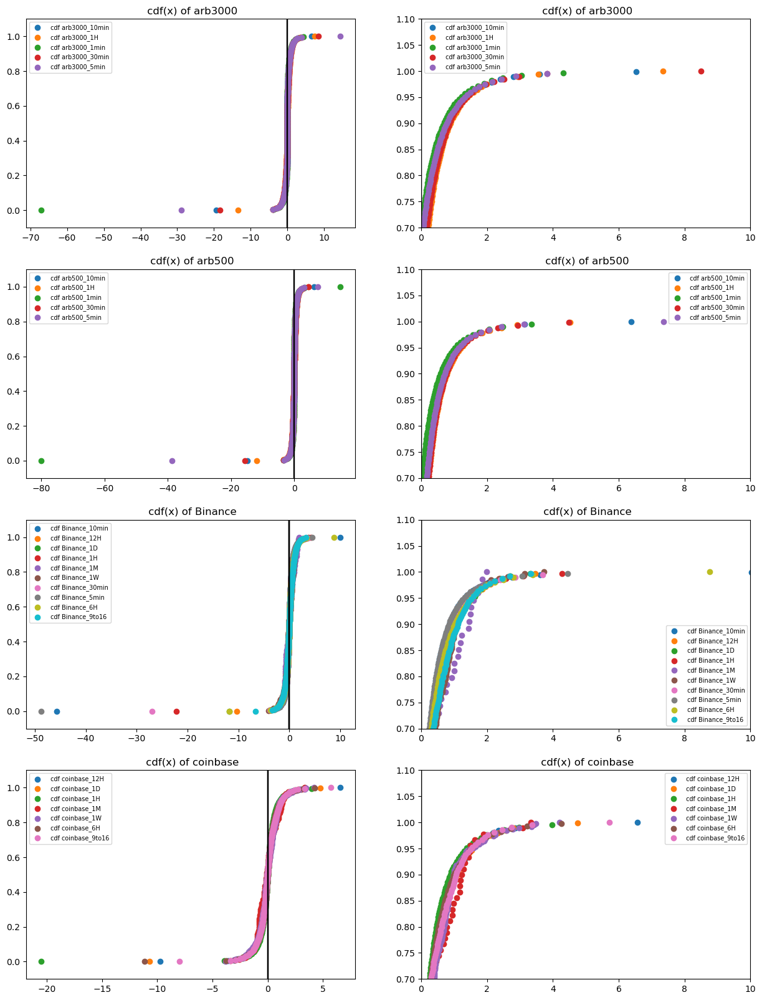

In [34]:
# label_array =['arb3000','arb500','Binance','coinbase']
label_array =['arb3000','arb500','Binance']

fig, ax = plt.subplots(len(label_array),2)

i=0
for label in label_array:    
    df = df_all[df_all['label']==label]
    time_array = np.unique(df['dT'].values)
    for t in time_array:
        array =df[df['dT']==t]['return'][1:].values
        array = array[array!=0]
        print(f'skewness of {label}_{t} is {sci.stats.skew(normalize(array))}' )
        df_plot = cdf_df(array)
        
        #plot at most 200 points
        N = max( int(np.floor(len(array)/200)) , 1)
        for j in [0,1]:
            ax[i,j].scatter( df_plot['x'][::N], df_plot['y'][::N] ,label= f' cdf {label}_{t}' )    
            if j==0:
                ax[i,j].set_ylim(-0.1,1.1)
            else:
                ax[i,j].set_xlim(0,10)
                ax[i,j].set_ylim(0.7,1.1)
            ax[i,j].set_title(f' cdf(x) of {label}')
            ax[i,j].axvline(x=0,c='k')
            ax[i,j].legend()
            ax[i,j].legend(prop={'size': 7}) 
    i+=1
fig.set_size_inches(15,4*(i+1))



#### daily , different startting time

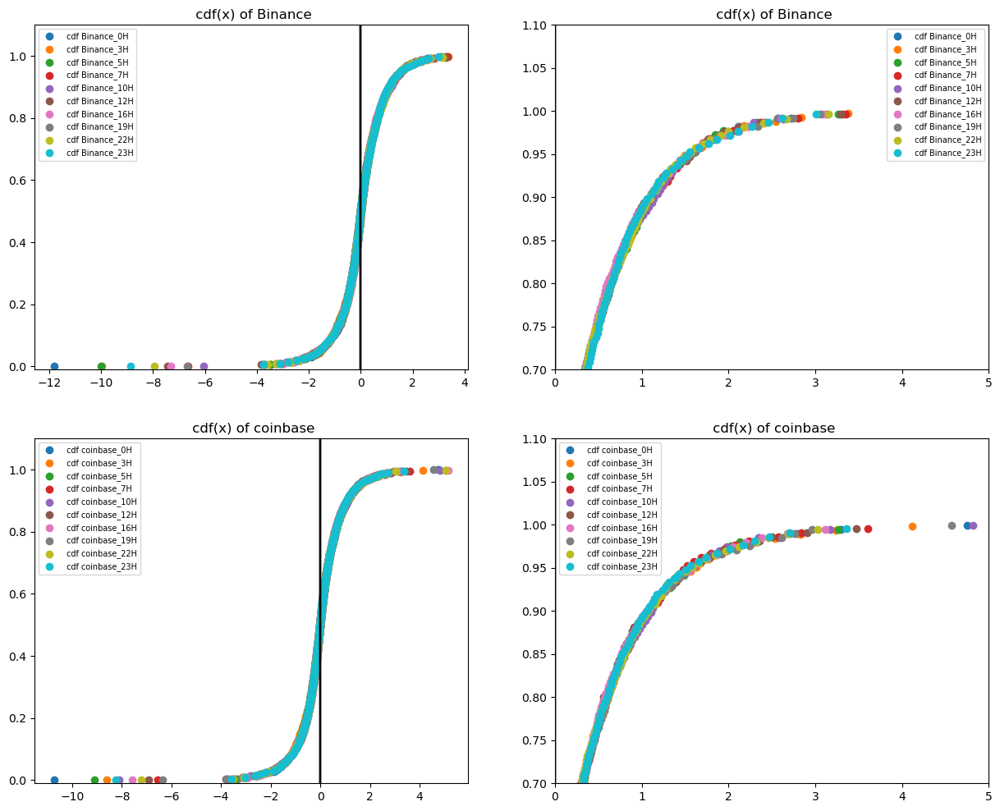

In [38]:
label_array =['Binance','coinbase']
fig, ax = plt.subplots(len(label_array),2)

i=0
for label in label_array:    
    df = df_daily[df_daily['label']==label]
    for t in [ f'{x}H' for x in [0,3,5,7,10,12,16,19,22,23]]:
        array =df[df['start']==t]['return'][1:].values
        array = array[array!=0]
        df_plot = cdf_df(array)
        
        #only plot 200 points
        N = int(np.floor(len(array)/200))
        for j in [0,1]:
            ax[i,j].scatter( df_plot['x'][::N], df_plot['y'][::N] ,label= f' cdf {label}_{t}' )    
            if j==0:
                ax[i,j].set_ylim(-0.01,1.1)
            else:
                ax[i,j].set_xlim(0,5)
                ax[i,j].set_ylim(0.7,1.1)
            ax[i,j].set_title(f' cdf(x) of {label}')
            ax[i,j].axvline(x=0,c='k')
            ax[i,j].legend()
            ax[i,j].legend(prop={'size': 7}) 
    i+=1
fig.set_size_inches(15,4*(i+1))

### log cdf

C:\Users\std92\AppData\Local\Temp\ipykernel_16360\1400181437.py:24: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[i,j].set_ylim(top=1)
C:\Users\std92\AppData\Local\Temp\ipykernel_16360\1400181437.py:28: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[i,j].set_ylim(0,0.04)


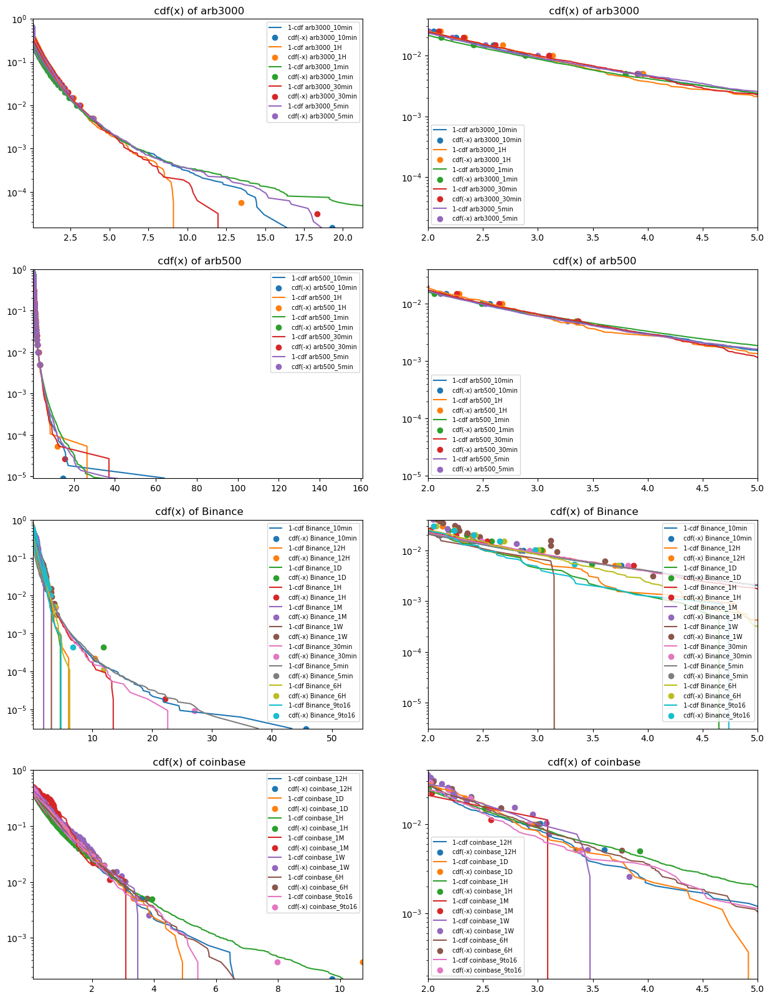

In [46]:
label_array =['arb3000','arb500','Binance','coinbase']
fig, ax = plt.subplots(len(label_array),2)

i=0
for label in label_array:    
    df = df_all[df_all['label']==label]
    time_array = np.unique(df['dT'].values)
    for t in time_array:
        array =df[df['dT']==t]['return'][1:].values
        array = array[array!=0]
        df_plot = cdf_df(array)
        
        #only plot 200 points
        N = int(np.floor(len(array)/200))
        for j in [0,1]:
            ax[i,j].plot(df_plot['x'], 1-df_plot['y'] ,label= f' 1-cdf {label}_{t}' )
            # only plot at most 200 points
            N = max( int(np.floor(len(array)/200)),1)
            ax[i,j].scatter( -df_plot['x'][::N], df_plot['y'][::N] ,label= f' cdf(-x) {label}_{t}' )    
            ax[i,j].set_title(f' log 1-cdf, cdf(-x) of {label}')
        
            if j == 0:
                ax[i,j].set_xlim(left=0.1)
                ax[i,j].set_ylim(top=1)
        
            else:
                ax[i,j].set_xlim(2,5)
                ax[i,j].set_ylim(0,0.04)
            ax[i,j].set_yscale('log')

            ax[i,j].set_title(f' cdf(x) of {label}')
            ax[i,j].axvline(x=0,c='k')
            ax[i,j].legend()
            ax[i,j].legend(prop={'size': 7}) 
    i+=1
fig.set_size_inches(15,4*(i+1))



#### daily, different starting time

C:\Users\std92\AppData\Local\Temp\ipykernel_16360\970721755.py:25: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[i,j].set_ylim(0,0.04)


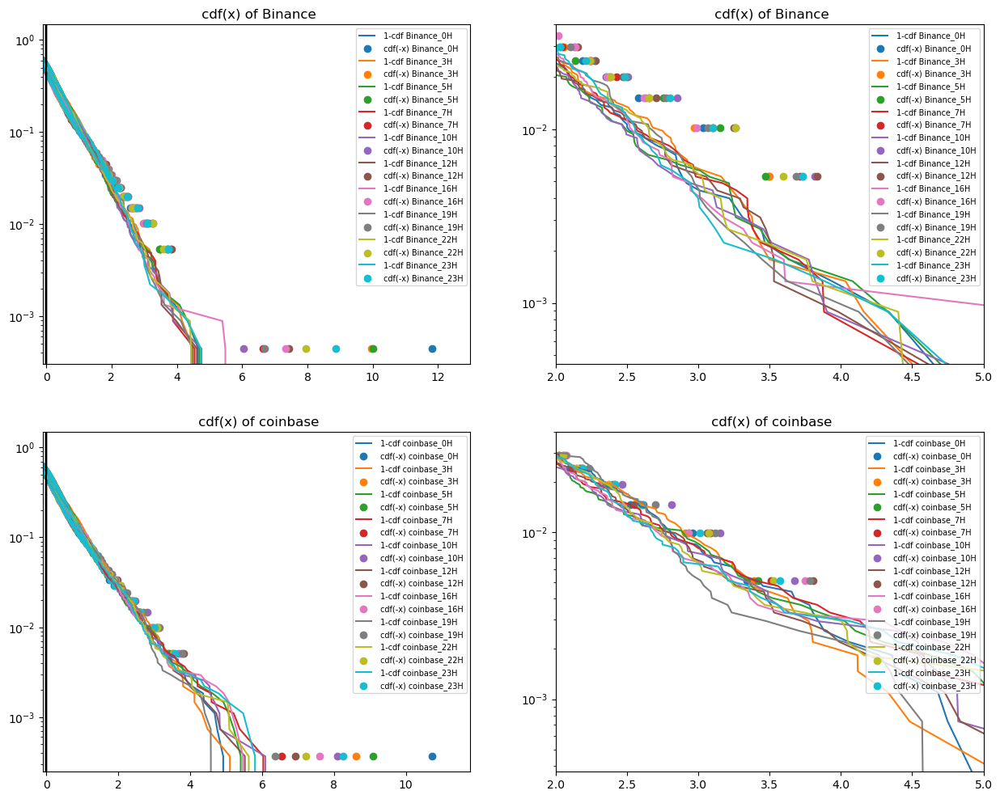

In [43]:
label_array =['Binance','coinbase']
fig, ax = plt.subplots(len(label_array),2)

i=0
for label in label_array:    
    df = df_daily[df_daily['label']==label]
    for t in [ f'{x}H' for x in [0,3,5,7,10,12,16,19,22,23]]:
        array =df[df['start']==t]['return'][1:].values
        array = array[array!=0]
        df_plot = cdf_df(array)
        
 #only plot 200 points
        N = int(np.floor(len(array)/200))
        for j in [0,1]:
            ax[i,j].plot(df_plot['x'], 1-df_plot['y'] ,label= f' 1-cdf {label}_{t}' )
            #for cdf(-x), only plot 200 points
            N = max( int(np.floor(len(array)/200)),1)
            ax[i,j].scatter( -df_plot['x'][::N], df_plot['y'][::N] ,label= f' cdf(-x) {label}_{t}' )    
            ax[i,j].set_title(f' log 1-cdf, cdf(-x) of {label}')
        
            if j == 0:
                ax[i,j].set_xlim(left=-0.1)        
            else:
                ax[i,j].set_xlim(2,5)
                ax[i,j].set_ylim(0,0.04)
            ax[i,j].set_yscale('log')  
            ax[i,j].set_title(f' cdf(x) of {label}')
            ax[i,j].axvline(x=0,c='k')
            ax[i,j].legend()
            ax[i,j].legend(prop={'size': 7}) 
    i+=1
fig.set_size_inches(15,4*(i+1))

#### log cdf(-x) and log 1-cdf, same label different freq

## Additional on distribution

### rolling window sampling for data
1D , 1W , 1M

In [20]:
df_list_rolling = []
tempt =[]
T_list = ['1D' , '1W' , '1M']
for df in df_list:
    if (df.dT[0] in T_list) or ( df.dT[0]=='5min' ):
        continue
    else:
        df_list_rolling.append(df)
        if df.dT[0] =='10min':
            print(df.label[0],df.token[0])
            for dT in T_list:
                tempt.append(rolling_window(df,dT))

for i,df in enumerate(df_list_rolling):
    dff = df_all[df_all.label==df.label[0]]
    t_array = dff[~dff.dT.duplicated(keep='last')].dT.values
    t_last = np.setdiff1d(t_array,T_list,assume_unique=True)[-1]
    if df.dT[0] == t_last:
        df_D = tempt.pop(0)
        df_W = tempt.pop(0)
        df_M = tempt.pop(0)
        df_list_rolling[i+1:i+1]= [df_D,df_W,df_M]
    if tempt ==[]:
        print('end')
        break

arb_3000 WETH & USDC
arb_3000 WETH & DAI
arb_500 WETH & USDC
arb_500 WETH & USDT
m_3000 WETH & USDC
m_3000 WETH & USDT
m_3000 WETH & DAI
m_500 WETH & USDC
Binance ETH & USD
Binance all ETH & USD
Binance BTC & USD
end


In [121]:
tempt = pd.concat(df_list_rolling)
tempt.to_csv('Data/organized data/rollingwindow_pool_CEX.csv')

### plot all pdf together

In [ ]:
color_list = hex_colors[::2]
fix , ax = plt.subplots(1,3, figsize=(20,5))
k=0
for df in df_list_rolling:    
    label = df.label[0]
    token = df.token[0]
    t = df.dT[0]
    array_0 =df['return'][1:].values
        # for CEX , plot as usual
    if label == 'Binance':
        array_1 = array_0
        array_2 = array_0
    else:  #for pool remove neighborhood of zero
        array_1 = array_0[array_0 != 0]
        std = np.std(array_1)
        array_2 = array_1[np.logical_or(array_1 < -0.01*std , array_1 > 0.01*std)]
    prob0, bins0= plot_pdf(array_0);
    ax[0].scatter(bins0[:-1], prob0,label= f'{label}_{t}_{token}' ,color = color_list[k])


    prob1, bins1= plot_pdf(array_1);
    ax[1].scatter(bins1[:-1], prob1,label= f'{label}_{t}_{token}' ,color = color_list[k])

    prob2, bins2= plot_pdf(array_2);
    ax[2].scatter(bins2[:-1], prob2,label= f'{label}_{t}_{token}' ,color = color_list[k])        
    k+= 1
#plot standard normal
x = np.linspace(-5,5,1000)
norm=sci.stats.norm.pdf(x,0,1)
for i in [0,1,2]:
    ax[i].plot(x,norm,color='red',label = 'standard normal')
    ax[i].legend(prop={'size': 6})
    ax[i].set_xlabel('value')
    ax[i].set_ylabel('Prob')
    ax[i].set_xlim(-5,5)
ax[0].set_title(f'pdf, with zeros ')
ax[1].set_title(f'pdf, without zeros ')
ax[2].set_title(f'pdf, without neighbor of zero ')
plt.suptitle('complete data', fontsize=22)

### plot all cdf together

log cdf(-x) , 1- cdf(x) : (1)include zeros but shift cdf(-x) (2)without neighbor of zero

Text(0.5, 1.0, 'log cdf & log cdf, shift and w.o neighborhood of zero ')

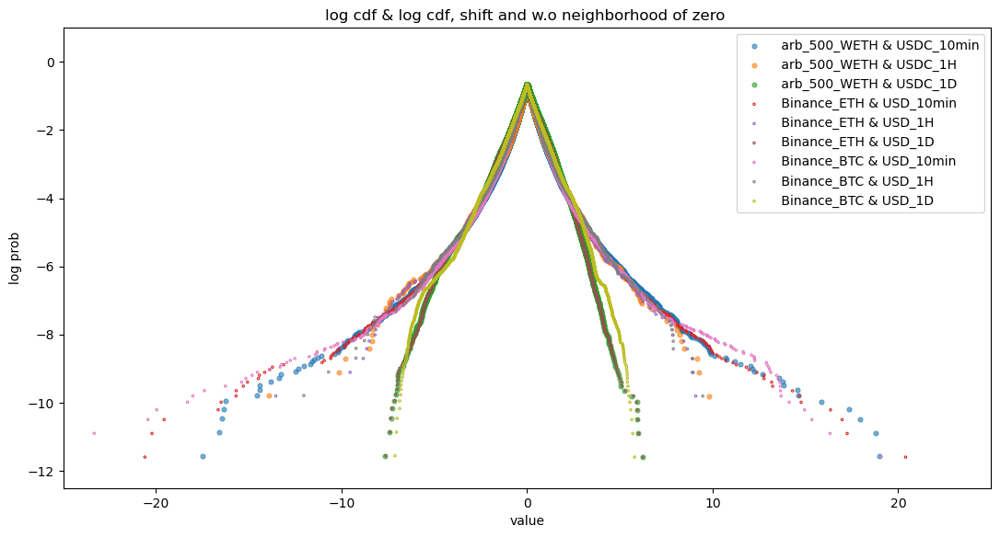

In [154]:
plt.figure(figsize=(13,6.5) )
time_list =['10min','1H','1D']

#color_list = hex_colors[::10]
k=0
for df in df_list_rolling:    
    label = df.label[0]
    token= df.token[0]
    dT = df.dT[0]
    if (dT not in time_list) or ( ( (token != 'WETH & USDC') or (label != 'arb_500') ) and (label != 'Binance')   ):
        continue
    else:
        if label=='arb_500':
            size = 13
            a = 0.6
            face = c_cycle[k]
        else:
            size = 3
            a = 1
            face = 'none'
        array =df['return'][1:].values
        std = np.std(array)
        array = array[np.logical_or(array < -0.001*std , array > 0.001*std)]

        df_plot = shiftlogcdf_df(array)
        #plt.scatter(df_plot['x'], df_plot['y'] ,label= f' {label}_{token}_{dT}',c=color_list[k],s=4 )
        plt.scatter(df_plot['x'], df_plot['y'] ,label= f' {label}_{token}_{dT}',s=size, alpha = a,facecolor= face
                    ,edgecolors=c_cycle[k], linewidths= 0.8 )
        k+= 1
plt.xlim(-25,25)
plt.ylim(-12.5,1)
plt.xlabel('value')
plt.ylabel('log prob')
#plt.legend(prop={'size': 5.5})
plt.legend()
plt.title(f'log cdf & log cdf, shift and w.o neighborhood of zero ')



### rolling sum for data

In [195]:
df_list_rollingsum = []
for df in df_list:
    if df.dT[0] != '10min':
        continue
    else:
        print(df.label[0],df.token[0])
        df_list_rollingsum.append(df)
        for dT in ['1H','1D' , '1W' , '1M']:
            df_list_rollingsum.append(rolling_sum(df,dT))
tempt = pd.concat(df_list )
tempt.to_csv('Data/organized data/big_dataframe_rollingsum.csv')

arb_3000 WETH & USDC
arb_3000 WETH & DAI
arb_500 WETH & USDC
arb_500 WETH & USDT
m_3000 WETH & USDC
m_3000 WETH & USDT
m_3000 WETH & DAI
m_500 WETH & USDC
Binance ETH & USD
Binance BTC & USD


In [163]:
def token_index(label,token):
    df = df_all[df_all.label==label]
    token_list = list(np.unique(df.token.values))
    return token_list.index(token)

#### all data

D:\Anaconda\lib\site-packages\IPython\core\events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
D:\Anaconda\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


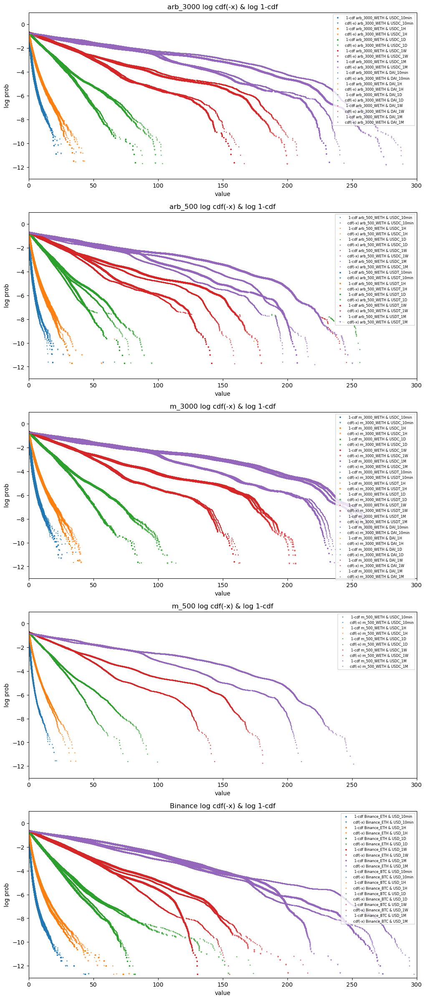

In [305]:
marker_list =[ ('.' ,'1') , ('s' ,'v'), ('+', 'X') ]
color = [ 'k','#454343'] 
color_dict ={ '10min':'#1f77b4' ,'1H': '#ff7f0e' , '1D': '#2ca02c' , '1W': '#d62728', '1M':'#9467bd' }
label_dict = { 'arb_3000':0,'arb_500':1, 'm_3000':2,'m_500':3 , 'Binance':4 }
label_list= list(label_dict.keys())
fig ,ax=plt.subplots(len(label_dict),1,figsize=(12,len(label_dict)*6) )

for i,df in enumerate(df_list_rollingsum):
    k= label_dict[df.label[0]]
    t = df.dT[0]
    label = df.label[0]
    token= df.token[0]
    index = token_index(label,token)
    array =df['scaled return'][1:].values

    std = np.std(array)
    array = array[np.logical_or(array < -0.001*std , array > 0.001*std)]

    df_plot = shiftlogcdf_df(array)
    ax[k].scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , c = color_dict[t] 
                  , marker= marker_list[index][0], label= f'  1-cdf {label}_{token}_{t}',s=2 )
    ax[k].scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_dict[t] 
                  , marker = marker_list[index][1] , label= f' cdf(-x) {label}_{token}_{t}',s=4 , alpha= 0.6 )
for j in range(len(label_dict)):
    ax[j].set_xlim(0,300)
    ax[j].set_ylim(-13,1)
    ax[j].set_xlabel('value')
    ax[j].set_ylabel('log prob')
    ax[j].legend(prop={'size': 6})
    ax[j].set_title(f'{label_list[j]} log cdf(-x) & log 1-cdf')


#### partial data (1,seperate)

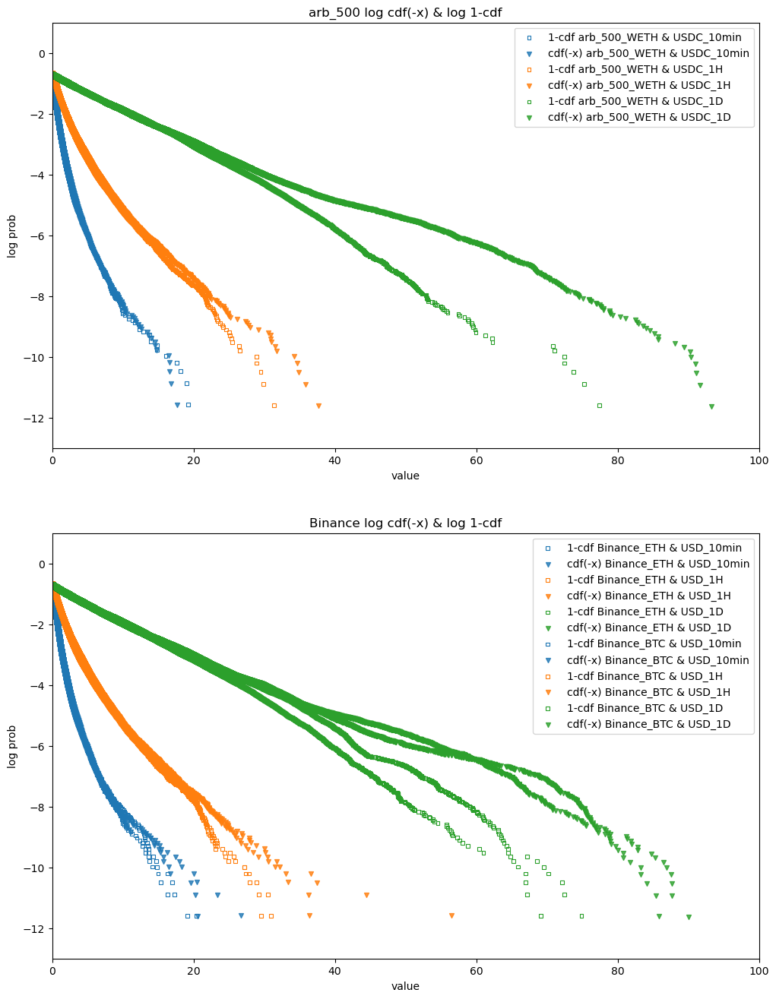

In [200]:
marker_list =['s','v']
color = [ 'k','#454343'] 
color_dict ={ '10min':'#1f77b4' ,'1H': '#ff7f0e' , '1D': '#2ca02c'}
label_dict = { 'arb_500':0,  'Binance':1 }
label_list= list(label_dict.keys())
fig ,ax=plt.subplots(len(label_dict),1,figsize=(12,len(label_dict)*8) )

for i,df in enumerate(df_list_rollingsum):
    if (df.label[0] not in label_list) or ( df.dT[0] not in list(color_dict.keys()) ):
        continue
    k= label_dict[df.label[0]]
    if (k== 0) and (df.token[0] != 'WETH & USDC'):
        continue
    t = df.dT[0]
    label = df.label[0]
    token= df.token[0]
    array =df['scaled return'][1:].values

    std = np.std(array)
    array = array[np.logical_or(array < -0.001*std , array > 0.001*std)]

    df_plot = shiftlogcdf_df(array)
    ax[k].scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , marker= marker_list[0], label= f'1-cdf {label}_{token}_{t}'
                  ,s=12 , facecolor ='none', edgecolor = color_dict[t], linewidth = 0.8 )
    ax[k].scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_dict[t] 
                  , marker = marker_list[1] , label= f'cdf(-x) {label}_{token}_{t}',s=18 , alpha= 0.8 )
for j in range(len(label_dict)):
    ax[j].set_xlim(0,100)
    ax[j].set_ylim(-13,1)
    ax[j].set_xlabel('value')
    ax[j].set_ylabel('log prob')
    ax[j].legend()
    ax[j].set_title(f'{label_list[j]} log cdf(-x) & log 1-cdf')


#### partial data(1,combine)

In [ ]:
marker_list =['s','v']
color = [ 'k','#454343'] 
color_dict ={ '10min':['#1f77b4', '#d62728', '#e377c2'],'1H': ['#ff7f0e', '#9467bd', '#7f7f7f'] , '1D': ['#2ca02c', '#8c564b','#bcbd22' ]}
label_dict = { 'arb_500':0, 'm_500':1,'Binance':2}
label_list= list(label_dict.keys())
plt.figure(figsize=(14,9))
for i,df in enumerate(df_list_rollingsum):
    if (df.label[0] not in label_list) or ( df.dT[0] not in list(color_dict.keys()) ):
        continue
    k= label_dict[df.label[0]]
    if (k!= 2) and (df.token[0] != 'WETH & USDC'):
        continue
    if (k== 2) and (df.token[0] != 'ETH & USD'):
        continue   
    
    t = df.dT[0]
    label = df.label[0]
    token= df.token[0]
    array =df['scaled return'][1:].values
    mu = np.mean(array)
    array = array[np.logical_or(array < -0.001*std , array > 0.001*std)]
    std = np.std(array)
    df_plot = shiftlogcdf_df(array)
    plt.scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , marker= marker_list[0], label= f'1-cdf {label}_{token}_{t}'
                  ,s=12 , facecolor ='none', edgecolor = color_dict[t][k], linewidth = 0.8 )
    plt.scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_dict[t][k] 
                  , marker = marker_list[1] , label= f'cdf(-x) {label}_{token}_{t}',s=18 , alpha= 0.8 )
    
    if k==2 and t=='1D':
        x =df_plot[df_plot.x >=0]['x']
        norm= sci.stats.norm.cdf(x,mu,std)
        plt.plot(x,np.log(1-norm),c='k', label=f'normal fit of {label} {t}')
    plt.xlim(0,100)
    plt.ylim(-12.5,1)
    plt.xlabel('value')
    plt.ylabel('log prob')
    plt.legend(prop={'size': 7})
    plt.title('log cdf(-x) & log 1-cdf')


#### partial data(2)

In [222]:
#only ETH and BTC, whole timeframe
token_1 = 'USD'
time_list_bin = ['10min','1H']
df_list_bin = []
for token_0 in ['ETH' , 'BTC']:
    for T in time_list_bin:
        df=  pd.read_csv(f'Data/Binance/{token_0}/{token_0}_{token_1}_{T}.csv' , index_col = 'datetime') 
        df.index = pd.to_datetime(df.index)
        df['return'] = np.log(df['close']) - np.log(df['close'].shift(1))
        df['dT'] = T
        df['label']='Binance'
        df['token'] = f'{token_0} & {token_1}' 
        df_list_bin.append(df)
        
df_list_bin_rollingsum = []
for df in df_list_bin:
    if df.dT[0] != '10min':
        continue
    else:
        print(df.label[0],df.token[0])
        df['scaled return']= df[['return']].apply(lambda col : col/std_array(col) )
        df_list_bin_rollingsum.append(df)
        for dT in ['1H','1D']:
            df_list_bin_rollingsum.append(rolling_sum(df,dT))

Binance ETH & USD
Binance BTC & USD


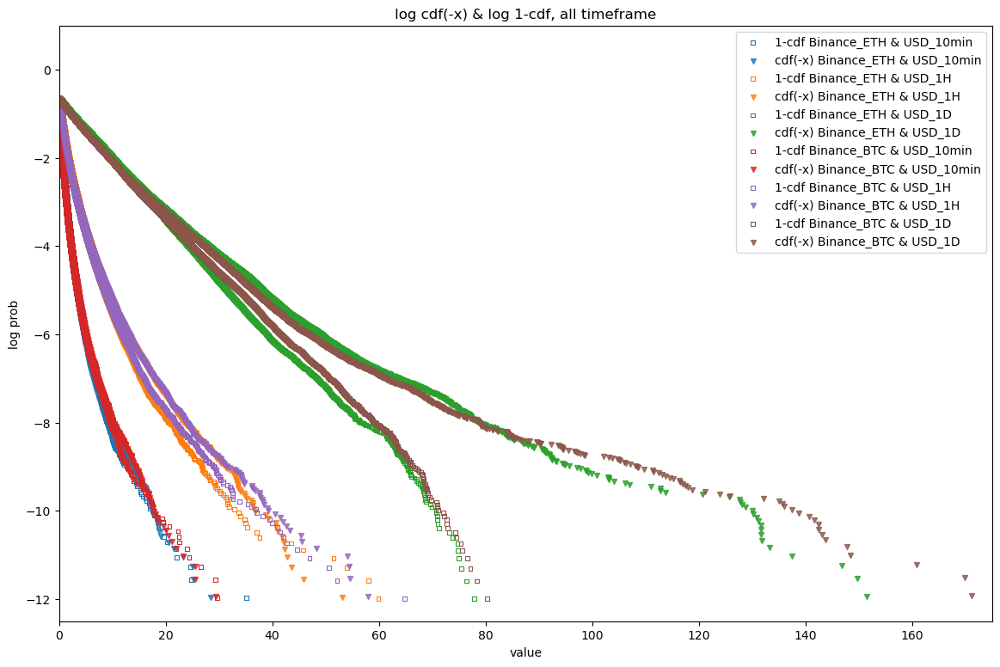

In [228]:
marker_list =['s','v']
color_dict ={ '10min':['#1f77b4', '#d62728', '#e377c2'],'1H': ['#ff7f0e', '#9467bd', '#7f7f7f'] , '1D': ['#2ca02c', '#8c564b','#bcbd22' ]}
token_dict = { 'ETH & USD':0 , 'BTC & USD':1 }
plt.figure(figsize=(14,9))
for i,df in enumerate(df_list_bin_rollingsum):
    token= df.token[0]
    k = token_dict[token]
    t = df.dT[0]
    label = df.label[0]
    array =df['scaled return'][1:].values

    array = array[np.logical_or(array < -0.001*std , array > 0.001*std)]

    df_plot = shiftlogcdf_df(array)
    plt.scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , marker= marker_list[0], label= f'1-cdf {label}_{token}_{t}'
                  ,s=12 , facecolor ='none', edgecolor = color_dict[t][k], linewidth = 0.8 )
    plt.scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_dict[t][k] 
                  , marker = marker_list[1] , label= f'cdf(-x) {label}_{token}_{t}',s=18 , alpha= 0.8 )
    plt.xlim(0,175)
    plt.ylim(-12.5,1)
    plt.xlabel('value')
    plt.ylabel('log prob')
    plt.legend()
    plt.title('log cdf(-x) & log 1-cdf, all timeframe')


In [ ]:
# df_all_rolling = pd.read_csv('Data/organized data/big_dataframe_rollingsum.csv',index_col=0)
# df_all_rolling.index = pd.to_datetime(df_all_rolling.index)

## ACF

In [31]:
#time_list=['10min','1H','1D','1W','1M']

time_list=['1H'] #1hr only


df1 = df_all.copy()
df = df1[df1.dT.isin(time_list)]
#df = df[(df.index<'2023-3-11') | (df.index>'2023-3-14')] #depgegging peroid
#acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf(x[1:],nlags=10,fft=False))
acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf(x[1:],nlags=96,fft=False))

df_acf = pd.DataFrame(dict(acf)).reset_index()
df_acf = df_acf.rename(columns={'index':'Lags'})
df_acf =df_acf.melt(id_vars='Lags',var_name=['label','token','dT'] )


In [73]:
# roughly define an error bar depend on pool and freq
def eBar(lab_index,dT):
    if lab_index == 0:
        dic = {'10min':112000  , '1H': 19200, '1D': 800,  '1W': 116, '1M':1}
    elif lab_index ==1 :
        dic = {'10min':117000  , '1H': 19200, '1D': 820,  '1W': 116, '1M':1}
    else:
         dic = {'10min': 324000   , '1H': 54000, '1D': 2250,  '1W': 323, '1M':75}
    return 2/np.sqrt(dic[dT])

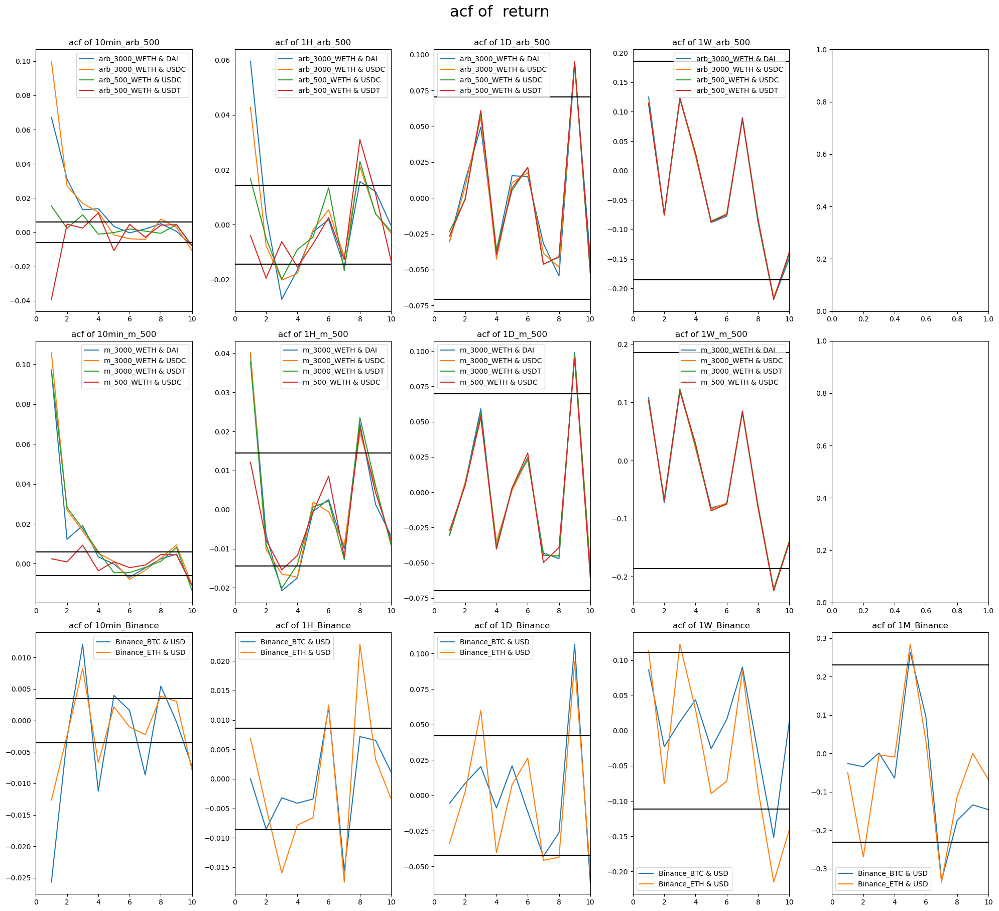

In [266]:
n0= len(time_list)
label_dict = {'arb_3000': 0, 'arb_500': 0, 'm_3000': 1, 'm_500': 1, 'Binance': 2}
fig , ax = plt.subplots(3,n0,figsize=(4*n0,18 ) ) 
for i,t in enumerate(time_list):
    for lab in label_dict.keys():
        df1= df_acf[(df_acf.label==lab)&(df_acf.dT== t)]
        j = label_dict[lab]
        for token in np.unique(df1.token.values):
            df = df1[df1.token == token]
            ax[j,i].plot(df.Lags[1:],df['value'][1:],label=f'{lab}_{token}')
        if ((j==0) or (j==1)) and (t == '1M'):
            pass
        else:
            error = eBar(j,t)
            ax[j,i].axhline(y=error,c='k')
            ax[j,i].axhline(y=-error,c='k')
            ax[j,i].set_xlim(0,10)
            #ax[j,i].set_ylim(-0.1,0.1)
            ax[j,i].set_title(f'acf of {t}_{lab}')
            ax[j,i].legend()
plt.suptitle('acf of  return', fontsize=22,y=1.005)
plt.tight_layout()

#### 1H only

In [ ]:
for df in  df_list:
    if (df.token[0] =='WETH & DAI') or ( df.dT[0] != '1H'):
            continue
    print(df.label[0], df.token[0], len(df))

arb_3000 WETH & USDC 18126
arb_500 WETH & USDC 18126
arb_500 WETH & USDT 18126
m_3000 WETH & USDC 18126
m_3000 WETH & USDT 18126
m_500 WETH & USDC 18126
Binance ETH & USD 18126
Binance BTC & USD 18126


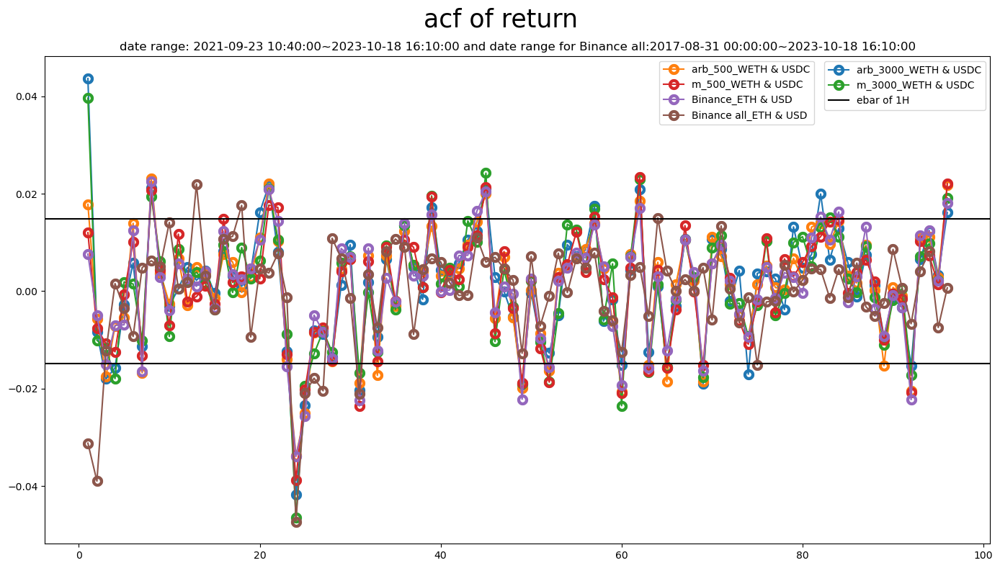

In [41]:
#line + dots version
label_list = ['arb_3000', 'arb_500', 'm_3000', 'm_500', 'Binance','Binance all']
fig,ax=plt.subplots(figsize=(14,8))
for k,lab in enumerate(label_list):
    df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
    for token in np.unique(df1.token.values):
        if (token =='WETH & DAI') or (token =='WETH & USDT') or (token =='BTC & USD'):
            continue
        df = df1[df1.token == token]
        ax.plot(df.Lags[1:],df['value'][1:],label=f'{lab}_{token}',marker='.'
                 ,mfc ='none',mew=8)
        #ax.scatter( df.Lags[1:],df['value'][1:],label=f'{lab}_{token}',marker='o', facecolors='none',edgecolors=c_cycle[k] )
        #ax.scatter( df.Lags[1:],df['value'][1:],label=f'{lab}_{token}')
ax.axhline(y= 2/np.sqrt(18126),c='k',label=f'ebar of 1H')
ax.axhline(y=-2/np.sqrt(18126),c='k')
handles, labels = ax.get_legend_handles_labels()

first_legend = ax.legend(handles=[handles[0],handles[2],handles[6]])
ax.add_artist(first_legend)
ax.legend(handles=[handles[1],handles[3],handles[4],handles[5]],loc=(0.65,0.86))
ax.set_title(f'date range: {start_time}~{end_time} and date range for Binance all:{start_time_all}~{end_time}')
plt.suptitle('acf of return', fontsize=25)
plt.tight_layout()

### Abs return

In [55]:
#time_list=['10min','1H','1D','1W','1M']
time_list=['1H'] #1hr only

df1 = df_all.copy()
df = df1[df1.dT.isin(time_list)]
#df = df[(df.index<'2023-3-11') | (df.index>'2023-3-14')]
#acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf( np.abs(x[1:]),nlags=10,fft=False))
acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf( np.abs(x[1:]),nlags=96,fft=False))

df_acf = pd.DataFrame(dict(acf)).reset_index()
df_acf = df_acf.rename(columns={'index':'Lags'})
df_acf =df_acf.melt(id_vars='Lags',var_name=['label','token','dT'] )

#### 1H only

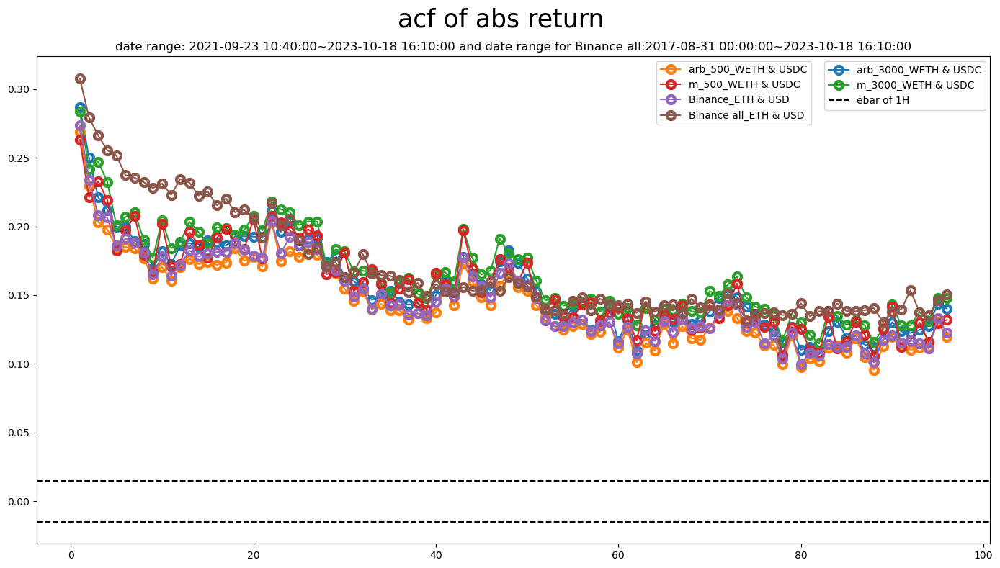

In [58]:
label_list = ['arb_3000', 'arb_500', 'm_3000', 'm_500', 'Binance','Binance all']
fig,ax=plt.subplots(figsize=(14,8))
for k,lab in enumerate(label_list):
    df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
    for token in np.unique(df1.token.values):
        if (token =='WETH & DAI') or (token =='WETH & USDT') or (token =='BTC & USD'):
            continue
        df = df1[df1.token == token]
        ax.plot(df.Lags[1:],df['value'][1:],label=f'{lab}_{token}',marker='.'
                 ,mfc ='none',mew=8)
        #ax.scatter( df.Lags[1:],df['value'][1:],label=f'{lab}_{token}',marker='o', facecolors='none',edgecolors=c_cycle[k] )
        #ax.scatter( df.Lags[1:],df['value'][1:],label=f'{lab}_{token}')
ax.axhline(y= 2/np.sqrt(18126),c='k',linestyle='dashed', label=f'ebar of 1H')
ax.axhline(y=-2/np.sqrt(18126),c='k',linestyle='dashed')
handles, labels = ax.get_legend_handles_labels()

first_legend = ax.legend(handles=[handles[0],handles[2],handles[6]])
ax.add_artist(first_legend)
ax.legend(handles=[handles[1],handles[3],handles[4],handles[5]],loc=(0.65,0.86))
ax.set_title(f'date range: {start_time}~{end_time} and date range for Binance all:{start_time_all}~{end_time}')
plt.suptitle('acf of abs return', fontsize=25)
plt.tight_layout()

### Square return

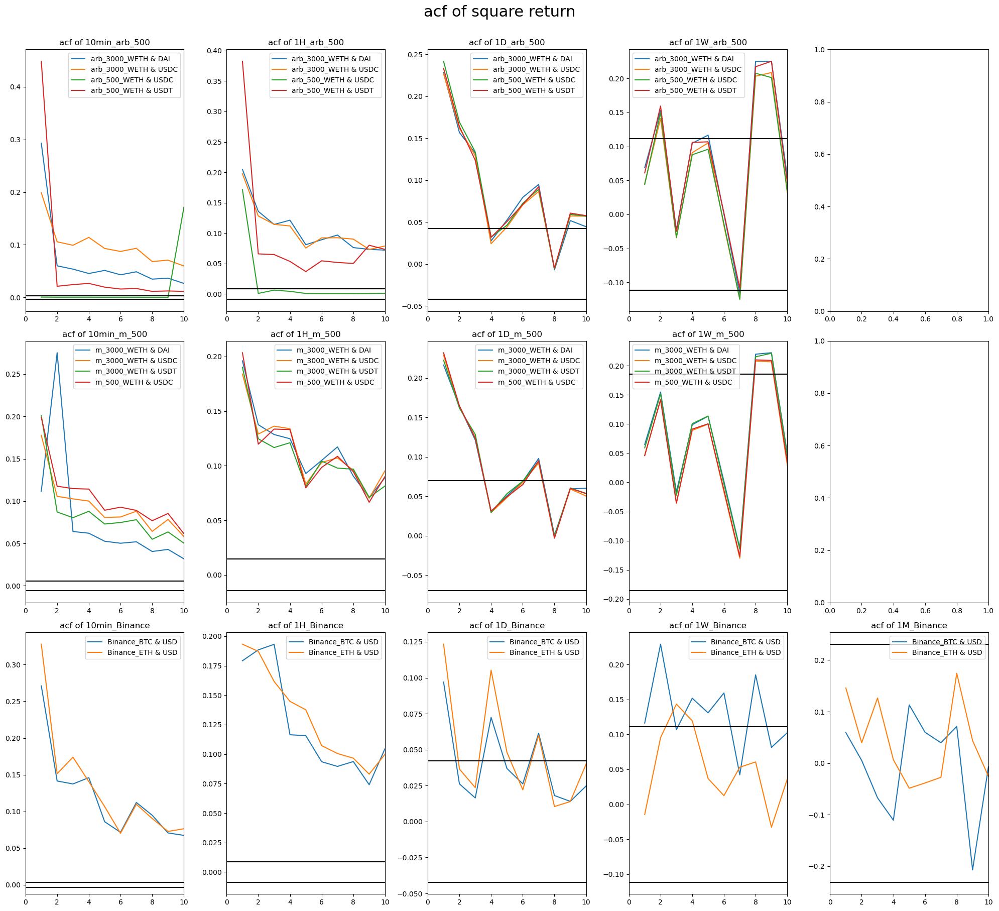

In [430]:
df1 = df_all.copy()
df = df1[df1.dT.isin(time_list)]
acf = df.groupby(['label','token','dT'])['return'].apply(lambda x :st.tsa.stattools.acf( x[1:]**2,nlags=10,fft=False))

df_acf = pd.DataFrame(dict(acf)).reset_index()
df_acf = df_acf.rename(columns={'index':'Lags'})
df_acf =df_acf.melt(id_vars='Lags',var_name=['label','token','dT'] )

n0= len(time_list)
label_dict = {'arb_3000': 0, 'arb_500': 0, 'm_3000': 1, 'm_500': 1, 'Binance': 2}
fig , ax = plt.subplots(3,n0,figsize=(4*n0,18 ) ) 
for i,t in enumerate(time_list):
    for lab in label_dict.keys():
        df1= df_acf[(df_acf.label==lab)&(df_acf.dT== t)]
        j = label_dict[lab]
        for token in np.unique(df1.token.values):
            df = df1[df1.token == token]
            ax[j,i].plot(df.Lags[1:],df['value'][1:],label=f'{lable}_{token}')
        if ((j==0) or (j==1)) and (t == '1M'):
            pass
        else:
            error = eBar(j,t)
            ax[j,i].axhline(y=error,c='k')
            ax[j,i].axhline(y=-error,c='k')
            ax[j,i].set_xlim(0,10)
            #ax[j,i].set_ylim(-0.1,0.1)
            ax[j,i].set_title(f'acf of {t}_{lab}')
            ax[j,i].legend()
plt.suptitle('acf of square return', fontsize=22,y=1.005)
plt.tight_layout()


## Combine plots & other token/assets

### Combine with SPY, EUR

#### Table

In [23]:
df_check = pd.concat([df_all[df_all.dT=='10min'].copy()]  + df_list_trad )
df_check.loc[:,'label'] = df_check.apply( lambda c: c.label+'_'+c.token , axis =1 )
df_check=df_check.groupby('label').apply(lambda x: 
    pd.Series( { 'timeframe': f"{x.index.min().date()} to {x.index.max().date()}",
                'length(day)': f'{(x.index.max().date() - x.index.min().date()).days}',
                'fraction of zeros(%)': round((x['return'] == 0).sum()*100  / len(x),4 )} ) )


In [24]:
# change label
df = df_check.copy()
df.reset_index(inplace = True)
df.loc[df.label=='Binance all_ETH & USD',  'label'] = 'ETH_all'
df.loc[df.label=='Binance_ETH & USD',  'label'] = 'ETH'
df.loc[df.label=='Binance_BTC & USD',  'label'] = 'BTC'
df.loc[df.label=='EUR all_EUR & USD',  'label'] = 'EUR_all'
df.loc[df.label=='EUR_EUR & USD',  'label'] = 'EUR'
df.loc[df.label=='SPY all_SPY & USD',  'label'] = 'SPY_all'
df.loc[df.label=='SPY_SPY & USD',  'label'] = 'SPY'
df.loc[df.label=='arb_3000_WETH & DAI',  'label'] = 'arb30bp_WETH & DAI'
df.loc[df.label=='arb_3000_WETH & USDC',  'label'] = 'arb30bp_WETH & USDC'
df.loc[df.label=='arb_500_WETH & USDC',  'label'] = 'arb5bp_WETH & USDC'
df.loc[df.label=='arb_500_WETH & USDT',  'label'] = 'arb5bp_WETH & USDT'
df.loc[df.label=='m_3000_WETH & DAI',  'label'] = 'm30bp_WETH & DAI'
df.loc[df.label=='m_3000_WETH & USDC',  'label'] = 'm30bp_WETH & USDC'
df.loc[df.label=='m_3000_WETH & USDT',  'label'] = 'm30bp_WETH & USDT'
df.loc[df.label=='m_500_WETH & USDC',  'label'] = 'm5bp_WETH & USDC'
df.set_index('label',inplace=True)

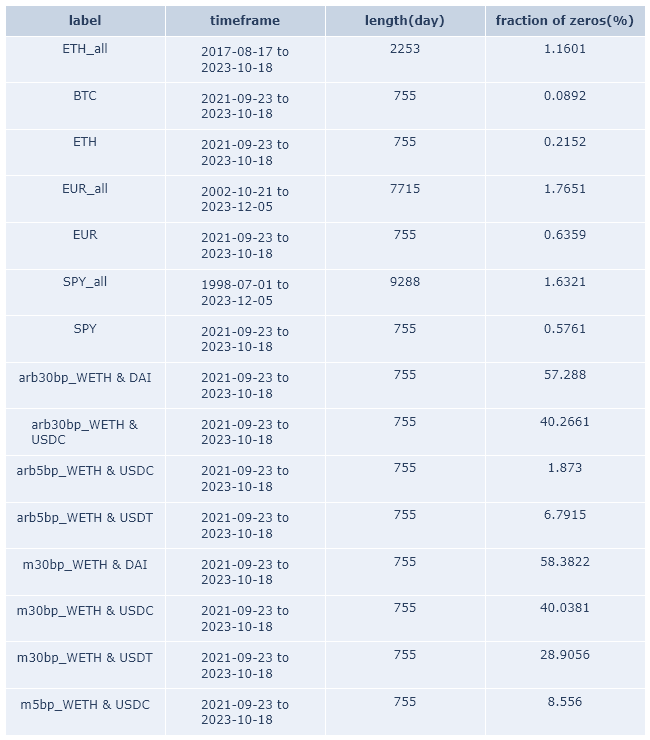

In [25]:
fig = df2img.plot_dataframe(df, fig_size=(650, 740))

#### acf 

In [59]:
# df_trad = pd.read_csv('Data/trad fin data/SPY&EUR_over60min.csv',index_col='datetime')
# df_trad.index = pd.to_datetime(df_trad.index)

In [33]:
nlags=96
prop_cycle = plt.rcParams['axes.prop_cycle']
c_cycle = prop_cycle.by_key()['color']
start_time_all = '2017-08-17 04:00:00'

In [34]:

acf_dict = plot_acf( ['none','abs'],df_all = df_all[~df_all.label.isin(['SPY','EUR'])] , scale=True)    
df1=plot_acf_2(df_all[df_all.label =='SPY'])
df2=plot_acf_2(df_all[df_all.label =='EUR'])
df_ACF= pd.concat([acf_dict['none'].assign(method='none'),
acf_dict['abs'].assign(method='abs'),df1,df2])

2021-09-23 11:00:00
2022-01-21 11:00:00
2023-05-16 11:00:00
2023-09-13 11:00:00
2021-09-23 11:00:00
2022-01-21 11:00:00
2023-01-16 11:00:00
2023-05-16 11:00:00
2023-09-13 11:00:00


Two plots in one( R, absR)

In [ ]:
# label_list = ['arb_3000', 'arb_500', 'm_3000', 'm_500', 'Binance','Binance all','SPY','SPY all','EUR','EUR all']
label_list = ['arb_3000', 'arb_500', 'm_3000', 'm_500', 'Binance','Binance all','SPY','EUR']

fig,ax=plt.subplots(2,1,figsize=(16,14))

for l,method in enumerate(['none','abs']):
    df_acf = df_ACF[df_ACF['method']==method].copy()
    for k,lab in enumerate(label_list):
        df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
        for token in np.unique(df1.token.values):
            if (token =='WETH & DAI') or (token =='WETH & USDT') or (token =='BTC & USD'):
                continue
            df = df1[df1.token == token]
            if lab in ['SPY','EUR']:
                c = {'SPY': 'k','EUR':'darkblue' }[lab]
                ax[l].plot( df.Lags[1:],df['value'][1:],label=lab
                     ,c = c,lw=2)
            else:
                ax[l].plot( df.Lags[1:],df['value'][1:],label=f'{lab}_{token}',marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=7 )

                
    ax[l].axhline(y= 2,c='k',linestyle='dashed', label=f'ebar of 1H')
    ax[l].axhline(y=-2,c='k',linestyle='dashed')
    #labels setting
    handles, labels = ax[l].get_legend_handles_labels()
    n = len(handles)
    first_legend = ax[l].legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=13)
    ax[l].add_artist(first_legend)
    ax[l].legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9 ,fontsize = 13)
    ax[l].set_xlabel('lag(hr)')
    
    #setting ylim and title text w.r.t sepcific method
    if l ==0:
        ylim_p =20
        ylim_n =-20
        title = 'R'
    else :
        ylim_p = 90
        ylim_n = -30
        title = 'absR '
    ax[l].set_ylim(ylim_n,ylim_p)
    ax[l].set_xticks([0,12,24,36,48,60,72,84,96])

    ax[l].set_title( title, fontsize = 17)
#plot daily vline
for x in [0,24,48,72,96]:
    ax[0].axvline(x=x,c='red',linestyle='dashed')
    ax[1].axvline(x=x,c='red',linestyle='dashed')
    
plt.figtext(0.5, 0.95, f'date range: {start_time}~{end_time} and date range for Binance all:{start_time_all}~{end_time}'
            , ha='center', va='top', fontsize=14)
plt.suptitle('acf of return & abs return', fontsize=27)
plt.subplots_adjust(hspace=0.2, top=0.91)

Two plots independent , using WETH&USDC for pools and Binance as CEX ETH   

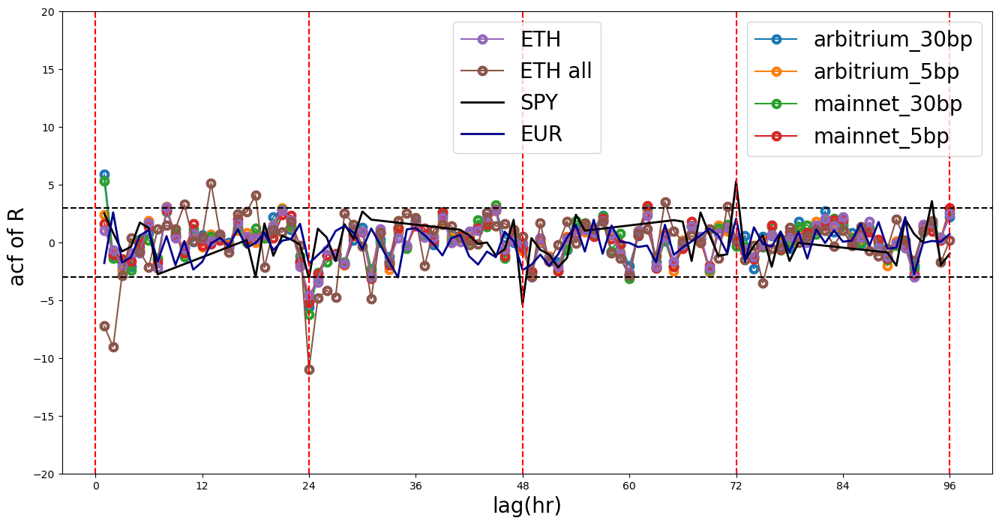

In [574]:
# Return
label_dict = {'arb_3000':'arbitrium_30bp', 'arb_500':'arbitrium_5bp', 'm_3000':'mainnet_30bp', 'm_500':'mainnet_5bp', 
              'Binance':'ETH','Binance all':'ETH all','SPY':'SPY','EUR':'EUR'}
fig,ax = plt.subplots(figsize=(16,8))

df_acf = df_ACF[df_ACF['method']=='none'].copy()
for k,(lab,text) in enumerate(label_dict.items()):
    df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
    for token in np.unique(df1.token.values):
        if (token =='WETH & DAI') or (token =='WETH & USDT') or (token =='BTC & USD'):
            continue
        df = df1[df1.token == token]
        if lab in ['SPY','EUR']:
            c = {'SPY': 'k','EUR':'darkblue' }[lab]
            ax.plot( df.Lags[1:],df['value'][1:],label=text
                 ,c = c,lw=2)
        else:
            ax.plot( df.Lags[1:],df['value'][1:],label=text,marker='.'
                 ,mfc ='none', c = c_cycle[k] ,mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
    #labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9 ,fontsize = 20)
ax.set_xlabel('lag(hr)',fontsize = 20)
ax.set_ylabel('acf of R ', fontsize = 20)


ylim_p =20
ylim_n =-20
    # else :
    #     ylim_p = 90
    #     ylim_n = -30
    #     title = 'absR '
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')


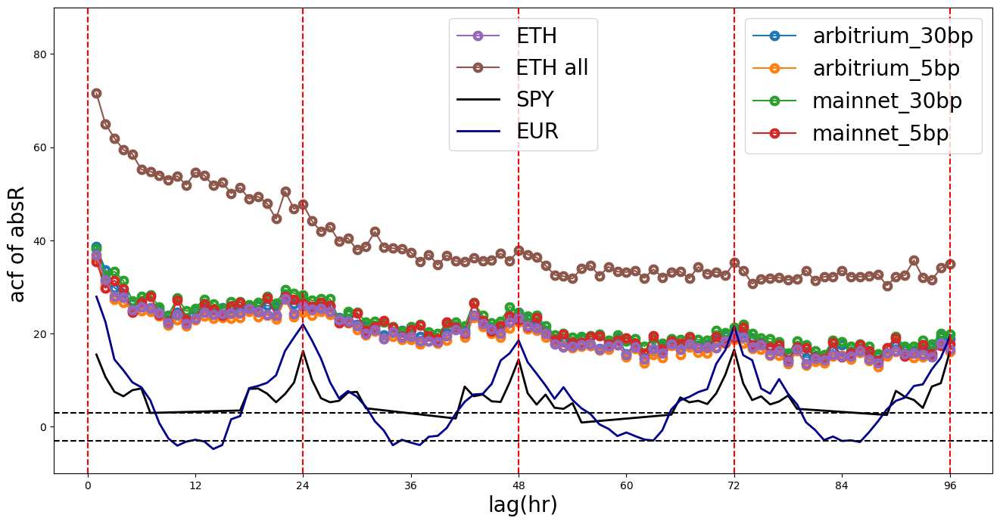

In [594]:
# Return
label_dict = {'arb_3000':'arbitrium_30bp', 'arb_500':'arbitrium_5bp', 'm_3000':'mainnet_30bp', 'm_500':'mainnet_5bp', 
              'Binance':'ETH','Binance all':'ETH all','SPY':'SPY','EUR':'EUR'}
fig,ax = plt.subplots(figsize=(16,8))

df_acf = df_ACF[df_ACF['method']=='abs'].copy()
for k,(lab,text) in enumerate(label_dict.items()):
    df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
    for token in np.unique(df1.token.values):
        if (token =='WETH & DAI') or (token =='WETH & USDT') or (token =='BTC & USD'):
            continue
        df = df1[df1.token == token]
        if lab in ['SPY','EUR']:
            c = {'SPY': 'k','EUR':'darkblue' }[lab]
            ax.plot( df.Lags[1:],df['value'][1:],label=text
                 ,c = c,lw=2)
        else:
            ax.plot( df.Lags[1:],df['value'][1:],label=text,marker='.'
                 ,mfc ='none', c = c_cycle[k] ,mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
    #labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9 ,fontsize = 20)
ax.set_xlabel('lag(hr)',fontsize = 20)
ax.set_ylabel('acf of absR ', fontsize = 20)


ylim_p =90
ylim_n =-10
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')


Acf of absR for Binance 9to16 and compare it with SPY and EUR. We see the periodic behavior comes from our treatment to non-24/7 data

In [581]:
df_9to16 = df_all[(df_all.label=='Binance')&(df_all.token=='ETH & USD')&(df_all.dT=='1H')].copy()

df_9to16.index= df_9to16.index.tz_localize('UTC')
df_9to16.index = df_9to16.index.tz_convert('America/New_York')
df_9to16.index= df_9to16.index.tz_localize(None)
df_9to16=df_9to16.between_time('09:00','16:00')

In [582]:
df_acf = plot_acf_2(df_9to16)

2021-09-23 09:00:00
2022-01-21 09:00:00
2022-05-21 09:00:00
2022-09-18 09:00:00
2023-01-16 09:00:00
2023-05-16 09:00:00
2023-09-13 09:00:00


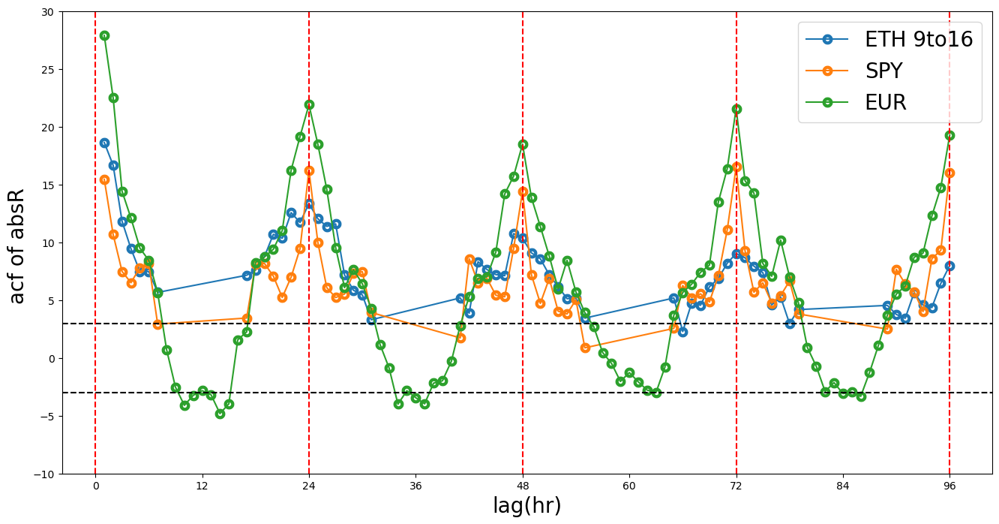

In [583]:

fig,ax = plt.subplots(figsize=(16,8))

# df_acf = plot_acf_2(df_9to16)
ddf = df_ACF[(df_ACF.label == 'SPY')&(df_ACF.method == 'abs')]
ddff = df_ACF[(df_ACF.label == 'EUR')&(df_ACF.method == 'abs')]
dff = df_acf[df_acf.method=='abs']
for lab,df in {'ETH 9to16': dff, 'SPY': ddf,'EUR': ddff}.items():
    
    ax.plot( df.Lags[1:],df['value'][1:],label=lab,marker='.'
         ,mfc ='none' ,mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')

ax.legend(fontsize = 20)
ax.set_xlabel('lag(hr)',fontsize = 20)
ax.set_ylabel('acf of absR ', fontsize = 20)
ax.set_ylim(-10,30)


ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')


log-log plot acf of absR

(10, 200)

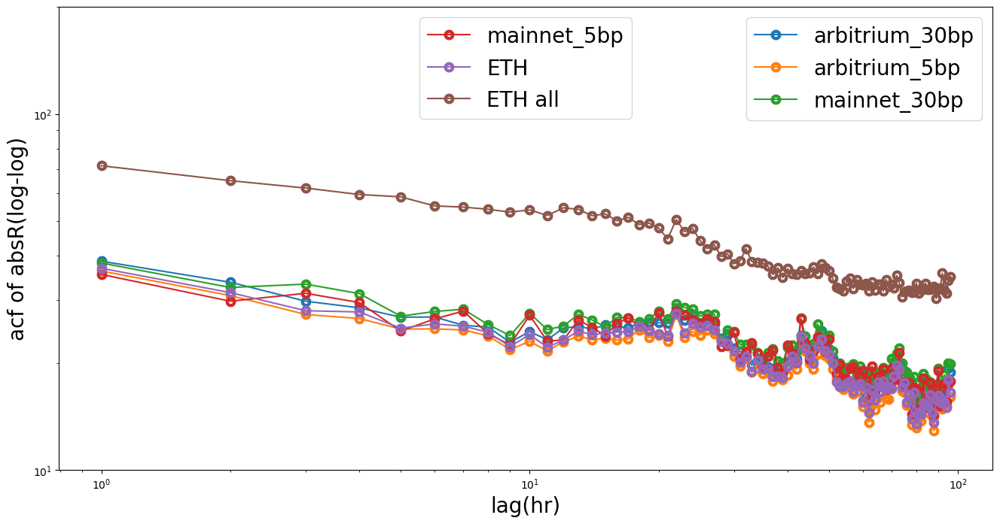

In [600]:
# Return
label_dict = {'arb_3000':'arbitrium_30bp', 'arb_500':'arbitrium_5bp', 'm_3000':'mainnet_30bp', 'm_500':'mainnet_5bp', 
              'Binance':'ETH','Binance all':'ETH all'}
fig,ax = plt.subplots(figsize=(16,8))

df_acf = df_ACF[df_ACF['method']=='abs'].copy()
for k,(lab,text) in enumerate(label_dict.items()):
    df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
    for token in np.unique(df1.token.values):
        if (token =='WETH & DAI') or (token =='WETH & USDT') or (token =='BTC & USD'):
            continue
        df = df1[df1.token == token]
        if lab in ['SPY','EUR']:
            c = {'SPY': 'k','EUR':'darkblue' }[lab]
            ax.plot( df.Lags[1:],df['value'][1:],label=text
                 ,c = c,lw=2)
        else:
            ax.plot( df.Lags[1:],df['value'][1:],label=text,marker='.'
                 ,mfc ='none', c = c_cycle[k] ,mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
    #labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9 ,fontsize = 20)
ax.set_xlabel('lag(hr)',fontsize = 20)
ax.set_ylabel('acf of absR(log-log)', fontsize = 20)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(10,200)
# ax.set_xticks([0,12,24,36,48,60,72,84,96])
# #plot daily vline
# for x in [0,24,48,72,96]:
#     ax.axvline(x=x,c='red',linestyle='dashed')


In [36]:
acf_table = pd.concat( [df_ACF[(df_ACF.Lags ==1)&(df_ACF.method =='none')].reset_index().drop(columns='index'),
         df_ACF[(df_ACF.Lags ==24)&(df_ACF.method =='none')].reset_index().drop(columns='index')])
acf_table.to_csv('Data/pool_CEX_acf_table.csv')

In [46]:
acf_table

,Lags,label,token,dT,value,method
0,1,Binance,BTC & USD,1H,0.350446,none
1,1,Binance,ETH & USD,1H,1.025594,none
2,1,Binance all,ETH & USD,1H,-7.247492,none
3,1,EUR all,EUR & USD,1H,0.380745,none
4,1,SPY all,SPY & USD,1H,-3.697913,none
5,1,arb_3000,WETH & DAI,1H,8.102133,none
6,1,arb_3000,WETH & USDC,1H,5.871170,none
7,1,arb_500,WETH & USDC,1H,2.398024,none
8,1,arb_500,WETH & USDT,1H,-0.404555,none
9,1,m_3000,WETH & DAI,1H,5.302711,none


##### Plot the lag vs corresponding length  

Text(0.5, 1.0, 'numer of pair vs lag, SPY')

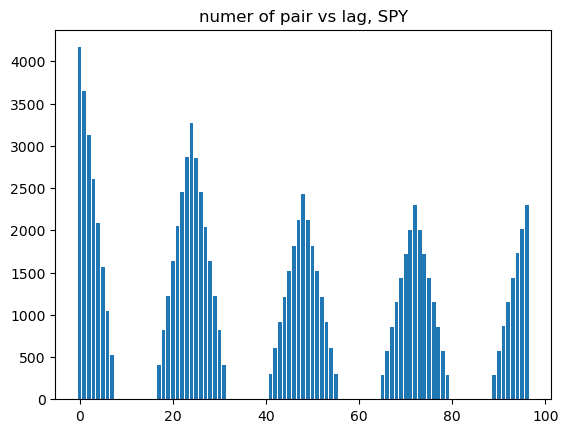

In [25]:
hour = pd.Timedelta('0 days 01:00:00')
df =  df_all[df_all.label == 'SPY'].copy()
df  =df[df.dT=='1H']
T_array = df.index
N = len(df)
Lags= []

for t in T_array:
    for s in T_array[np.logical_and(T_array>=t ,T_array<= t+ nlags*hour)]:
        diff = (s-t)/hour
        Lags.append( int(diff) )
test = np.array([Lags])
numbers = [len(test[test== lag]) for lag in range(97)]
plt.bar(np.arange(97),numbers);
plt.title('numer of pair vs lag, SPY')

Text(0.5, 1.0, 'numer of pair vs lag, ETH')

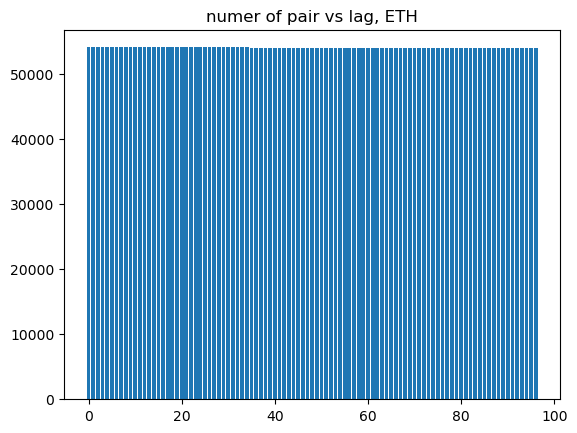

In [28]:
hour = pd.Timedelta('0 days 01:00:00')
df =  df_all[(df_all.label=='Binance all') & (df_all.token == 'ETH & USD')].copy()
df  =df[df.dT=='1H']
T_array = df.index
N = len(df)
Lags= []

for t in T_array:
    for s in T_array[np.logical_and(T_array>=t ,T_array<= t+ nlags*hour)]:
        diff = (s-t)/hour
        Lags.append( int(diff) )
test = np.array([Lags])
numbers = [len(test[test== lag]) for lag in range(97)]
plt.bar(np.arange(97),numbers);
plt.title('numer of pair vs lag, ETH')

#### check daily SPY and Binance acf

In [292]:


df = df_all[df_all.label== 'SPY all'].copy()
df_D = resample_close(df)


In [293]:

token_1 = 'USD'
label = 'Binance'
token_0 ='ETH'
df=  pd.read_csv(f'Data/Binance/{token_0}/{token_0}_{token_1}_1D.csv' , index_col = 'datetime') 
df.index = pd.to_datetime(df.index)
ETH = df_setting(df,'1D',label,token_0,token_1,timeframe_align=False)
df_D = pd.concat([df_D,ETH])

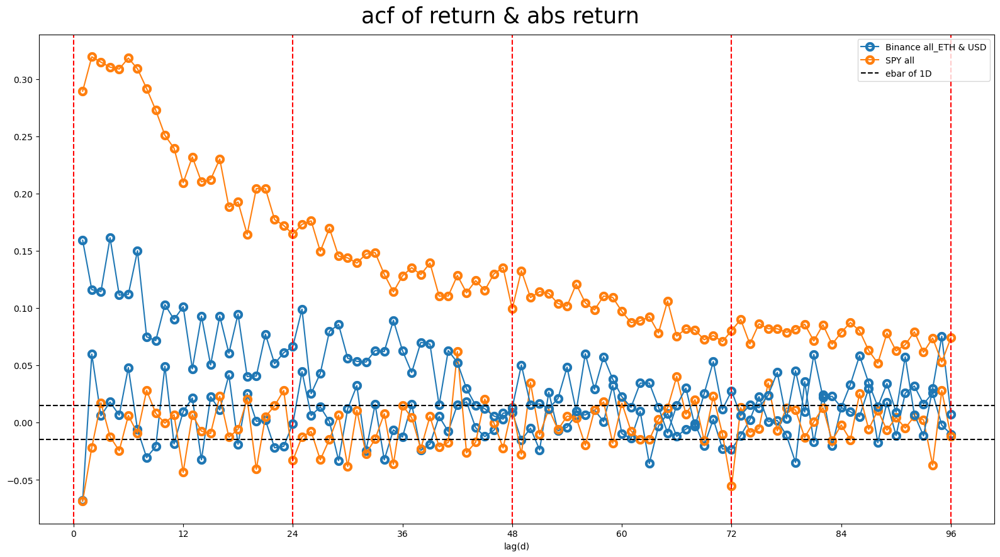

In [295]:
label_list = ['Binance all','SPY all']
acf_dict_D = plot_acf( ['none','abs'],df_all = df_D, time_list=['1D'])    

fig,ax=plt.subplots(figsize=(16,9))
for l,method in enumerate(['none','abs']):
    df_acf = acf_dict_D[method]
    for k,lab in enumerate(label_list):
        df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1D')]
        for token in np.unique(df1.token.values):
            df = df1[df1.token == token]
            if l==0:
                if lab in ['SPY','SPY all','EUR','EUR all']:
                    text = lab
                else:
                    text= f'{lab}_{token}'
                ax.plot(df.Lags[1:],df['value'][1:],label=text,marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=8)
            else:
                ax.plot(df.Lags[1:],df['value'][1:],marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=8)
                
ax.axhline(y= 2/np.sqrt(18126),c='k',linestyle='dashed', label=f'ebar of 1D')
ax.axhline(y=-2/np.sqrt(18126),c='k',linestyle='dashed')
#labels setting
ax.legend()
ax.set_xlabel('lag(d)')

ax.set_xticks([0,12,24,36,48,60,72,84,96])
plt.suptitle('acf of return & abs return', fontsize=25)
plt.tight_layout()
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

#### rolling

In [160]:
df_list_rolling_trad = [ ]
for df in df_list_trad:
    labs =  df[~df.label.duplicated(keep='last')].label.values
    for lab in labs:
        dff = df[df.label==lab]
        df_list_rolling_trad.append(dff)
        for dT in ['1D','1W','1M']:
            df_list_rolling_trad.append(resample_by_rolling(dff,dT))

In [136]:
# pd.concat(df_list_rolling_trad).to_csv('Data/organized data/rollingwindow_trad.csv')

In [83]:
# df_rolling_trad = pd.read_csv('Data/organized data/rollingwindow_trad.csv',index_col='datetime')
# df_list_rolling_trad =[]
# time_list = ['1H','1D','1W','1M']
# label_array = df_rolling_trad['label'].unique()
# for lab in label_array:
#     if lab in ['SPY all','EUR all']:
#         continue
#     for dT in time_list:
#         df_list_rolling_trad.append(df_rolling_trad[(df_rolling_trad.label==lab)&(df_rolling_trad.dT == dT)  ].copy())

In [158]:
df_rolling = pd.read_csv('Data/organized data/rollingwindow_pool_CEX.csv')
df_rolling.rename(columns={'Unnamed: 0':'datetime'},inplace=True)
df_rolling.set_index('datetime',inplace = True)
df_rolling.index = pd.to_datetime(df_rolling.index)
df_list_rolling =[]
label_array = df_rolling['label'].unique()
token_array =  df_rolling['token'].unique()
time_list = ['10min', '1H' , '1D','1W','1M']
for lab in label_array:
    for token in token_array:
        for dT in time_list:
            df = df_rolling[(df_rolling.label==lab)&(df_rolling.token == token)& (df_rolling.dT == dT)  ]
            if len(df)==0:
                continue
            df_list_rolling.append(df)

In [161]:
temp = df_list_rolling + df_list_rolling_trad

#### pdf

Note the the timeframe for data are the same.

three subplots for all time interval

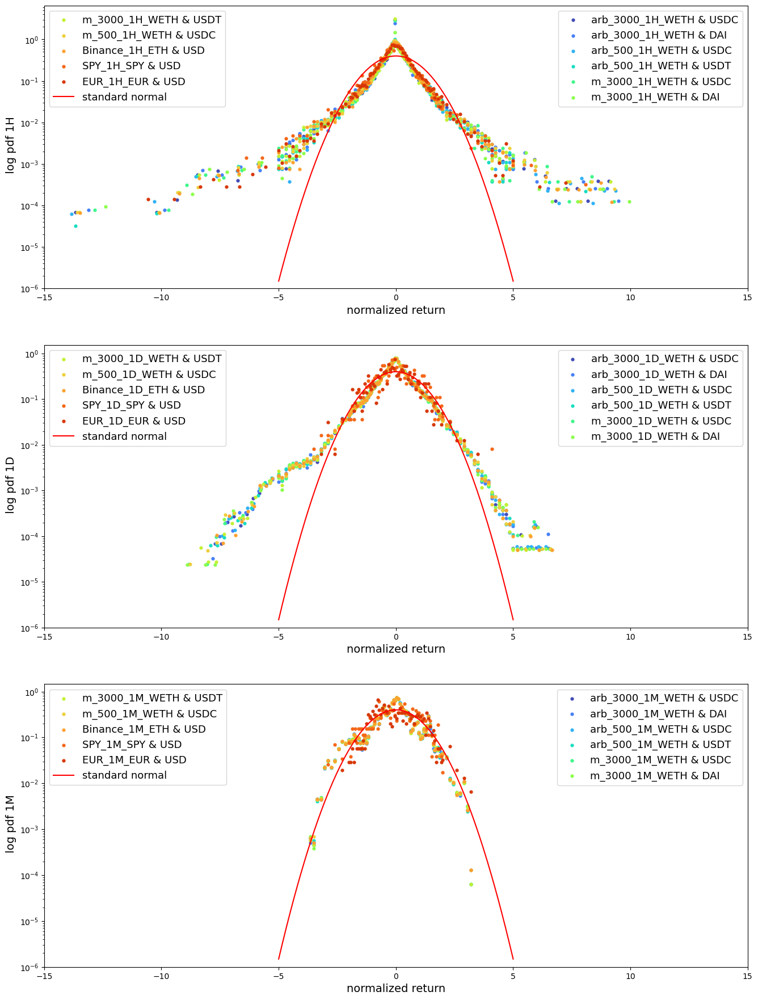

In [111]:
c = hex_colors[::20]
fix , ax = plt.subplots(3,1, figsize=(16,22))
k=0
for df in temp:    
    label = df.label[0]
    if (label =='Binance all') or (label =='SPY all') or (label =='EUR all'):
        continue
    token = df.token[0]
    if (token == 'BTC & USD' ):
        continue
    t = df.dT[0]
    array =df['return'][1:].values
    #remove zeros
    array = array[array != 0]
    prob, bins= plot_pdf(array,med_shift=True);
    if lab in ['SPY','EUR']:
        text = lab
    else:
    if t == '1H':
        j=0
        k+=1
    elif t == '1D':
        j=1
    elif t == '1M':
        j=2
    else:
        continue
    ax[j].scatter(bins[:-1], prob,label= f'{label}_{token}' ,color = c[k],s=12)
#plot standard normal
x = np.linspace(-5,5,10000)
norm=sci.stats.norm.pdf(x,0,1)
for i,t in enumerate(['1H','1D','1M']):
    ax[i].semilogy(x,norm,color='red',label = 'standard normal')
    handles, labels = ax[i].get_legend_handles_labels()
    n = len(handles)
    first_legend = ax[i].legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize = 13)
    ax[i].add_artist(first_legend)
    ax[i].legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ] ,loc=2,fontsize = 13)
    
    ax[i].set_xlabel('normalized return',fontsize=14)
    ax[i].set_ylabel(f' log pdf {t}',fontsize=14)
    # ax[i].set_yscale('log')
    ax[i].set_ylim(10**(-6),top=None)
    ax[i].set_xlim(-15,15)


three in one plot

In [534]:
label_dict = {'arb_3000':'arbitrum_30bp','arb_500':'arbitrum_5bp','m_3000':'mainnet_30bp','m_500':'mainnet_5bp', 'Binance':'ETH'
             , 'SPY':'SPY','EUR':'EUR'}
token_dict = {'WETH & USDC': 'USDC', 'WETH & USDT': 'USDT','WETH & DAI': 'DAI' }

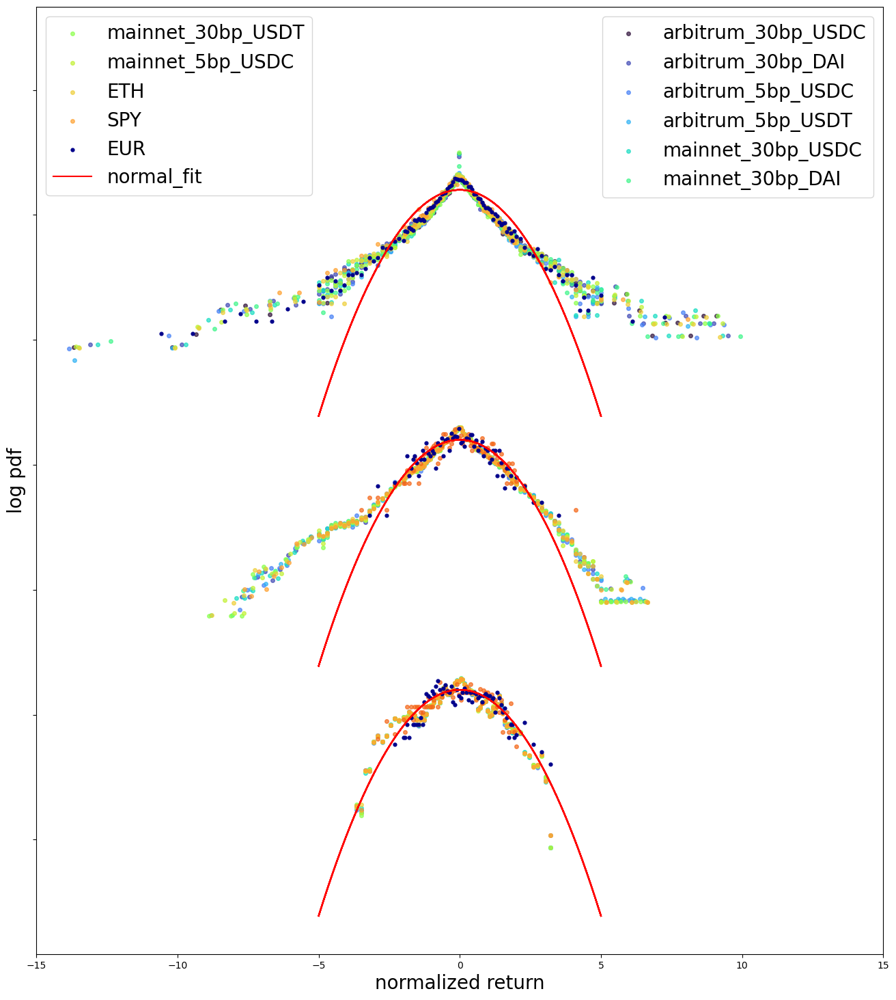

In [186]:
c = hex_colors[::20]
fix , ax = plt.subplots( figsize=(16,18))
k=0
for df in temp:    
    label = df.label[0]
    if (label =='Binance all') or (label =='SPY all') or (label =='EUR all'):
        continue
    for key,value in {'SPY': 'k','EUR':'darkblue'}.items():
        if label == key:
            color = value
            alpha=1
            s=12
        else: 
            color = c[k]
            alpha=0.7
            s=16
    token = df.token[0]
    if (token == 'BTC & USD' ):
        continue

    t = df.dT[0]
    array =df['return'][1:].values
    #remove zeros
    array = array[array != 0]
    prob, bins= plot_pdf(array,med_shift=True);
    
    x = np.linspace(-5,5,10000)
    norm=sci.stats.norm.pdf(x,0,1)
    text =''
    text_norm=''
    
    if t == '1H':
        j=0
        if label in ['Binance', 'SPY', 'EUR']:
            text =  f'{label_dict[label]}' 
            if label=='EUR':
                text_norm= 'normal_fit'
        else:
            text =  f'{label_dict[label]}_{token_dict[token]}' 
        k+=1
    elif t == '1D':
        j=1
    elif t == '1M':
        j=2
    else:
        continue
    ax.scatter(bins[:-1],prob*10**(12-6*j),label=text,color = color,s=s,alpha=alpha)
    ax.plot(x,norm* 10**(6*j),color='red',label=text_norm)
#plot standard normal
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize = 20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ] ,loc=2,fontsize = 20)

ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel('log pdf',fontsize=20)

ax.set_yscale('log')
ax.set_xlim(-15,15)
ax.set_ylim(bottom=None,top=10**16)

ax.set_yticklabels([]);


#### cdf
For pools data, we use WETH & USDC

three independent plots. legend size is big, may be combine to save space

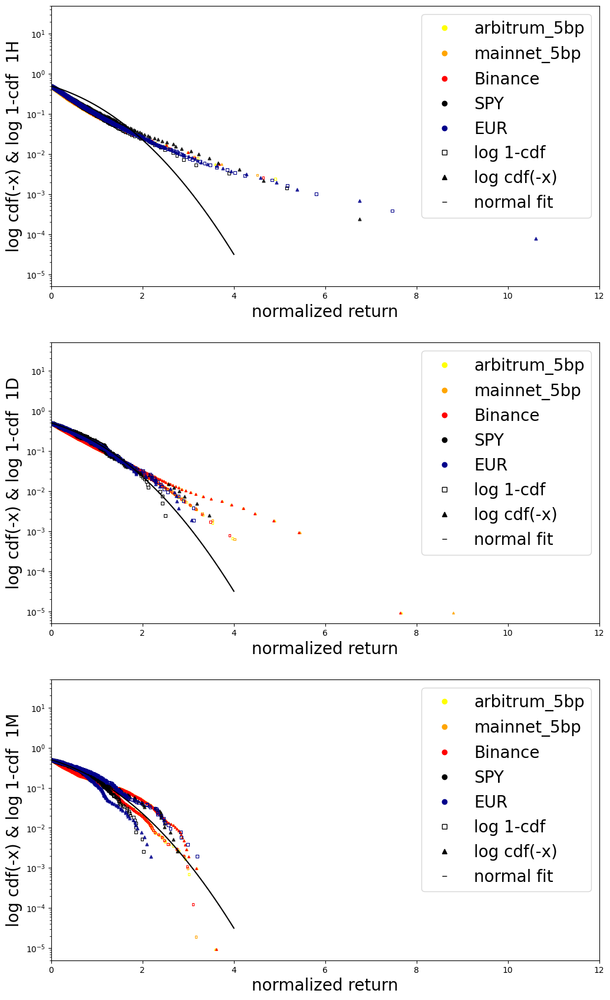

In [231]:
marker_list =['s','^']
time_list = ['1H','1D','1M']
label_dict = { 'arb_500':'arbitrum_5bp','m_500':'mainnet_5bp','Binance':'Binance','SPY':'SPY','EUR':'EUR'}
c_cdf= ['yellow','orange','red','k','darkblue']
legend_list=list(label_dict.values())
label_list= list(label_dict.keys())
fig,ax = plt.subplots(len(time_list),1 ,figsize=(12,7*len(time_list)))
for df in temp:
    label = df.label[0]
    token= df.token[0]
    if  (label not in label_list) or (df.dT[0] not in time_list):
        continue
    k= list(label_dict.keys()).index(label)
    if (k< 2) and (token != 'WETH & USDC'):
        continue
    if (k== 2) and (token != 'ETH & USD'):
        continue   
    if k >= 3 :
        N=1
    else:
        N=100
    t = df.dT[0]

    if  t =='1H':
        i = 0
        if k >=3:
            N=8
    elif t=='1D':
        i=1
    elif t=='1M' :
        i=2
        
    array =df['return'][1:].values

    c = c_cdf[k]
    
    df_plot = cdf_df(array,norm=True)
    df_plot.loc[:,'y']=df_plot.apply( lambda r: np.exp(cdf_modify(r.x,r.y,0)) ,axis=1)
    if label in ['SPY','EUR']:
        s = 12
        alpha=1
    else : 
        s=6
        alpha=0.8
    ax[i].scatter(df_plot[df_plot.x >=0]['x'][::N], df_plot[df_plot.x >=0]['y'][::N] , marker= marker_list[0]
                  ,s=s , facecolor ='none', edgecolor = c , linewidth = 0.8 )
    ax[i].scatter(-df_plot[df_plot.x <0]['x'][::N], df_plot[df_plot.x <0]['y'][::N] , c = c
                  , marker = marker_list[1] , s=s , alpha= 0.8 )

        
#legend setting
color_legend = [Line2D([0], [0], color=c_cdf[k], marker='o', linestyle='') for k,_ in enumerate(label_dict.keys())]
marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                Line2D([0], [0], color='k', marker='^', linestyle=''), 
                Line2D([0], [0], color='k', marker="_", linestyle='')]
#plot std normal cdf
x= np.linspace(0,4,10000)
norm= sci.stats.norm.cdf(x,0,1)
for i,t in enumerate(time_list):
    ax[i].plot(x,1-norm,c='k', label=f'standard normal')
    ax[i].set_xlabel('normalized return',fontsize=20)
    ax[i].set_ylabel(f'log cdf(-x) & log 1-cdf  {t}',fontsize=20)
    ax[i].set_yscale('log')
    ax[i].legend(
        color_legend+marker_legend    , legend_list+[ 'log 1-cdf','log cdf(-x)' ]+['normal fit'],
        prop={'size': 20})

    ax[i].set_xlim(0,12)
    ax[i].set_ylim(5*10**(-6),50)


three in one

(4.9999999999999996e-06, 100000000)

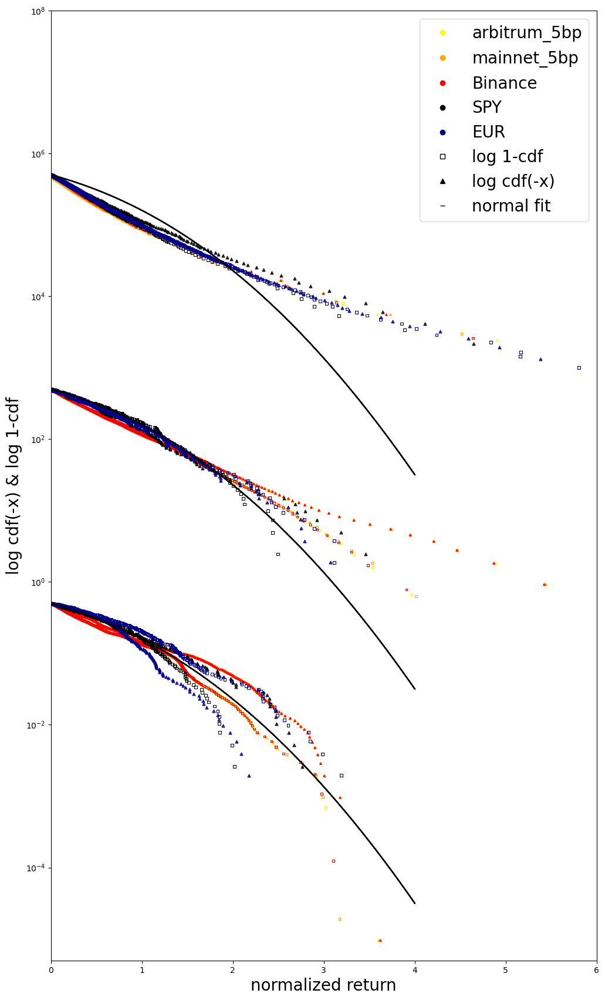

In [363]:
marker_list =['s','^']
time_list = ['1H','1D','1M']
label_dict = { 'arb_500':'arbitrum_5bp','m_500':'mainnet_5bp','Binance':'Binance','SPY':'SPY','EUR':'EUR'}
c_cdf= ['yellow','orange','red','k','darkblue']
legend_list=list(label_dict.values())
label_list= list(label_dict.keys())
fig,ax = plt.subplots(figsize=(12,7*len(time_list)))

x= np.linspace(0,4,10000)
norm= sci.stats.norm.cdf(x,0,1)
for df in temp:
    label = df.label[0]
    token= df.token[0]
    if  (label not in label_list) or (df.dT[0] not in time_list):
        continue
    k= list(label_dict.keys()).index(label)
    if (k< 2) and (token != 'WETH & USDC'):
        continue
    if (k== 2) and (token != 'ETH & USD'):
        continue   
    if k >= 3 :
        N=1
    else:
        N=100
    t = df.dT[0]

    if  t =='1H':
        i = 0
        if k >=3:
            N=8
    elif t=='1D':
        i=1
    elif t=='1M' :
        i=2
        
    array =df['return'][1:].values

    c = c_cdf[k]
    
    df_plot = cdf_df(array,norm=True)
    df_plot.loc[:,'y']=df_plot.apply( lambda r: np.exp(cdf_modify(r.x,r.y,0)) ,axis=1)
    if label in ['SPY','EUR']:
        s = 12
        alpha=1
    else : 
        s=6
        alpha=0.8
    ax.scatter(df_plot[df_plot.x >=0]['x'][::N], df_plot[df_plot.x >=0]['y'][::N]* 10**(6-3*i) , marker= marker_list[0]
                  ,s=s , facecolor ='none', edgecolor = c , linewidth = 0.8 )
    ax.scatter(-df_plot[df_plot.x <0]['x'][::N], df_plot[df_plot.x <0]['y'][::N]* 10**(6-3*i) , c = c
                  , marker = marker_list[1] , s=s , alpha= 0.8 )
    ax.plot(x,(1-norm)* 10**(6-3*i),c='k')

        
#legend setting
color_legend = [Line2D([0], [0], color=c_cdf[k], marker='o', linestyle='') for k,_ in enumerate(label_dict.keys())]
marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                Line2D([0], [0], color='k', marker='^', linestyle=''), 
                Line2D([0], [0], color='k', marker="_", linestyle='')]
#plot std normal cdf

ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel(f'log cdf(-x) & log 1-cdf',fontsize=20)
ax.set_yscale('log')
ax.legend(
    color_legend+marker_legend    , legend_list+[ 'log 1-cdf','log cdf(-x)' ]+['normal fit'],
    prop={'size': 20})
ax.set_xlim(0,6)
ax.set_ylim(5*10**(-6),top=10**8)


#### tail behavior
ref [package](https://github.com/jeffalstott/powerlaw) with [Jeff Alstott, Ed Bullmore, Dietmar Plenz. 2014.](https://arxiv.org/pdf/1305.0215) Also [ Clauset et al. 2007 ](http://arxiv.org/abs/0706.1062)

roughly $95\%$ of normalized returns are inside $[-2,2]$. So we let tail to be the region outside the interval.

In [197]:
def _(a):
    array = normalize(a,med_shift=True)
    N = len(array) 
    r=0
    while True:
        ratio = len(array[np.logical_and(array >= -r , array<= r) ])/N
        if ratio >=0.95:
            return r
        r+=0.01

for df in temp:
    label = df.label[0]
    token= df.token[0]
    if  (label not in label_list) or (df.dT[0]!= '1H'):
        continue
    k= list(label_dict.keys()).index(label)
    if (k< 2) and (token != 'WETH & USDC'):
        continue
    if (k== 2) and (token != 'ETH & USD'):
        continue   
    array =df['return'][1:].values
    print(f'{label}_{token} with 95% in {_(array)}')

arb_500_WETH & USDC with 95% in 2.0300000000000007
m_500_WETH & USDC with 95% in 2.0300000000000007
Binance_ETH & USD with 95% in 2.0400000000000005
SPY_SPY & USD with 95% in 2.1299999999999986
EUR_EUR & USD with 95% in 2.0300000000000007


(4e-05, 0.05)

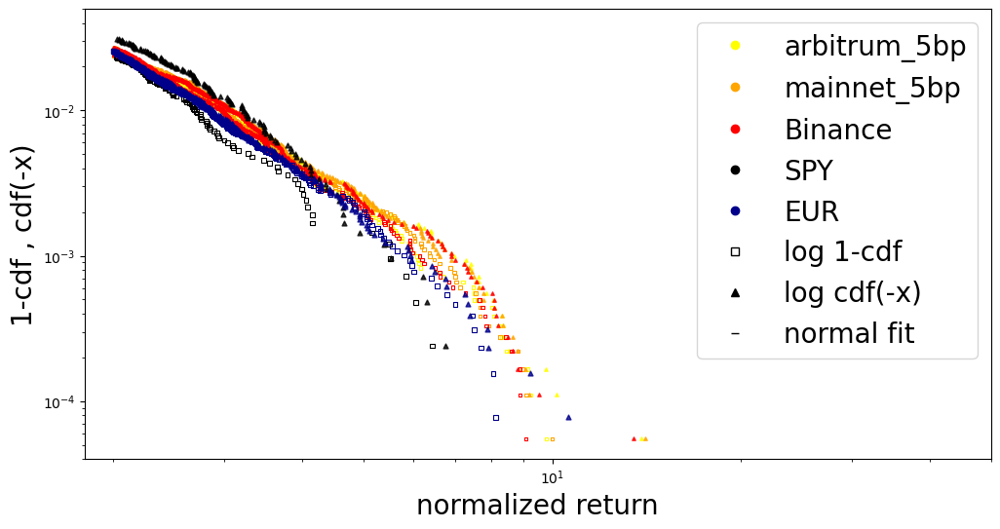

In [418]:
marker_list =['s','^']
label_dict = { 'arb_500':'arbitrum_5bp','m_500':'mainnet_5bp','Binance':'Binance','SPY':'SPY','EUR':'EUR'}
c_cdf= ['yellow','orange','red','k','darkblue']
label_list= list(label_dict.keys())
legend_list= list(label_dict.values())

fig, ax = plt.subplots(figsize=(12,6))

for df in temp:
    label = df.label[0]
    token= df.token[0]
    if  (label not in label_list) or (df.dT[0] != '1H'):
        continue
    k= list(label_dict.keys()).index(label)
    if (k< 2) and (token != 'WETH & USDC'):
        continue
    if (k== 2) and (token != 'ETH & USD'):
        continue   
    c = c_cdf[k]
    
    array =df['return'][1:].values
    df_plot = cdf_df(array,norm=True)
    df_plot.loc[:,'y']=df_plot.apply( lambda r: np.exp(cdf_modify(r.x,r.y,0)) ,axis=1)

    df_r = df_plot[df_plot.x >2]
    df_l= df_plot[df_plot.x <-2]
    x_r = df_r.x.values[:-1]  #we chooselog log(1-cdf) =-100 when cdf=1 
    y_r = df_r.y.values[:-1]
    x_l = -df_l.x.values
    y_l = df_l.y.values

    if label in ['SPY','EUR']:
        s = 12
        alpha=1
    else : 
        s=6
        alpha=0.8
    ax.scatter(x_r , y_r , marker= marker_list[0]
                  ,s=s , facecolor ='none', edgecolor = c , linewidth = 0.8 )
    ax.scatter(x_l , y_l , c = c
                  , marker = marker_list[1] , s=s , alpha= 0.8 )

color_legend = [Line2D([0], [0], color=c_cdf[k], marker='o', linestyle='') for k,_ in enumerate(label_dict.keys())]
marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                Line2D([0], [0], color='k', marker='^', linestyle=''), 
                Line2D([0], [0], color='k', marker="_", linestyle='')]
ax.legend(
        color_legend+marker_legend    , legend_list+[ 'log 1-cdf','log cdf(-x)' ]+['normal fit'],
        prop={'size': 20})
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel('1-cdf , cdf(-x)',fontsize=20)

ax.set_xlim(1.8,50)
ax.set_ylim(4*10**(-5),0.05)


In [ ]:
# fit_dict_save = fit_dict.copy()

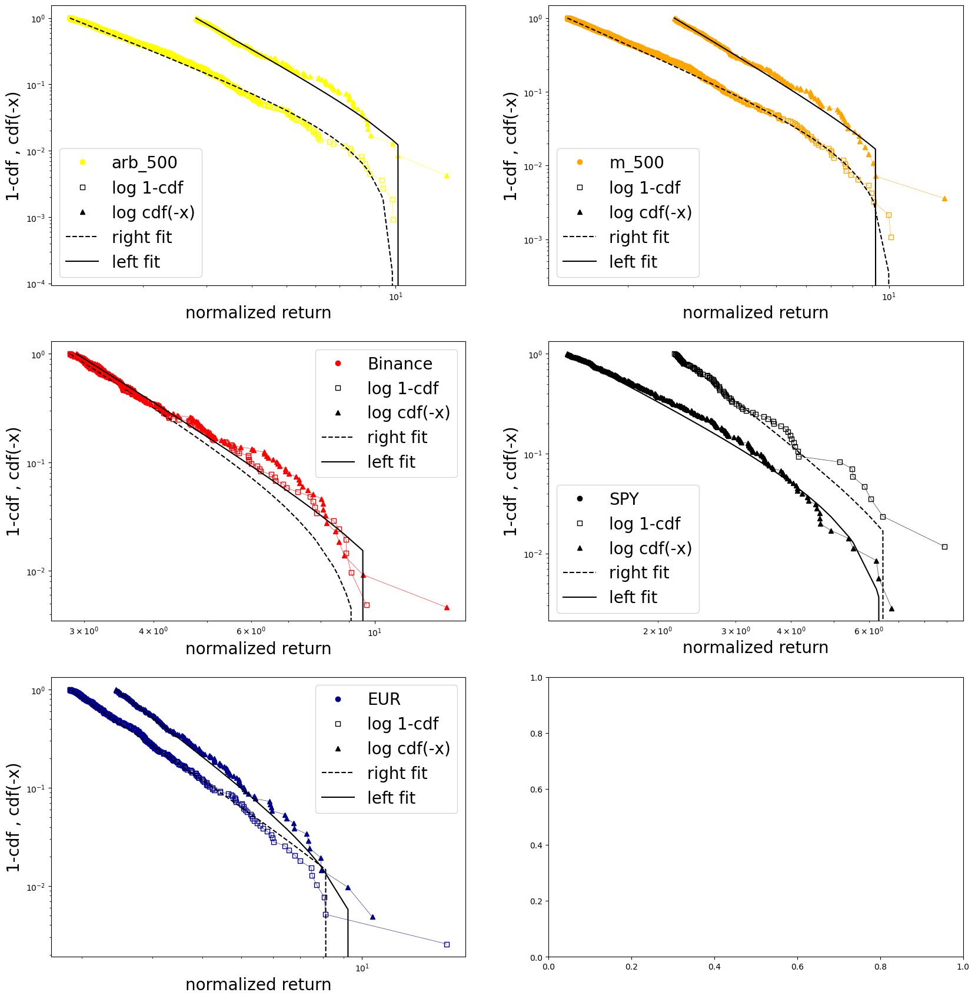

In [417]:
marker_list =['s','^']
label_dict = { 'arb_500':'arbitrum_5bp','m_500':'mainnet_5bp','Binance':'Binance','SPY':'SPY','EUR':'EUR'}
c_cdf= ['yellow','orange','red','k','darkblue']
label_list= list(label_dict.keys())
legend_list= list(label_dict.values())

fig, ax = plt.subplots(3,2,figsize=(20,21))
fit_dict = {}

for df in temp:
    label = df.label[0]
    token= df.token[0]
    if  (label not in label_list) or (df.dT[0] != '1H'):
        continue
    k= list(label_dict.keys()).index(label)
    if (k< 2) and (token != 'WETH & USDC'):
        continue
    if (k== 2) and (token != 'ETH & USD'):
        continue   
    c = c_cdf[k]
    fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l = cdf_tail_fit(df)
    
    fit_dict[label] =[fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l ]
    #fit_r ,fit_l ,slope_r, x_min_r ,slope_l , x_min_l = fit_dict[label]

    i,j = int(k/2) ,k%2
    fit_r.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[0],mfc ='none',mew=1,label=f'{label} right')
    fit_r.power_law.plot_ccdf(color='k', linestyle='--', ax=ax[i,j],label=f'{label} fit right')
    fit_l.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[1])
    fit_l.power_law.plot_ccdf(color='k', ax=ax[i,j])
    ax[i,j].legend(fontsize=20)
    ax[i,j].set_xlabel('normalized return',fontsize=20)
    ax[i,j].set_ylabel('1-cdf , cdf(-x)',fontsize=20)

    color_legend = [Line2D([0], [0], color=c, marker='o', linestyle='') ]
    marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                 Line2D([0], [0], color='k', marker='^', linestyle=''), 
                 Line2D([0], [0], color='k', linestyle='--'),
                 Line2D([0], [0], color='k')]
    ax[i,j].legend(
         color_legend+marker_legend    , [label]+[ 'log 1-cdf','log cdf(-x)' ]+['right fit','left fit'],
        prop={'size': 20})


We use ```powerlaw``` package to fit the tail. But the package is for single-sided distribution while our cases are twin-sided. We fit positive and negative data separately and ignore zeors, this implies the distributions are conditioned.  The effect is that it divide the cdf by the $P( X \geq x_{min , r} )$ and $P( X \leq x_{min , l} )$. (The left side match, but for the right side, a little deviation at very tail part, not sure why).

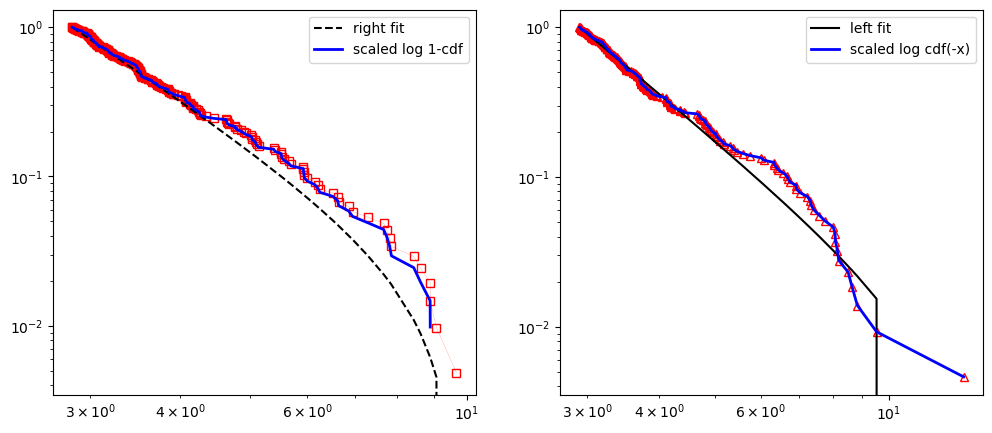

In [805]:
fit_r ,fit_l ,slope_r, x_min_r ,slope_l , x_min_l = fit_dict['Binance']

#_ = df_list_rolling_trad[0]
_ = df_all[(df_all.label =='Binance') & (df_all.token == 'ETH & USD')]
_ = _[_.dT=='1H']
df_plot = cdf_df(_['return'][1:].values,norm=True)[:-1]
df_plot.loc[:,'y']=df_plot.apply( lambda r: np.exp(cdf_modify(r.x,r.y,0)) ,axis=1)

df_r = df_plot[df_plot.x >x_min_r]
# df_r.loc[:,'y'] = df_r.apply( lambda r: 1-r.y ,axis=1)
df_l= df_plot[df_plot.x <-x_min_l]
x_r = df_r.x.values[:-1]  #we chooselog log(1-cdf) =-100 when cdf=1 
y_r = df_r.y.values[:-1]
x_l = -df_l.x.values
y_l = df_l.y.values
y_r *= 1/y_r.max()

y_l *= 1/y_l.max()


fig,ax = plt.subplots(1,2,figsize=(12,5))
fit_r.plot_ccdf(color='r', linewidth=0.1, ax=ax[0], marker = marker_list[0],mfc ='none',mew=1)
fit_r.power_law.plot_ccdf(color='k', linestyle='--', ax=ax[0],label='right fit')
ax[0].plot(x_r,y_r,lw=2,c='b',label='scaled log 1-cdf')

fit_l.plot_ccdf(color='r', linewidth=0.1, ax=ax[1], marker = marker_list[1],mfc ='none',mew=1)
fit_l.power_law.plot_ccdf(color='k', linestyle='-', ax=ax[1], label ='left fit')
ax[1].plot(x_l,y_l,lw=2,c='b',label='scaled log cdf(-x)')
ax[0].legend()
ax[1].legend()

Table for fitting

In [631]:
ddict = {}
for lab in fit_dict.keys():
    ddict[lab] = fit_dict_save[lab][2:]
df_tail = pd.DataFrame( ddict,index=['exp_r','xmin_r','exp_l','xmin_l'])
df_tail

,arb_500,m_500,Binance,SPY,EUR
exp_r,2.146468,2.221555,3.202149,3.398784,2.769251
xmin_r,1.258213,1.380781,2.830682,2.182652,1.870416
exp_l,3.052194,3.050973,3.187570,2.266507,3.086632
xmin_l,2.808411,2.668091,2.908447,1.249608,2.432741


In [110]:
ddict = {'arb_500': [2.146468,1.258213,3.052194,2.808411] ,
        'm_500': [2.221555, 1.380781, 3.050973, 2.668091],
         'SPY': [3.398784, 2.182652,2.266507,1.249608 ],
        'EUR' : [ 2.769251, 1.870416 ,3.086632, 2.432741   ]
        }
df_tail = pd.DataFrame( ddict,index=['exp_r','xmin_r','exp_l','xmin_l'])

df_tail.to_csv('Data/fit table/fit_table.csv')

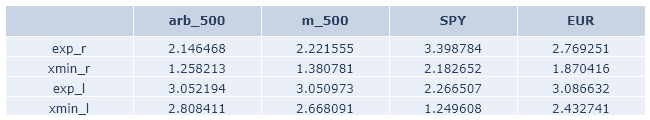

In [32]:
fig = df2img.plot_dataframe(df_tail, fig_size=(650, 120))

#### Hill estimator
seems to converge


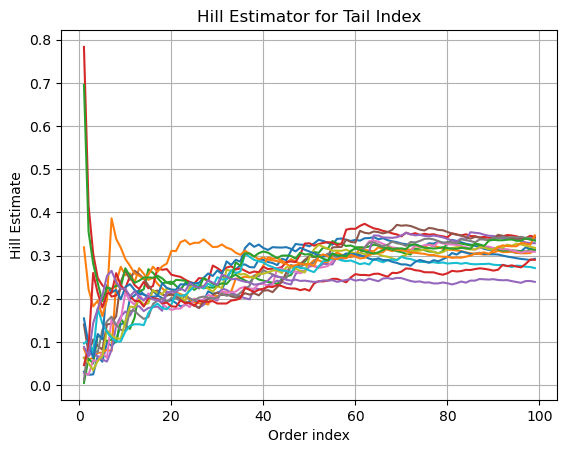

In [441]:
_ =[]
for df in temp:
    if df.dT[0]=='1H': 
        _.append(df)
k = 100 

for df in _:
# Generate some sample data
    data = normalize(df['return'][1:].values,med_shift=True)
    sorted_data = np.sort(data)[::-1]
    hill_estimates = [np.mean(np.log(sorted_data[:i] / sorted_data[i])) for i in range(1, k)]
    plt.plot(range(1, k), hill_estimates)

# Sort data in descending order

# Hill estimator
 # Number of top order statistics to consider

# Plot Hill estimator
plt.xlabel('Order index')
plt.ylabel('Hill Estimate')
plt.title('Hill Estimator for Tail Index')
plt.grid(True)
plt.show()


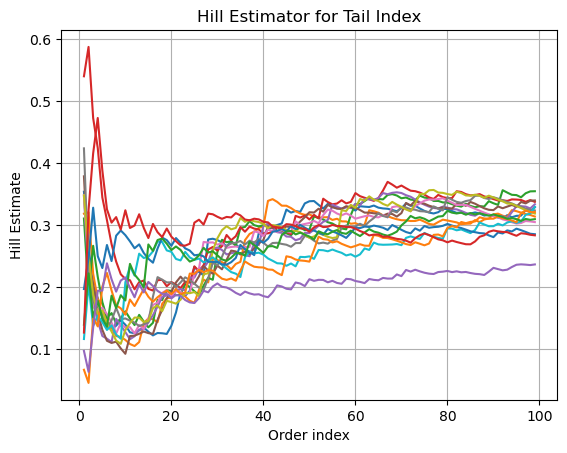

In [444]:

for df in _:
# Generate some sample data
    data = normalize(df['return'][1:].values,med_shift=True)
    sorted_data = np.sort(-data)[::-1]
    hill_estimates = [np.mean(np.log(sorted_data[:i] / sorted_data[i])) for i in range(1, k)]
    plt.plot(range(1, k), hill_estimates)

plt.xlabel('Order index')
plt.ylabel('Hill Estimate')
plt.title('Hill Estimator for Tail Index')
plt.grid(True)
plt.show()


### coinbase vs Binance. 

In [569]:
temp_=[]
token_1 = 'USD'
label = ['Binance','coinbase']
for token_0 in ['ETH' , 'BTC']:
    for lab in label:
        try:
            df=  pd.read_csv(f'Data/{lab}/{token_0}/{token_0}_{token_1}_1H.csv' , index_col = 'datetime') 
            df.index = pd.to_datetime(df.index)
            df1 = df_setting(df,T,lab,token_0,token_1,timeframe_align=True)
            temp_.append(df1)


        except FileNotFoundError:
            print(f'no {lab} {token_0} & {token_1} {T}')


pdf, cdf are close for Binance and coinbase. Here we use the datafrom the whole time frame, so their time isn't aligned. If we set them to align, cdfs overlap.

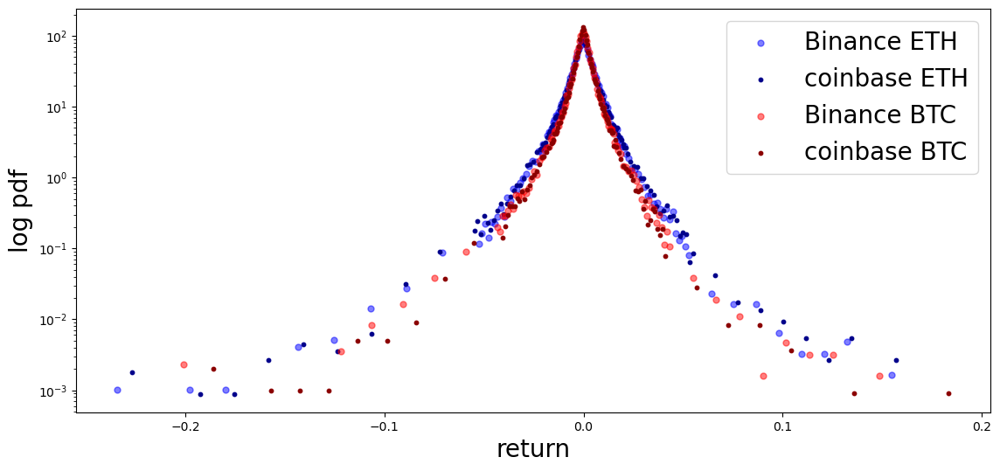

In [550]:
c=['b','darkblue','r','darkred']
fig,ax = plt.subplots(figsize=(13.5,6))
for k,df in enumerate(temp_): 
    label = df.label[0].replace(' all', '')
    token = df.token[0].replace(' & USD', '')
    t = df.dT[0]
    array =df['return'][1:].values
    if label == 'Binance':
        s=25
        a = 0.5
    else:
        s=10
        a=1
    prob, bins= plot_pdf(array,norm=False);
    ax.scatter(bins[:-1], prob,label= f'{label} {token}' ,color = c[k],s=s,alpha=a)


ax.set_xlabel('return',fontsize=20)
ax.set_ylabel('log pdf',fontsize=20)
ax.set_yscale('log')
ax.legend(fontsize=20)

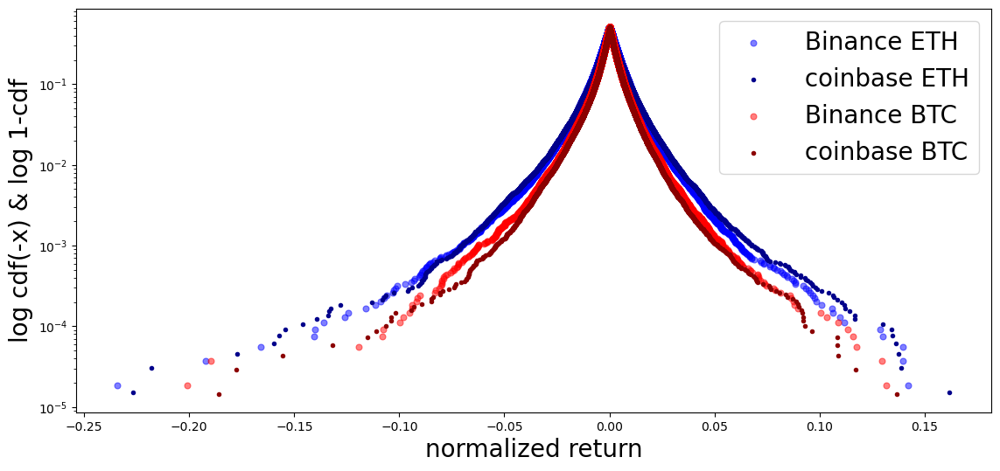

In [525]:
#cdf


fig,ax = plt.subplots(figsize=(13.5,6) )


for k,df in enumerate(temp_):    
    label = df.label[0].replace(' all', '')
    token = df.token[0].replace(' & USD', '')

    array =df['return'][1:].values
    df_plot = cdf_df(array,norm=False)
    df_plot.loc[:,'y']=df_plot.apply( lambda r: np.exp(cdf_modify(r.x,r.y,0)) ,axis=1)   
    if label == 'Binance':
        s=25
        a = 0.5
    else:
        s=10
        a=1
    #plt.scatter(df_plot['x'], df_plot['y'] ,label= f' {label}_{token}_{dT}',c=color_list[k],s=4 )
    ax.scatter(df_plot['x'][:-1], df_plot['y'][:-1] ,label= f' {label} {token}',s=s , alpha=a
                ,c=c[k], linewidths= 0.8 )

ax.set_xlabel('return',fontsize=20)
ax.set_ylabel('log cdf(-x) & log 1-cdf',fontsize=20)
ax.set_yscale('log')
ax.legend(fontsize=20)



In [551]:
temp_=[]
token_1 = 'USD'
label = ['Binance','coinbase']
for token_0 in ['ETH' , 'BTC']:
    for lab in label:
        try:
            df=  pd.read_csv(f'Data/{lab}/{token_0}/{token_0}_{token_1}_1H.csv' , index_col = 'datetime') 
            df.index = pd.to_datetime(df.index)
            df1 = df_setting(df,T,lab,token_0,token_1,timeframe_align=True)
            temp_.append(df1)


        except FileNotFoundError:
            print(f'no {lab} {token_0} & {token_1} {T}')


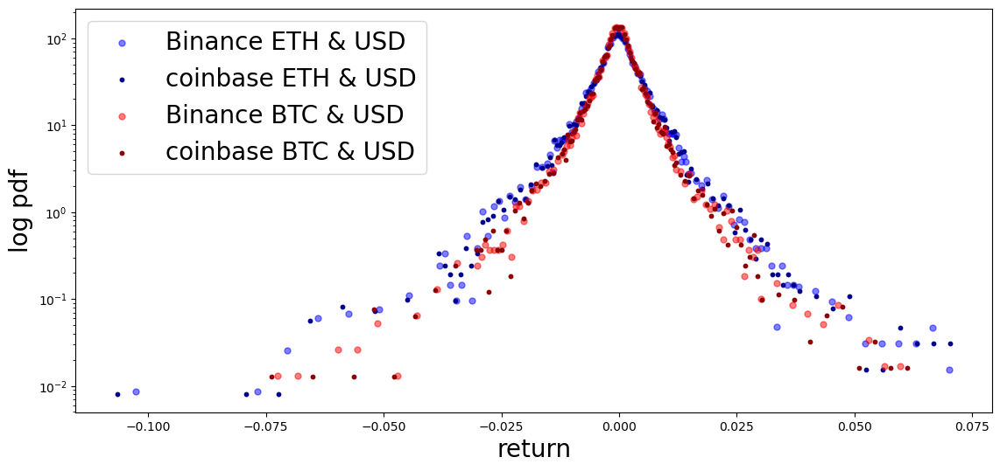

In [552]:
# time align with pool
c=['b','darkblue','r','darkred']
fig,ax = plt.subplots(figsize=(13.5,6))
for k,df in enumerate(temp_): 
    label = df.label[0]
    token = df.token[0]
    t = df.dT[0]
    array =df['return'][1:].values
    if label == 'Binance':
        s=25
        a = 0.5
    else:
        s=10
        a=1
    prob, bins= plot_pdf(array,norm=False);
    ax.scatter(bins[:-1], prob,label= f'{label} {token}' ,color = c[k],s=s,alpha=a)


ax.set_xlabel('return',fontsize=20)
ax.set_ylabel('log pdf',fontsize=20)
ax.set_yscale('log')
ax.legend(fontsize=20)

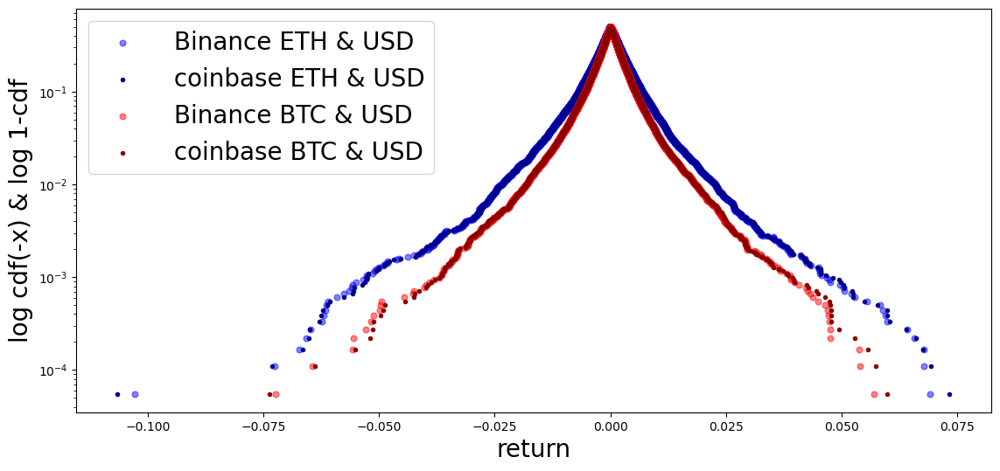

In [553]:
#cdf


fig,ax = plt.subplots(figsize=(13.5,6) )


for k,df in enumerate(temp_):    
    label = df.label[0]
    token = df.token[0]

    array =df['return'][1:].values
    df_plot = cdf_df(array,norm=False)
    df_plot.loc[:,'y']=df_plot.apply( lambda r: np.exp(cdf_modify(r.x,r.y,0)) ,axis=1)   
    if label == 'Binance':
        s=25
        a = 0.5
    else:
        s=10
        a=1
    #plt.scatter(df_plot['x'], df_plot['y'] ,label= f' {label}_{token}_{dT}',c=color_list[k],s=4 )
    ax.scatter(df_plot['x'][:-1], df_plot['y'][:-1] ,label= f' {label} {token}',s=s , alpha=a
                ,c=c[k], linewidths= 0.8 )

ax.set_xlabel('return',fontsize=20)
ax.set_ylabel('log cdf(-x) & log 1-cdf',fontsize=20)
ax.set_yscale('log')
ax.legend(fontsize=20)




Acfs of absR don't overlap. But if we align the timeframe, they do. And it seems that ETH has higher values of acf of abs return.

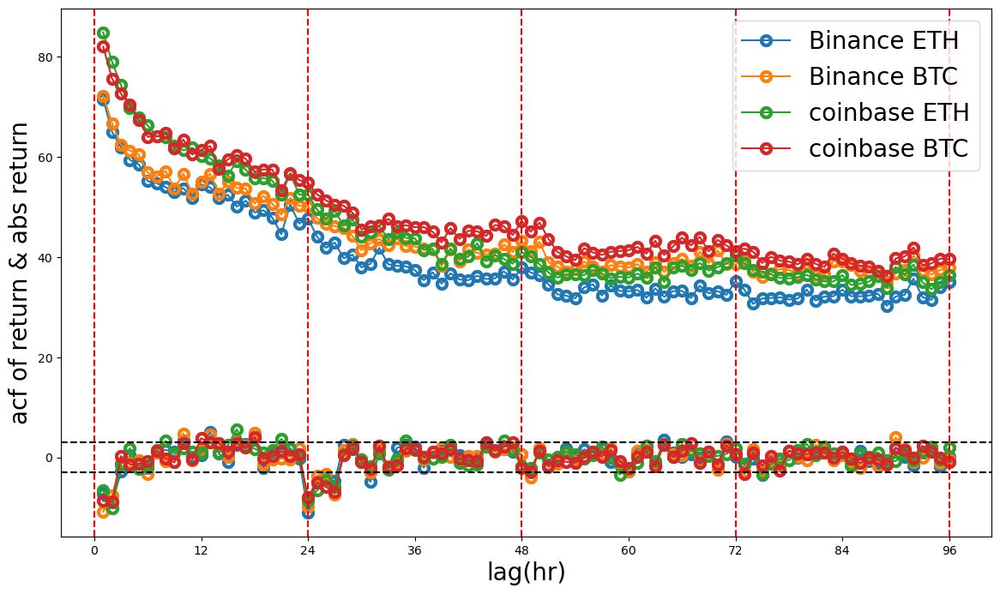

In [568]:
acf_dict = plot_acf( ['none','abs'],pd.concat(temp_))    
label_list = ['Binance all','coinbase all']
fig,ax=plt.subplots(figsize=(14,8))

for l,method in enumerate(['none','abs']):
    df_acf = acf_dict[method]
    k=0
    for lab in label_list:
        df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
        for m,token in enumerate(['ETH & USD', 'BTC & USD']):
            df = df1[df1.token == token]
            if l==0:    
                ax.plot(df.Lags[1:],df['value'][1:],label=f'{lab.replace(" all", "")} {token.replace(" & USD", "")}',marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=8)
            else:
                ax.plot(df.Lags[1:],df['value'][1:],marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=8)
            k+=1         
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')

ax.legend(fontsize = 20,loc=1)

ax.set_xticks([0,12,24,36,48,60,72,84,96])

ax.set_ylabel('acf of return & abs return', fontsize=20)
ax.set_xlabel('lag(hr)', fontsize=20)

#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

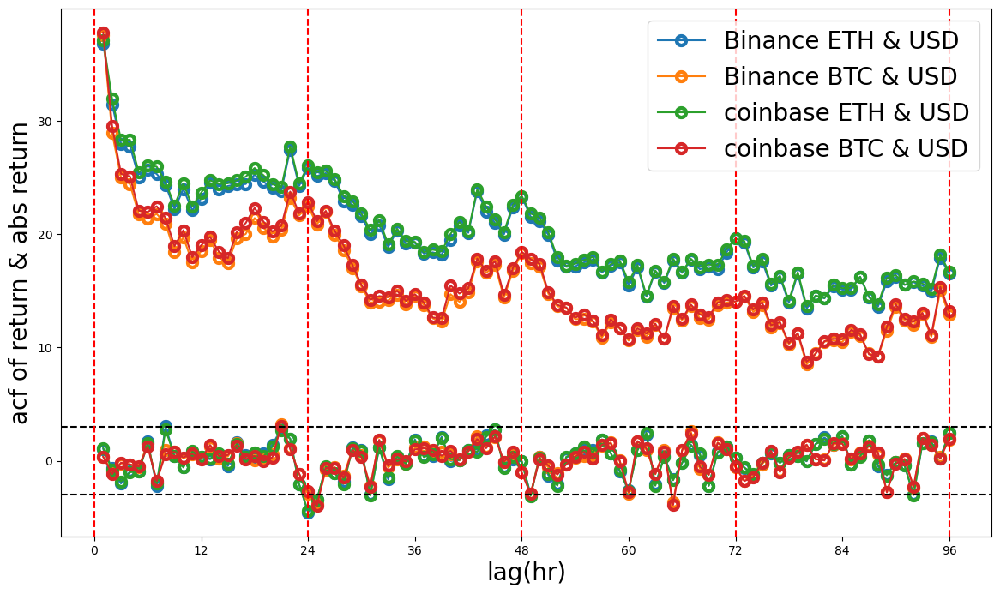

In [570]:
acf_dict = plot_acf( ['none','abs'],pd.concat(temp_))    
label_list = ['Binance','coinbase']
fig,ax=plt.subplots(figsize=(14,8))

for l,method in enumerate(['none','abs']):
    df_acf = acf_dict[method]
    k=0
    for lab in label_list:
        df1= df_acf[(df_acf.label==lab)&(df_acf.dT== '1H')]
        for m,token in enumerate(['ETH & USD', 'BTC & USD']):
            df = df1[df1.token == token]
            if l==0:    
                ax.plot(df.Lags[1:],df['value'][1:],label=f'{lab} {token}',marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=8)
            else:
                ax.plot(df.Lags[1:],df['value'][1:],marker='.'
                     ,mfc ='none', c = c_cycle[k],mew=8)
            k+=1         
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')

ax.legend(fontsize = 20,loc=1)

ax.set_xticks([0,12,24,36,48,60,72,84,96])

ax.set_ylabel('acf of return & abs return', fontsize=20)
ax.set_xlabel('lag(hr)', fontsize=20)

#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

### L1 tokens

After checking the data, we found that XRP has huge data missing on coinbase. This is because XRP faces lawsuit in early 2021 and coinbase removed it from market and brought it back later in 2023. We use Binance data instead.

In [37]:
#read coinbase data

#ETH,BTC
typ = 'L1'
path = f'Data/coinbase/{typ}'

df_list_L1 = []
for token_0 in [name for name in os.listdir(path)]:
    df=  pd.read_csv(f'Data/coinbase/{typ}/{token_0}' , index_col = 'datetime')
    
    print(df.token[0])
    df.index = pd.to_datetime(df.index)
    df['return'] = np.log(df['close']) - np.log(df['close'].shift(1))
    df['dT'] = '1H'
    df = df[['close','return','dT','label','token'] ]
    # df = df[(df.index>=start_time)&(df.index<=end_time)]
    df_list_L1.append(df)
df_all_L1 = pd.concat(df_list_L1)

ADA & USD
ALGO & USD
ATOM & USD
AVAX & USD
BCH & USD
BTC & USD
DOT & USD
ETH & USD
GNO & USD
LTC & USD
SOL & USD
XRP & USD


#### Table

In [510]:
df_check = df_all_L1.copy()

df_check.loc[:,'label'] = df_check.apply( lambda c: c.label+'_'+c.token , axis =1 )
df_check=df_check.groupby('label').apply(lambda x: 
    pd.Series( { 'timeframe': f"{x.index.min().date()} to {x.index.max().date()}",
                'length(day)': f'{(x.index.max().date() - x.index.min().date()).days}',
                'fraction of zeros(%)': round((x['return'] == 0).sum()*100  / len(x),4 ),
                 'sector':'L1'}) )

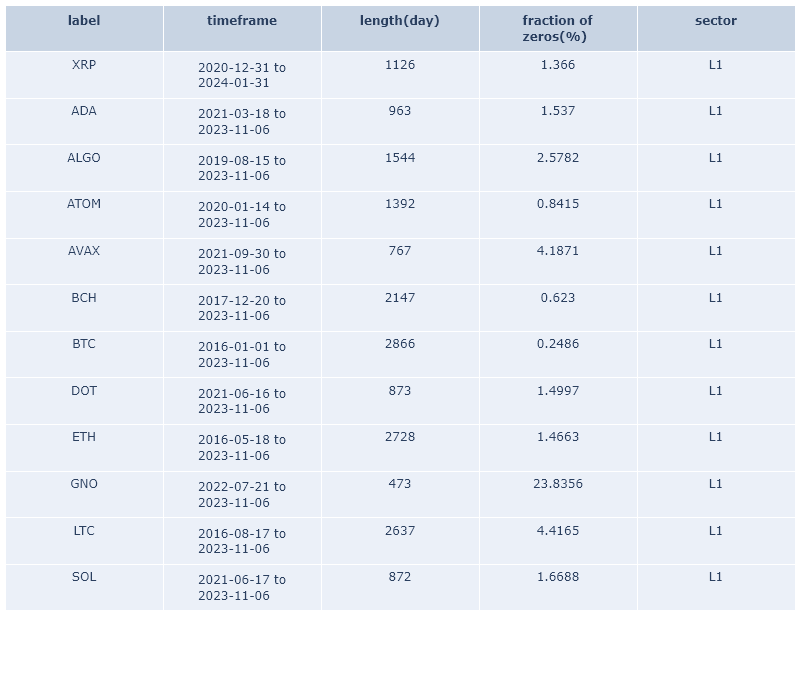

In [514]:
# change label
df = df_check.copy()
df.reset_index(inplace = True)
df.loc[:,  'label'] = ['XRP','ADA','ALGO','ATOM','AVAX','BCH','BTC','DOT','ETH','GNO','LTC','SOL']
df.set_index('label',inplace=True)
fig = df2img.plot_dataframe(df, fig_size=(800, 700))


#### plot pdf 

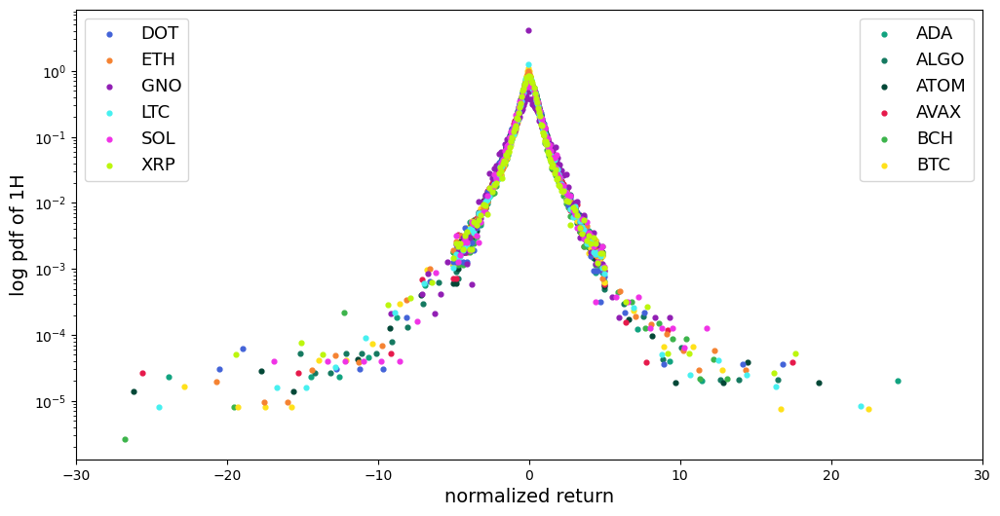

In [691]:
#pdf

fig,ax = plt.subplots(1,1,figsize=(12,6))

for k,df in enumerate(df_list_L1): 
    label = df.label[0]
    token = df.token[0].replace(' & USD' , '')
    t = df.dT[0]
    
    array =df['return'][1:].values

    prob, bins= plot_pdf(array);
    ax.scatter(bins[:-1], prob,label= f'{token}',c= color_list[k], s=12)


handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ] ,loc=2,fontsize=20)

ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel(f'log pdf of {t}',fontsize=20)
ax.set_xlim(-30,30)
ax.set_yscale('log')


#### plot cdf

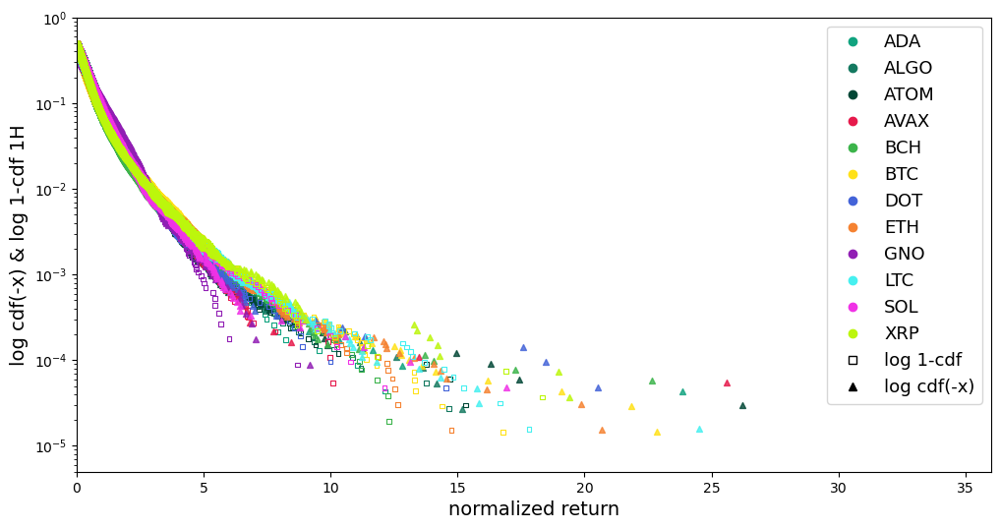

In [692]:
marker_list =['s','^']
label_list = []
fig,ax=plt.subplots(figsize=(12,6))
i=0
for df in df_list_L1:
    t = df.dT[0]
    if t != '1H':
        continue
    label = df.label[0]
    token= df.token[0].replace(' & USD' , '')
    label_list.append(token)
    array =df['return'][1:].values
    # array = array[array!= 0]
    array = array - np.median(array)
    std = np.std(array) 
    array = array/std
    df_plot = cdf_df(array,norm=False)
    df_plot.loc[:,'y']=df_plot.apply( lambda r:cdf_modify(r.x,r.y,0) ,axis=1).apply(np.exp)
    ax.scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , marker= marker_list[0], label= f'1-cdf {label}_{token}_{t}'
                  ,s=12 , facecolor ='none', edgecolor = color_list[i], linewidth = 0.8 )
    ax.scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_list[i] 
                  , marker = marker_list[1] , label= f'cdf(-x) {label}_{token}_{t}',s=18 , alpha= 0.8 )
    i+=1
    
#legend setting
color_legend = [Line2D([0], [0], color=color_list[k], marker='o', linestyle='') for k in range(len(label_list))]
marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                Line2D([0], [0], color='k', marker='^', linestyle='')]
handles = color_legend+marker_legend
labels = label_list + [ 'log 1-cdf','log cdf(-x)' ]
n = len(handles)
first_legend = ax.legend([ handles[i] for i in range( int(n/2) ) ],[ labels[i] for i in range( int(n/2) ) ] ,fontsize=20,loc=1)
ax.add_artist(first_legend)
ax.legend([ handles[i] for i in np.arange(int(n/2),n ) ],[ labels[i] for i in np.arange(int(n/2),n ) ],fontsize=20,loc=9)
ax.set_xlim(0,36)
ax.set_ylim(5*10**(-6),1)
ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel('log cdf(-x) & log 1-cdf 1H',fontsize=20)
ax.set_yscale('log')


#### tails

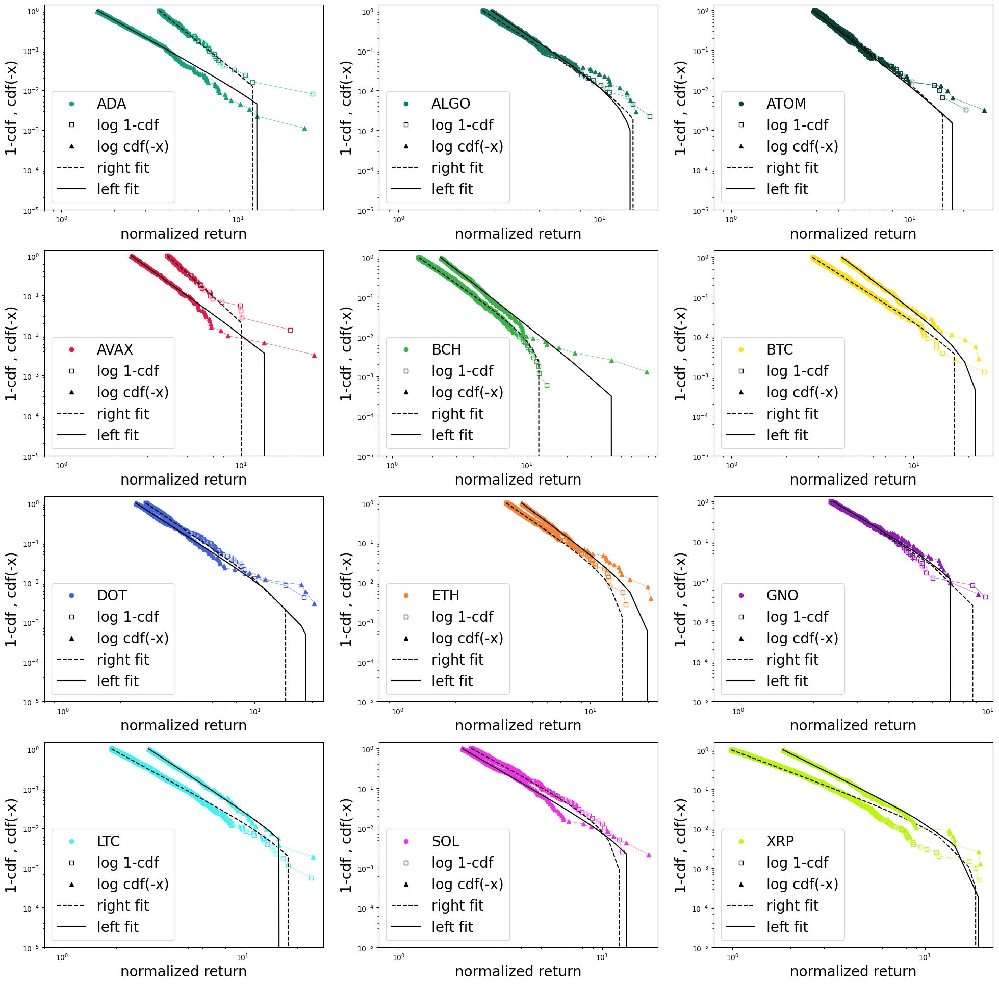

In [114]:
marker_list =['s','^']
token_list = []
fig, ax = plt.subplots(4,3,figsize=(24,24))
# fit_dict_L1 = {}

for k,df in enumerate(df_list_L1):
    label = df.label[0]
    token= df.token[0].replace(' & USD','')
    c = color_list[k]
#     fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l = cdf_tail_fit(df)
#     fit_dict_L1[token] =[fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l ]
    
    fit_r ,fit_l ,slope_r, x_min_r ,slope_l , x_min_l = fit_dict_L1[token]

    i,j = int(k/3) ,k%3
    fit_r.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[0],mfc ='none',mew=1)
    fit_r.power_law.plot_ccdf(color='k', linestyle='--', ax=ax[i,j])
    fit_l.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[1])
    fit_l.power_law.plot_ccdf(color='k', ax=ax[i,j])
    ax[i,j].set_xlabel('normalized return',fontsize=20)
    ax[i,j].set_ylabel('1-cdf , cdf(-x)',fontsize=20)
    ax[i,j].set_ylim(bottom = 10**-5, top = None)
    ax[i,j].set_xlim(left = 0.8,right = None)

    color_legend = [Line2D([0], [0], color=c, marker='o', linestyle='') ]
    marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                 Line2D([0], [0], color='k', marker='^', linestyle=''), 
                 Line2D([0], [0], color='k', linestyle='--'),
                 Line2D([0], [0], color='k')]
    ax[i,j].legend(
         color_legend+marker_legend    , [token]+[ 'log 1-cdf','log cdf(-x)' ]+['right fit','left fit'],
        prop={'size': 20})


In [103]:
# table
_ = {}
for key,value in fit_dict_L1.items():
    _[key] = value[2:]
_ =pd.DataFrame( _ , index=['exp_r','xmin_r','exp_l','xmin_l'])
_

,ADA,ALGO,ATOM,AVAX,BCH,BTC,DOT,ETH,GNO,LTC,SOL,XRP
exp_r,3.535148,3.202228,3.417067,3.979647,2.315247,2.908564,3.278712,3.275177,3.775277,2.494329,2.752904,1.819992
xmin_r,3.579018,2.624180,2.951734,3.875489,1.573092,2.783692,2.706337,3.662307,2.353414,1.882138,2.270999,0.984167
exp_l,2.474909,3.371353,3.473223,3.208967,2.687156,3.408511,3.100227,3.590942,3.707463,2.967370,2.947218,2.413544
xmin_l,1.596748,2.892466,2.871186,2.440210,2.294944,4.035002,2.401519,4.398107,2.409507,3.018182,2.049027,1.826919


In [104]:
_.to_csv('Data/fit table/fit_table_L1.csv')

#### plot acf

GNO seems weird

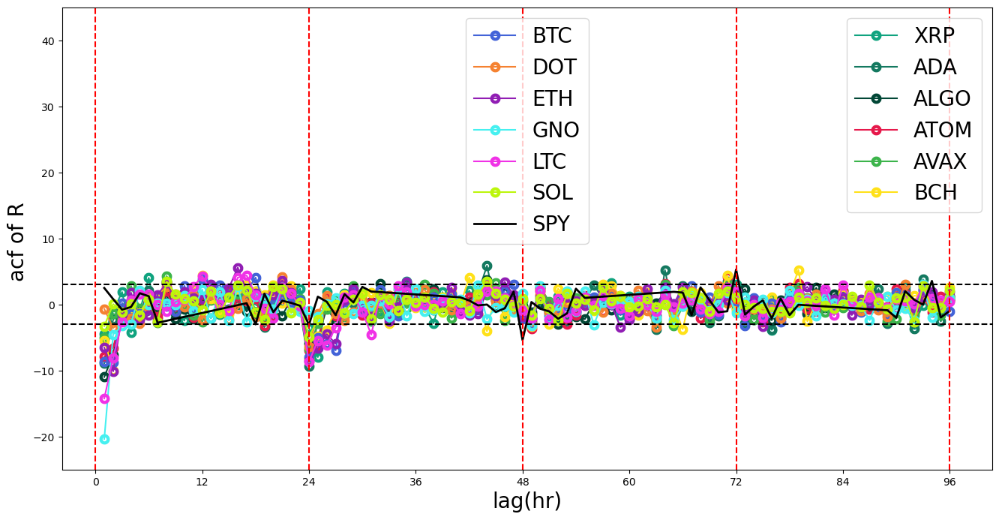

In [43]:
color_list = ['#10A37F', '#147960', '#024736', '#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', 
              '#f032e6', '#bcf60c',  '#800000','#008080', '#e6beff', '#9a6324', '#fffac8', '#aaffc3', '#808000', 
              '#000075', '#808080', '#00008B', '#000000', '#ffd8b1', '#fffac8', '#aaffc3']
acf_dict = plot_acf( ['none','abs'],df_all_L1)    
temp = df_ACF[df_ACF.label.isin(['SPY'])].copy()
temp.token = 'SPY'
method = 'none'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        ax.plot( df.Lags[1:],df['value'][1:],label=token
                 ,c = 'k',lw=2)
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of R ', fontsize = 20)

ylim_p =45
ylim_n =-25
# ylim_p = 130
# ylim_n = -30
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')


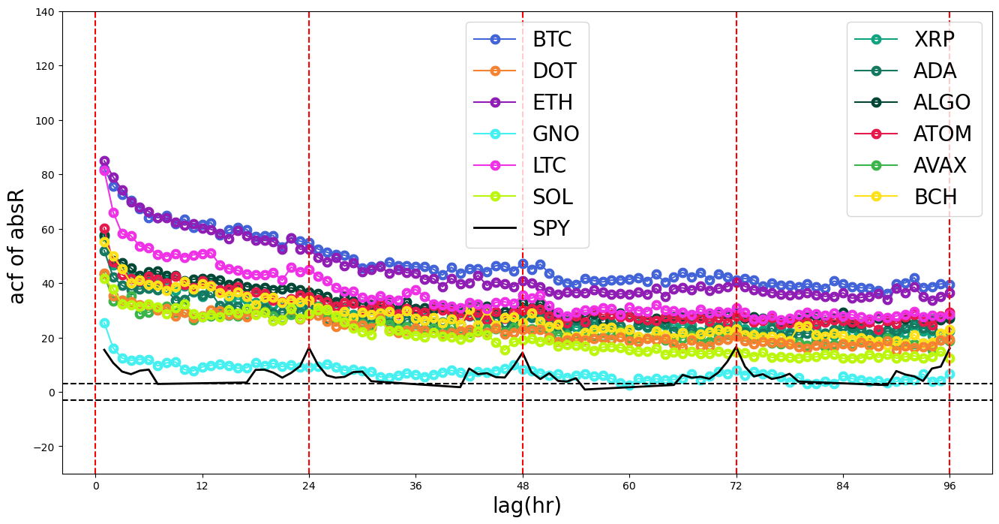

In [57]:
method = 'abs'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        ax.plot( df.Lags[1:],df['value'][1:],label=lab
                 ,c = 'k',lw=2)
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of absR ', fontsize = 20)


ylim_p = 140
ylim_n = -30
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

GNO has low acf value, the below shows that it has many missing data.

In [169]:
print(f'lenght of all data is {len(test)}, but we have 1742 gaps, each roughly 2H. Is this the reason for bizzare acf?' )

lenght of all data is 68784, but we have 1742 gaps, each roughly 2H. Is this the reason for bizzare acf?


In [251]:
test = pd.read_csv('Data/coinbase/all tokens/GNO.csv',index_col='date')
test.index = pd.to_datetime(test.index)
test.reset_index(inplace = True)
test['return'] = np.log(test['close']) - np.log(test['close'].shift(1))
test['diff'] = test.date - test.date.shift(1)
test[test['diff'] != '1H']

,date,unix,low,high,open,close,volume,pair,return,diff
0,2022-07-21 17:00:00+00:00,1658422800,153.00,154.29,154.28,154.28,5.8634,GNO-USD,NaN,NaT
598,2022-08-15 16:00:00+00:00,1660579200,181.47,183.02,182.00,183.02,2.2874,GNO-USD,0.004326,0 days 02:00:00
755,2022-08-22 06:00:00+00:00,1661148000,164.10,165.71,165.02,164.19,6.2833,GNO-USD,-0.008732,0 days 02:00:00
789,2022-08-23 17:00:00+00:00,1661274000,163.97,164.95,163.97,164.95,1.3683,GNO-USD,0.005776,0 days 02:00:00
799,2022-08-24 04:00:00+00:00,1661313600,161.49,161.93,161.58,161.93,1.6360,GNO-USD,0.003898,0 days 02:00:00
...,...,...,...,...,...,...,...,...,...,...
8820,2023-11-04 19:00:00+00:00,1699124400,111.81,112.80,112.00,112.80,1.5224,GNO-USD,0.007117,0 days 02:00:00
8821,2023-11-04 21:00:00+00:00,1699131600,112.39,114.01,112.79,112.91,50.4272,GNO-USD,0.000975,0 days 02:00:00
8825,2023-11-05 03:00:00+00:00,1699153200,113.57,114.51,113.57,114.51,0.6559,GNO-USD,0.009124,0 days 03:00:00
8827,2023-11-05 06:00:00+00:00,1699164000,114.41,114.77,114.77,114.41,0.5245,GNO-USD,-0.003142,0 days 02:00:00


In [24]:
for df in df_list_L1:
    if df.token[0] == 'GNO & USD':
        break
r = len(df[ df['return']==0] )/len(df)
print(f' GNO has {r} fraction of returns are zero')

 GNO has 0.23835568101623147 fraction of returns are zero


In [47]:
for df in df_list_L1:
    if df.token[0] == 'BTC & USD':
        break
print(f'BTC has {len(df[ df["return"]==0] )/len(df)} fraction of returns are zero')

BTC has 0.002486007123646144 fraction of returns are zero


(2, 3162.2776601683795)

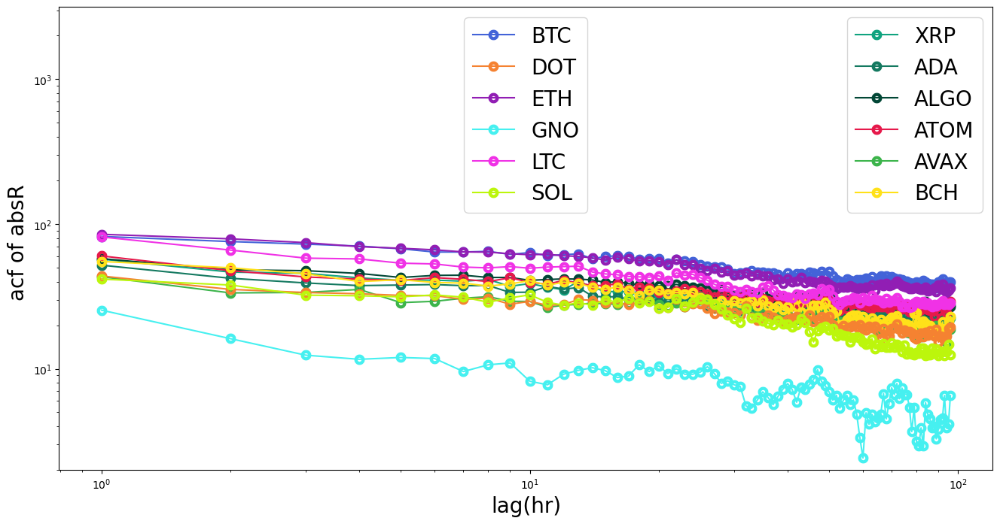

In [63]:
# log-log acf of absR
method = 'abs'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        continue
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of absR ', fontsize = 20)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_ylim( 2,10**3.5)

In [51]:
# acf table
df = acf_dict['none']
acf_table_L1 = pd.concat( [df[df.Lags ==1].reset_index().drop(columns='index'),
         df[(df.Lags ==24)].reset_index().drop(columns='index')])
acf_table_L1.to_csv('Data/pool_CEX_acf_table_L1.csv')

### L2 + Oracle + Gaming + Shitcoin tokens
Ignore DAI and USDT. For SHIB, we choose the data that starting from 2022(before 2022 price fluctuate alot).

In [64]:
df_list_mix = []

for s in ['L2','Oracle','Gaming','Shitcoin','Stable']:
    typ = s
    path = f'Data/coinbase/{typ}'

    for token_0 in [name for name in os.listdir(path)]:
        df=  pd.read_csv(f'Data/coinbase/{typ}/{token_0}' , index_col = 'datetime')
        token = df.token[0]
        if token in ['DAI & USD' ,'USDT & USD']:
            continue
        print(token)
        df.index = pd.to_datetime(df.index)
        df['return'] = np.log(df['close']) - np.log(df['close'].shift(1))
        df['dT'] = '1H'
        df = df[['close','return','dT','label','token'] ]
        if token == 'SHIB & USD':
            df = df[(df.index>='2022')]
        df_list_mix.append(df)
# also compare them with ETH
df_list_mix.append(df_all_L1[df_all_L1.token=='ETH & USD'].copy())
df_all_mix = pd.concat(df_list_mix)

MATIC & USD
OP & USD
LINK & USD
AXS & USD
SAND & USD
DOGE & USD
SHIB & USD


#### Table

In [463]:
df_check = df_all_mix.copy()

df_check.loc[:,'label'] = df_check.apply( lambda c: c.label+'_'+c.token , axis =1 )
df_check=df_check.groupby('label').apply(lambda x: 
    pd.Series( { 'timeframe': f"{x.index.min().date()} to {x.index.max().date()}",
                'length(day)': f'{(x.index.max().date() - x.index.min().date()).days}',
                'fraction of zeros(%)': round((x['return'] == 0).sum()*100  / len(x),4 ),
                 }) )

L2 = ['OP','MATIC']
Oracle = ['LINK']
Gaming =['SAND','AXS']
Shitcoin = ['DOGE','SHIB']

In [488]:
def sector(lab):
    if lab in L2:
        return 'L2'
    elif lab in Oracle:
        return 'Oracle'
    elif lab in Gaming:
        return 'Gaming'
    elif lab in Shitcoin:
        return 'Shitcoin'
    elif lab in Defi:
        return 'Defi'

In [503]:
df2 = df_check.copy()
df2.reset_index(inplace=True)
df2.loc[:,'label'] = df2.apply(lambda r: r.label.split('coinbase_')[1].split(' & USD')[0] , axis=1)
df2 = df2[~df2.label.isin(['BTC','ETH'])]
df2['sector'] = df2.apply(lambda r: sector(r.label), axis =1)
df2 = df2.set_index('label')
df_L2 = df2[df2.sector=='L2']
df_Gaming = df2[df2.sector=='Gaming']
df_Oracle = df2[df2.sector=='Oracle']
df_Shitcoin = df2[df2.sector=='Shitcoin']

#### pdf

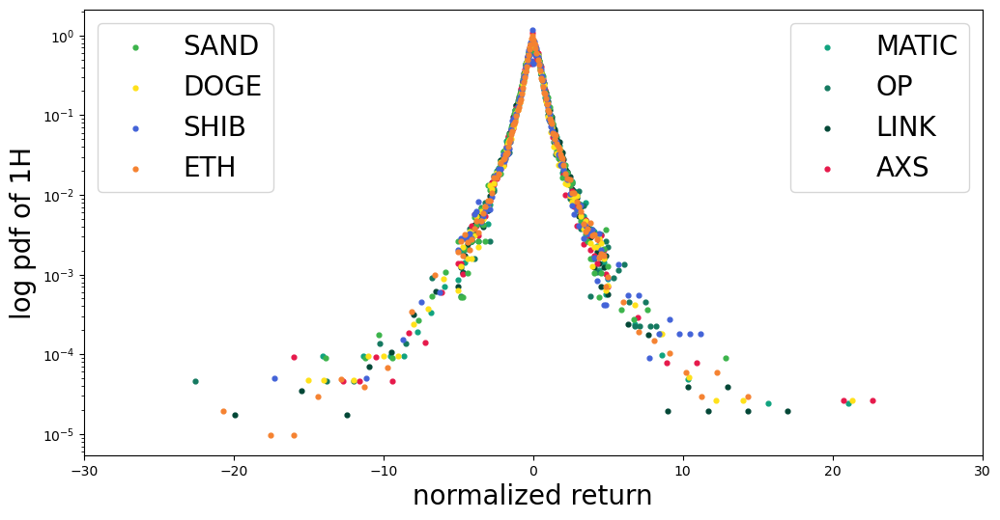

In [65]:
#pdf

fig,ax = plt.subplots(1,1,figsize=(12,6))

for k,df in enumerate(df_list_mix): 
    label = df.label[0]
    token = df.token[0].replace(' & USD' , '')
    t = df.dT[0]
    
    array =df['return'][1:].values

    prob, bins= plot_pdf(array);
    ax.scatter(bins[:-1], prob,label= f'{token}',c= color_list[k], s=12)


handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ] ,loc=2,fontsize=20)

ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel(f'log pdf of {t}',fontsize=20)
ax.set_xlim(-30,30)
ax.set_yscale('log')


DAI and USDT are sharper and concentrated roughly in $(-5,5)$ (also SHIBA).

#### cdf

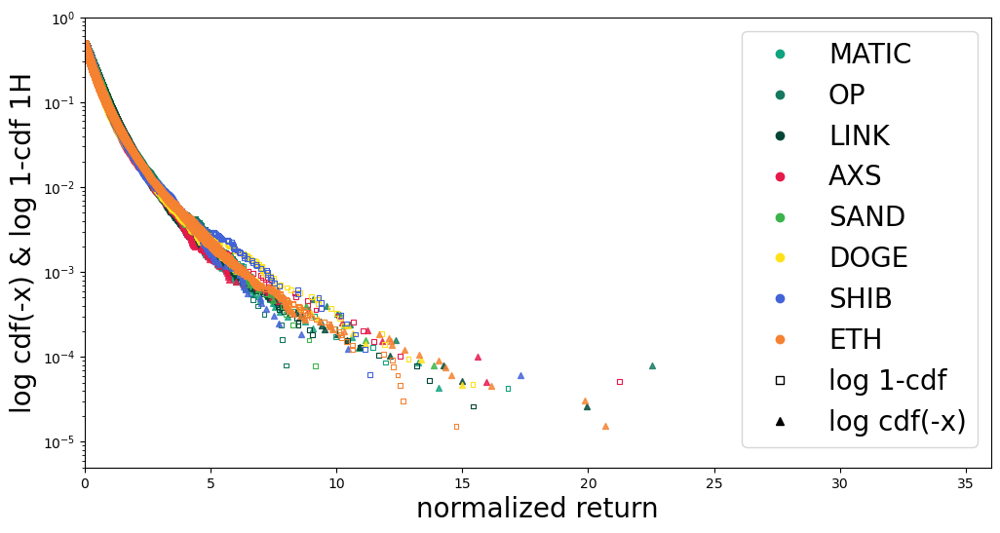

In [156]:
marker_list =['s','^']
label_list = []
fig,ax=plt.subplots(figsize=(12,6))
i=0
for df in df_list_mix:
    t = df.dT[0]
    if t != '1H':
        continue
    label = df.label[0]
    token= df.token[0].replace(' & USD' , '')
    label_list.append(token)
    array =df['return'][1:].values
    # array = array[array!= 0]
    array = array - np.median(array)
    std = np.std(array) 
    array = array/std
    df_plot = cdf_df(array,norm=False)
    df_plot.loc[:,'y']=df_plot.apply( lambda r:cdf_modify(r.x,r.y,0) ,axis=1).apply(np.exp)
    ax.scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , marker= marker_list[0], label= f'1-cdf {token}'
                  ,s=12 , facecolor ='none', edgecolor = color_list[i], linewidth = 0.8 )
    ax.scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_list[i] 
                  , marker = marker_list[1] , label= f'cdf(-x) {token}',s=18 , alpha= 0.8 )
    i+=1
    
#legend setting
color_legend = [Line2D([0], [0], color=color_list[k], marker='o', linestyle='') for k in range(len(label_list))]
marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                Line2D([0], [0], color='k', marker='^', linestyle='')]
handles = color_legend+marker_legend
labels = label_list + [ 'log 1-cdf','log cdf(-x)' ]
n = len(handles)
# first_legend = ax.legend([ handles[i] for i in range( int(n/2) ) ],[ labels[i] for i in range( int(n/2) ) ] , loc = 1)
# ax.add_artist(first_legend)
# ax.legend([ handles[i] for i in np.arange(int(n/2),n ) ],[ labels[i] for i in np.arange(int(n/2),n ) ] ,loc=(0.45,0.63))
ax.legend(handles,labels,fontsize=20)
ax.set_xlim(0,36)
ax.set_ylim(5*10**(-6),1)
ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel('log cdf(-x) & log 1-cdf 1H',fontsize=20)
ax.set_yscale('log')


#### tails

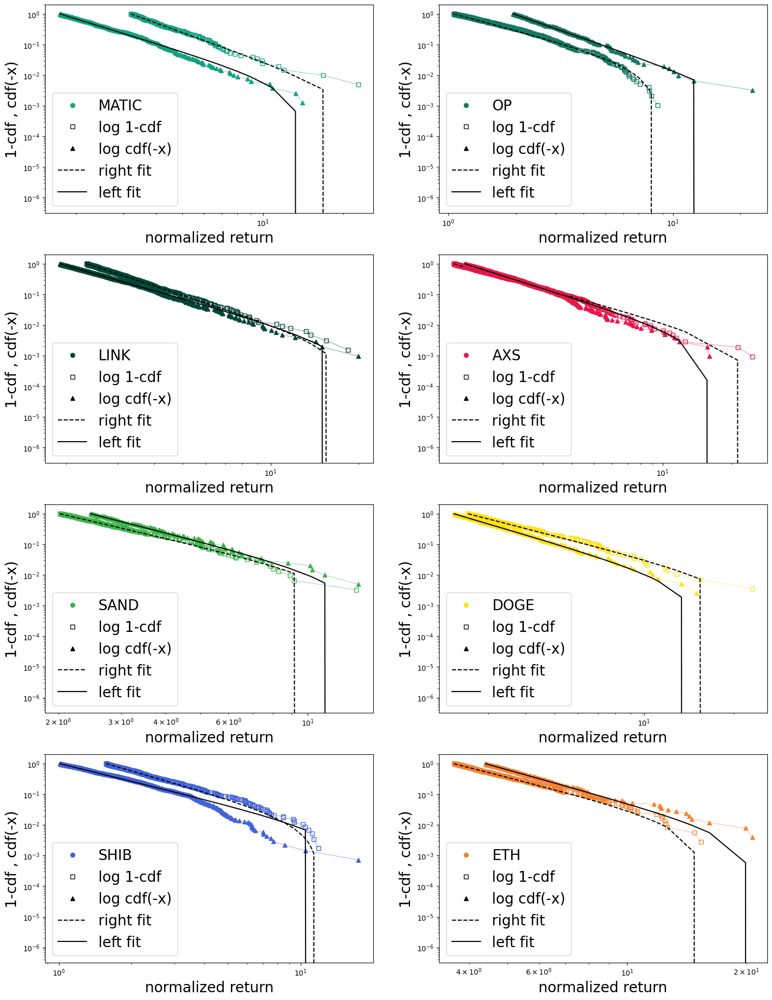

In [105]:
marker_list =['s','^']
token_list = []
fig, ax = plt.subplots(4,2,figsize=(18,24))
# fit_dict_mix = {}

for k,df in enumerate(df_list_mix):
    label = df.label[0]
    token= df.token[0].replace(' & USD','')
    c = color_list[k]
    # fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l = cdf_tail_fit(df)
    # fit_dict_mix[token] =[fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l ]
    
    fit_r ,fit_l ,slope_r, x_min_r ,slope_l , x_min_l = fit_dict_mix[token]

    i,j = int(k/2) ,k%2
    fit_r.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[0],mfc ='none',mew=1)
    fit_r.power_law.plot_ccdf(color='k', linestyle='--', ax=ax[i,j])
    fit_l.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[1])
    fit_l.power_law.plot_ccdf(color='k', ax=ax[i,j])
    ax[i,j].set_xlabel('normalized return',fontsize=20)
    ax[i,j].set_ylabel('1-cdf , cdf(-x)',fontsize=20)
    ax[i,j].set_ylim(bottom = 10**-6.5, top = 2)

    color_legend = [Line2D([0], [0], color=c, marker='o', linestyle='') ]
    marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                 Line2D([0], [0], color='k', marker='^', linestyle=''), 
                 Line2D([0], [0], color='k', linestyle='--'),
                 Line2D([0], [0], color='k')]
    ax[i,j].legend(
         color_legend+marker_legend    , [token]+[ 'log 1-cdf','log cdf(-x)' ]+['right fit','left fit'],
        prop={'size': 20})


In [106]:
# table
_ = {}
for key,value in fit_dict_mix.items():
    _[key] = value[2:]
_ =pd.DataFrame( _ , index=['exp_r','xmin_r','exp_l','xmin_l'])
_.to_csv('Data/fit table/fit_table_mix.csv')

In [107]:
_

,MATIC,OP,LINK,AXS,SAND,DOGE,SHIB,ETH
exp_r,3.130964,1.926725,3.112262,2.070447,2.693188,2.477887,2.226090,3.275177
xmin_r,3.201786,1.057775,2.351300,1.221356,2.018810,2.563198,1.567248,3.662307
exp_l,2.654437,2.546794,2.712962,2.354520,2.953511,2.851462,1.931201,3.590942
xmin_l,1.735532,1.943299,1.903272,1.364695,2.462197,2.296443,1.009694,4.398107


#### acf

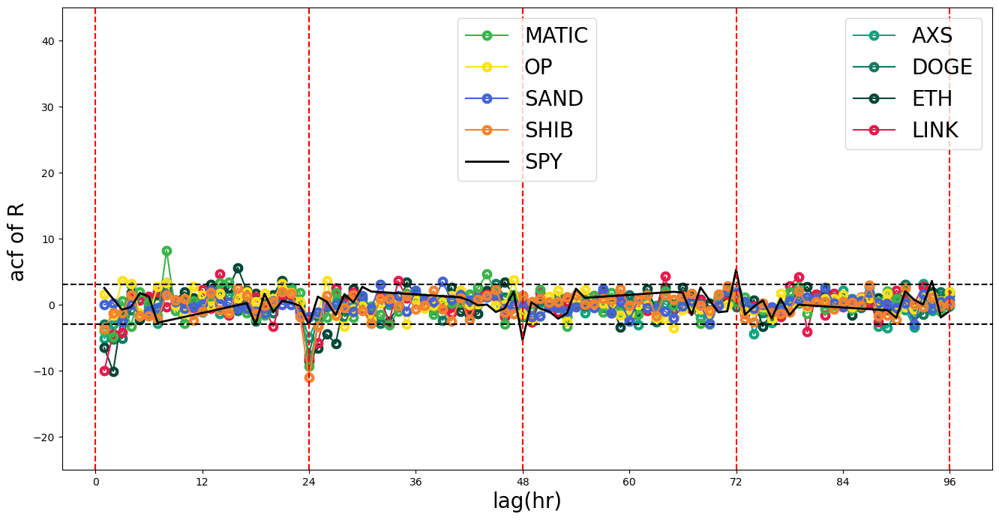

In [81]:
acf_dict = plot_acf( ['none','abs'],df_all_mix)    
temp = df_ACF[df_ACF.label.isin(['SPY'])].copy()
temp.token = 'SPY'
method = 'none'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        ax.plot( df.Lags[1:],df['value'][1:],label=token
                 ,c = 'k',lw=2)
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of R ', fontsize = 20)

ylim_p =45
ylim_n =-25
# ylim_p = 130
# ylim_n = -30
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')


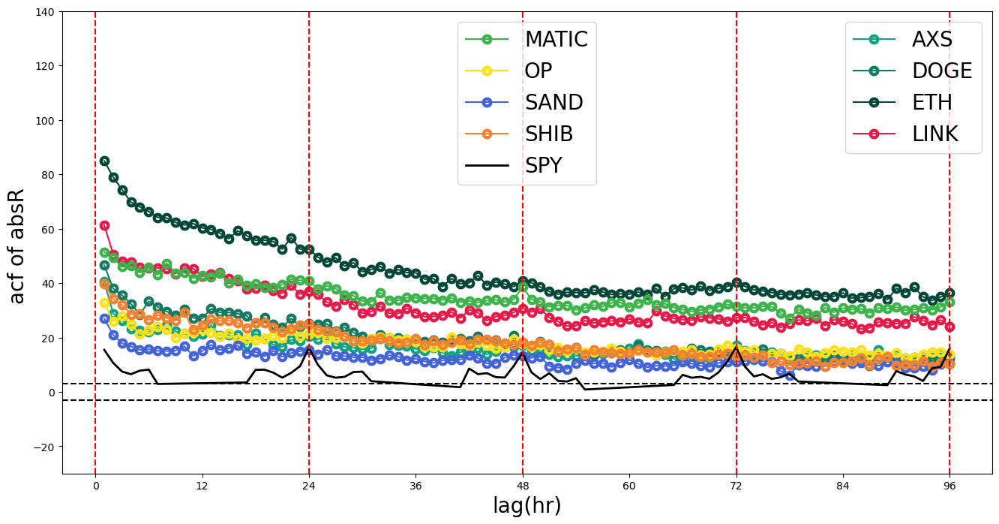

In [68]:
method = 'abs'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        ax.plot( df.Lags[1:],df['value'][1:],label=lab
                 ,c = 'k',lw=2)
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of absR ', fontsize = 20)


ylim_p = 140
ylim_n = -30
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

DAI and SHIB have very low acf of abs R. MATIC  has the highest abs R. 
Also, SHIB has stange peak aat 24h.


In [81]:
for df in df_list_mix:
    if df.token[0] == 'USDT & USD':
        break
r = len(df[ df['return']==0] )/len(df)
print(f' USDT has {r} fraction of returns are zero')

 USDT has 0.23608078602620086 fraction of returns are zero


DAI has lower liquidity

In [211]:
for df in df_list_mix:
    if df.token[0] == 'DAI & USD':
        break
r = len(df[ df['return']==0] )/len(df)
print(f' DAI has {r} fraction of returns are zero')

 DAI has 0.1851419302514193 fraction of returns are zero


SHIB has higher liquidity but still has lower acf of abs return, we'll drop early data

In [82]:
for df in df_list_mix:
    if df.token[0] == 'SHIB & USD':
        break
r = len(df[ df['return']==0] )/len(df)
print(f' SHIB has {r} fraction of returns are zero')

 SHIB has 0.07768428851140392 fraction of returns are zero


(array([18993., 19083., 19174., 19266., 19358., 19448., 19539., 19631.]),
 [Text(18993.0, 0, '2022-01'),
  Text(19083.0, 0, '2022-04'),
  Text(19174.0, 0, '2022-07'),
  Text(19266.0, 0, '2022-10'),
  Text(19358.0, 0, '2023-01'),
  Text(19448.0, 0, '2023-04'),
  Text(19539.0, 0, '2023-07'),
  Text(19631.0, 0, '2023-10')])

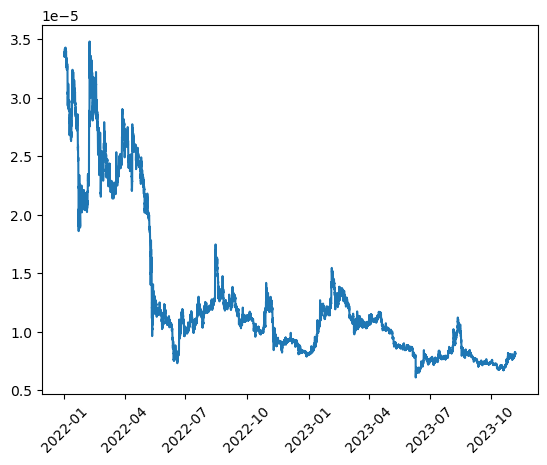

In [85]:
df = df[df.index >'2022']
plt.plot( df.index, df['close'])
plt.xticks(rotation=45)

(5, 1000)

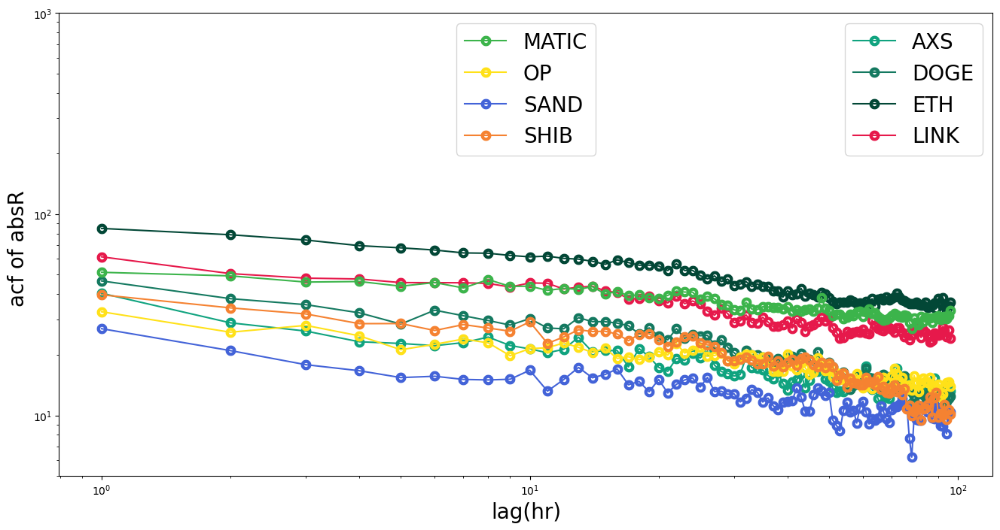

In [72]:
# log-log acf of absR
method = 'abs'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        continue
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of absR ', fontsize = 20)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_ylim( 5,10**3)

In [82]:
# acf table
df = acf_dict['none']
acf_table_mix = pd.concat( [df[df.Lags ==1].reset_index().drop(columns='index'),
         df[(df.Lags ==24)].reset_index().drop(columns='index')])
acf_table_mix.to_csv('Data/pool_CEX_acf_table_mix.csv')

### DeFi tokens

In [73]:
df_list_defi = []

for s in ['DeFi']:
    typ = s
    path = f'Data/coinbase/{typ}'

    for token_0 in [name for name in os.listdir(path)]:
        df=  pd.read_csv(f'Data/coinbase/{typ}/{token_0}' , index_col = 'datetime')
    
        print(df.token[0])
        df.index = pd.to_datetime(df.index)
        df['return'] = np.log(df['close']) - np.log(df['close'].shift(1))
        df['dT'] = '1H'
        df = df[['close','return','dT','label','token'] ]
        # df = df[(df.index>=start_time)&(df.index<=end_time)]
        df_list_defi.append(df)
# also compare them with ETH
df_list_defi.append(df_all_L1[df_all_L1.token=='ETH & USD'].copy())
df_all_defi = pd.concat(df_list_defi)

AAVE & USD
BAL & USD
CRV & USD
CVX & USD
INJ & USD
SNX & USD
UNI & USD


#### Table

In [494]:
DeFi = ['UNI','INJ','AAVE','SNX','MRK','OSMO','FXS','CRV','GMX','CVX','BAL']


In [495]:
df_check = df_all_defi.copy()

df_check.loc[:,'label'] = df_check.apply( lambda c: c.label+'_'+c.token , axis =1 )
df_check=df_check.groupby('label').apply(lambda x: 
    pd.Series( { 'timeframe': f"{x.index.min().date()} to {x.index.max().date()}",
                'length(day)': f'{(x.index.max().date() - x.index.min().date()).days}',
                'fraction of zeros(%)': round((x['return'] == 0).sum()*100  / len(x),4 ),
                 }) )
df3 = df_check.copy()


In [498]:
df3 = df_check.copy()
df3.reset_index(inplace=True)
df3.loc[:,'label'] = df3.apply(lambda r: r.label.split('coinbase_')[1].split(' & USD')[0] , axis=1)
df3 = df3[~df3.label.isin(['BTC','ETH'])]
df3['sector'] = 'Defi'
df3 = df3.set_index('label')

In [587]:
df_table = pd.concat([df,df_L2,df_Oracle,df_Gaming,df_Shitcoin,df3])
def cmap(s):
    if s == 'L1':
        return 'lavender'
    elif s== 'L2':
        return 'bisque'
    elif s=='Oracle':
        return 'wheat'
    elif s=='Gaming':
        return 'mistyrose'
    elif s=='Shitcoin':
        return 'pink'
    elif s =='Defi':
        return 'palegreen'
c = [cmap(s) for s in df_table['sector'].values ]

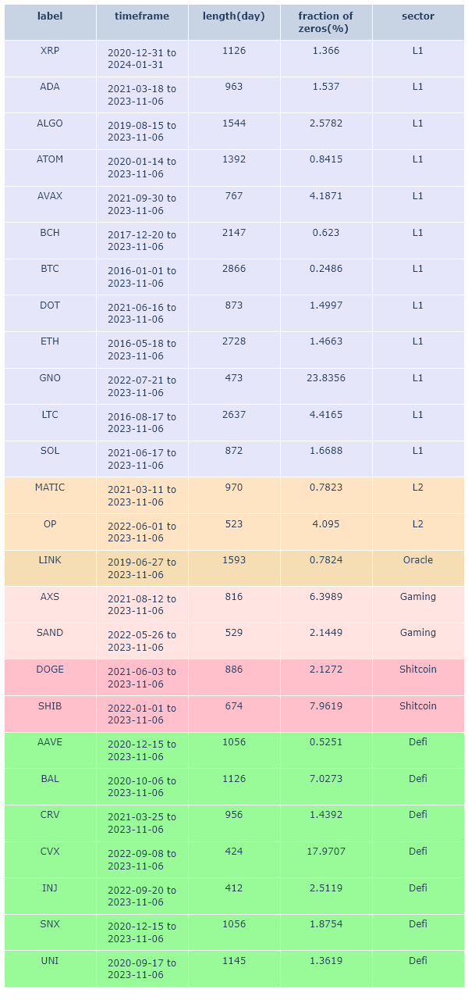

In [588]:
fig = df2img.plot_dataframe(df_table,fig_size=(600,1280),tbl_cells=dict(
        fill_color=[c],
    ),)


#### pdf

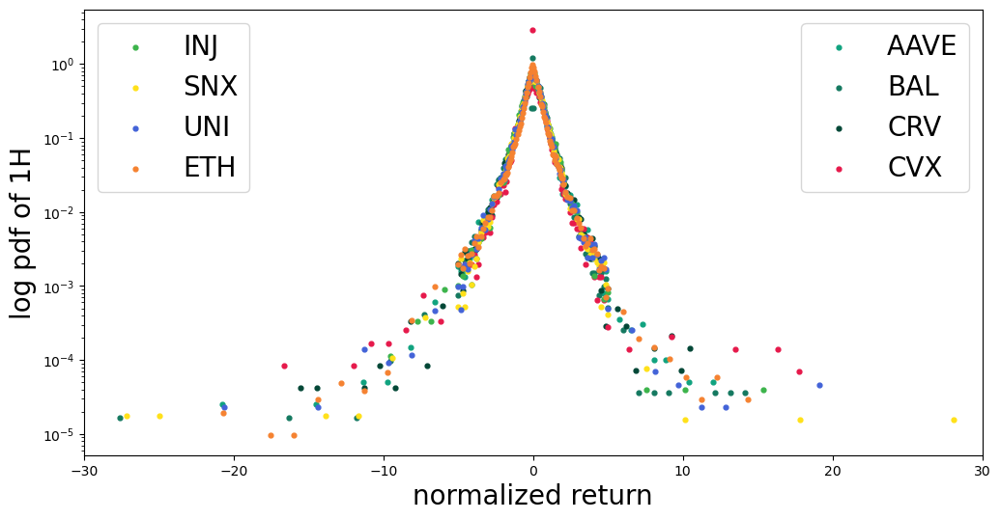

In [80]:
#pdf

fig,ax = plt.subplots(1,1,figsize=(12,6))

for k,df in enumerate(df_list_defi): 
    label = df.label[0]
    token = df.token[0].replace(' & USD' , '')
    t = df.dT[0]
    
    array =df['return'][1:].values

    prob, bins= plot_pdf(array);
    ax.scatter(bins[:-1], prob,label= f'{token}',c= color_list[k], s=12)


handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ] ,loc=2,fontsize=20)

ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel(f'log pdf of {t}',fontsize=20)
ax.set_xlim(-30,30)
ax.set_yscale('log')


#### cdf

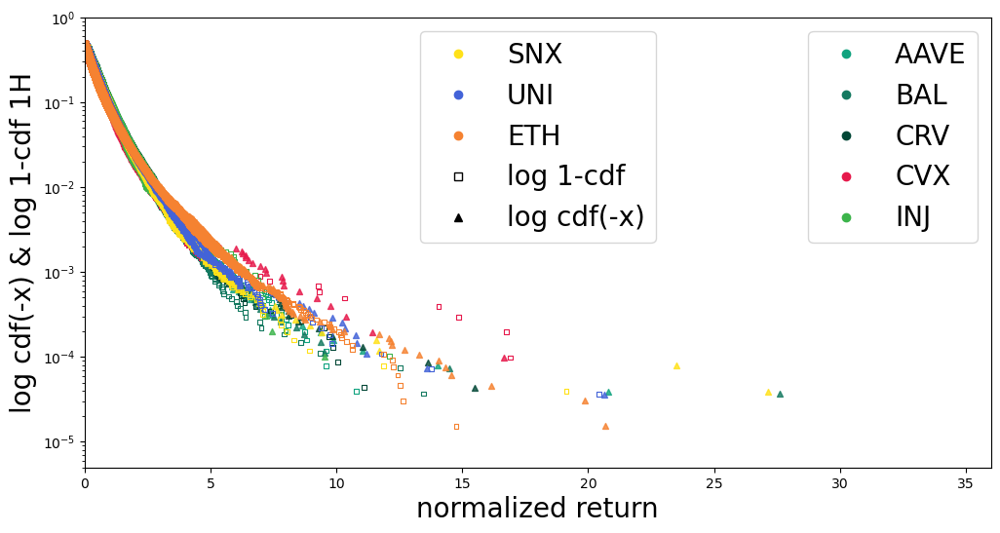

In [154]:
marker_list =['s','^']
label_list = []
fig,ax=plt.subplots(figsize=(12,6))
i=0
for df in df_list_defi:
    t = df.dT[0]
    if t != '1H':
        continue
    label = df.label[0]
    token= df.token[0].replace(' & USD' , '')
    label_list.append(token)
    array =df['return'][1:].values
    # array = array[array!= 0]
    array = array - np.median(array)
    std = np.std(array) 
    array = array/std
    df_plot = cdf_df(array,norm=False)
    df_plot.loc[:,'y']=df_plot.apply( lambda r:cdf_modify(r.x,r.y,0) ,axis=1).apply(np.exp)
    ax.scatter(df_plot[df_plot.x >=0]['x'], df_plot[df_plot.x >=0]['y'] , marker= marker_list[0]
                  ,s=12 , facecolor ='none', edgecolor = color_list[i], linewidth = 0.8 )
    ax.scatter(-df_plot[df_plot.x <0]['x'], df_plot[df_plot.x <0]['y'] , c = color_list[i] 
                  , marker = marker_list[1] ,s=18 , alpha= 0.8 )
    i+=1
    
#legend setting
color_legend = [Line2D([0], [0], color=color_list[k], marker='o', linestyle='') for k in range(len(label_list))]
marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                Line2D([0], [0], color='k', marker='^', linestyle='')]
handles = color_legend+marker_legend
labels = label_list + [ 'log 1-cdf','log cdf(-x)' ]
n = len(handles)
first_legend = ax.legend([ handles[i] for i in range( int(n/2) ) ],[ labels[i] for i in range( int(n/2) ) ] ,fontsize=20,loc=1)
ax.add_artist(first_legend)
ax.legend([ handles[i] for i in np.arange(int(n/2),n ) ],[ labels[i] for i in np.arange(int(n/2),n ) ],fontsize=20,loc=9)
ax.set_xlim(0,36)
ax.set_ylim(5*10**(-6),1)
ax.set_xlabel('normalized return',fontsize=20)
ax.set_ylabel('log cdf(-x) & log 1-cdf 1H',fontsize=20)
ax.set_yscale('log')


#### tails

Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit


D:\Anaconda\lib\site-packages\powerlaw.py:1188: RuntimeWarning:

overflow encountered in scalar power

D:\Anaconda\lib\site-packages\powerlaw.py:835: RuntimeWarning:

invalid value encountered in multiply



Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit


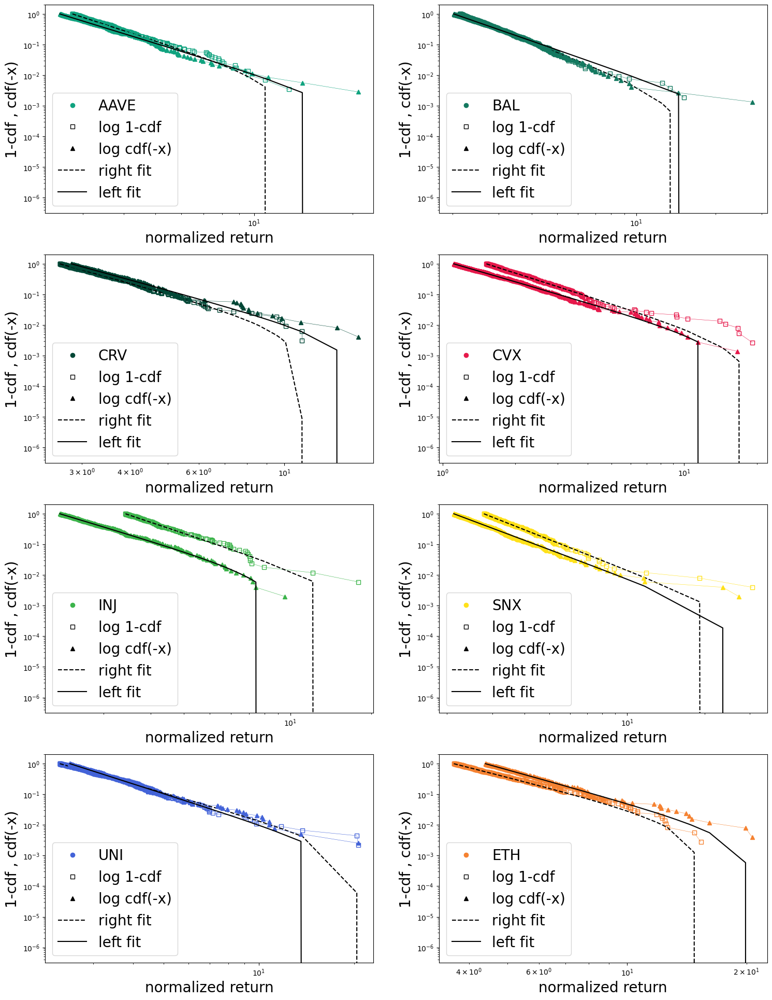

In [92]:
marker_list =['s','^']
token_list = []
fig, ax = plt.subplots(4,2,figsize=(18,24))
#fit_dict_defi = {}

for k,df in enumerate(df_list_defi):
    label = df.label[0]
    token= df.token[0].replace(' & USD','')
    c = color_list[k]
    #fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l = cdf_tail_fit(df)
    #fit_dict_defi[token] =[fit_r,fit_l, slope_r,x_min_r,slope_l,x_min_l ]
    
    fit_r ,fit_l ,slope_r, x_min_r ,slope_l , x_min_l = fit_dict_defi[token]

    i,j = int(k/2) ,k%2
    fit_r.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[0],mfc ='none',mew=1)
    fit_r.power_law.plot_ccdf(color='k', linestyle='--', ax=ax[i,j])
    fit_l.plot_ccdf(color=c, linewidth=0.4, ax=ax[i,j], marker = marker_list[1])
    fit_l.power_law.plot_ccdf(color='k', ax=ax[i,j])
    ax[i,j].set_xlabel('normalized return',fontsize=20)
    ax[i,j].set_ylabel('1-cdf , cdf(-x)',fontsize=20)
    ax[i,j].set_ylim(bottom = 10**-6.5, top = 2)

    color_legend = [Line2D([0], [0], color=c, marker='o', linestyle='') ]
    marker_legend =[Line2D([0], [0], color='k', marker='s',  markerfacecolor ='none',linestyle=''),
                 Line2D([0], [0], color='k', marker='^', linestyle=''), 
                 Line2D([0], [0], color='k', linestyle='--'),
                 Line2D([0], [0], color='k')]
    ax[i,j].legend(
         color_legend+marker_legend    , [token]+[ 'log 1-cdf','log cdf(-x)' ]+['right fit','left fit'],
        prop={'size': 20})


In [109]:
_

,AAVE,BAL,CRV,CVX,INJ,SNX,UNI,ETH
exp_r,3.447090,3.388210,3.481394,2.512341,2.914821,3.310310,2.889423,3.275177
xmin_r,2.791108,2.134238,2.629334,1.520154,2.414780,2.781682,2.350351,3.662307
exp_l,3.285330,2.980478,3.454753,2.289425,2.613871,3.150917,3.298184,3.590942
xmin_l,2.554970,2.023795,2.817890,1.114284,1.373878,2.126688,2.529642,4.398107


In [108]:
# table
_ = {}
for key,value in fit_dict_defi.items():
    _[key] = value[2:]
_ =pd.DataFrame( _ , index=['exp_r','xmin_r','exp_l','xmin_l'])
_.to_csv('Data/fit table/fit_table_defi.csv')

#### acf

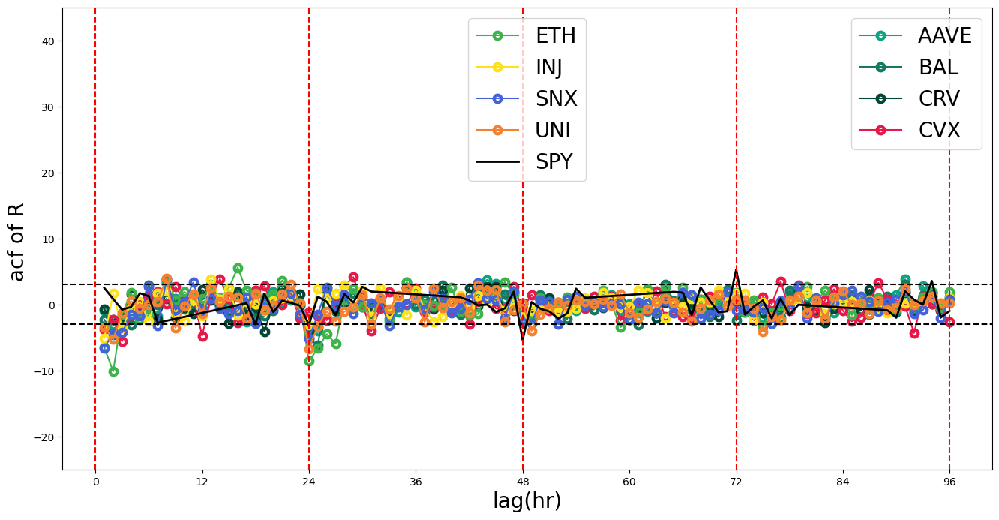

In [84]:
acf_dict = plot_acf( ['none','abs'],df_all_defi)    
temp = df_ACF[df_ACF.label.isin(['SPY'])].copy()
temp.token = 'SPY'
method = 'none'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        ax.plot( df.Lags[1:],df['value'][1:],label=token
                 ,c = 'k',lw=2)
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of R ', fontsize = 20)

ylim_p =45
ylim_n =-25
# ylim_p = 130
# ylim_n = -30
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')


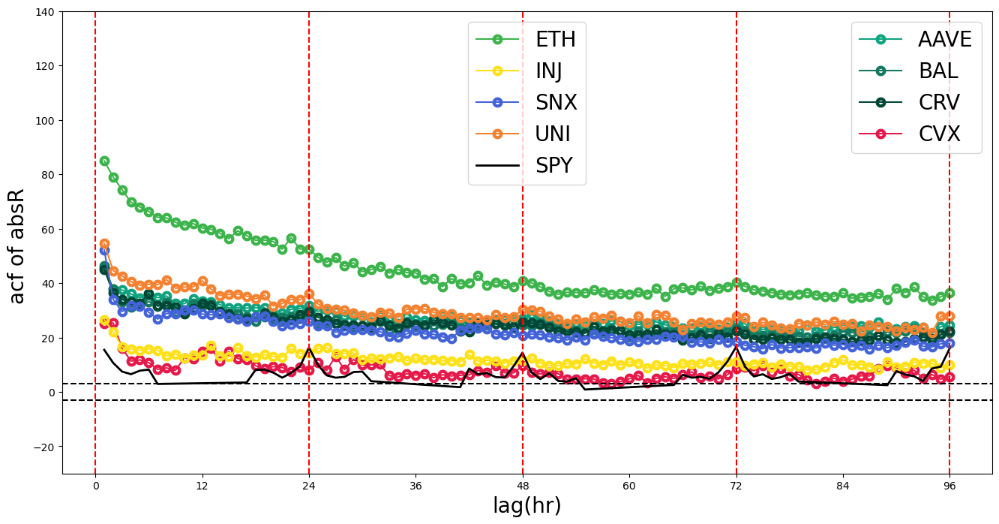

In [75]:
method = 'abs'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        ax.plot( df.Lags[1:],df['value'][1:],label=lab
                 ,c = 'k',lw=2)
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

                
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')
#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of absR ', fontsize = 20)


ylim_p = 140
ylim_n = -30
ax.set_ylim(ylim_n,ylim_p)
ax.set_xticks([0,12,24,36,48,60,72,84,96])
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

CVX has low acf of abs R

In [5]:
for df in df_list_defi:
    if df.token[0] == 'CVX & USD':
        break
r = len(df[ df['return']==0] )/len(df)
print(f' CVX has {r} fraction of returns are zero')

 CVX has 0.17970672177935243 fraction of returns are zero


(2, 1000)

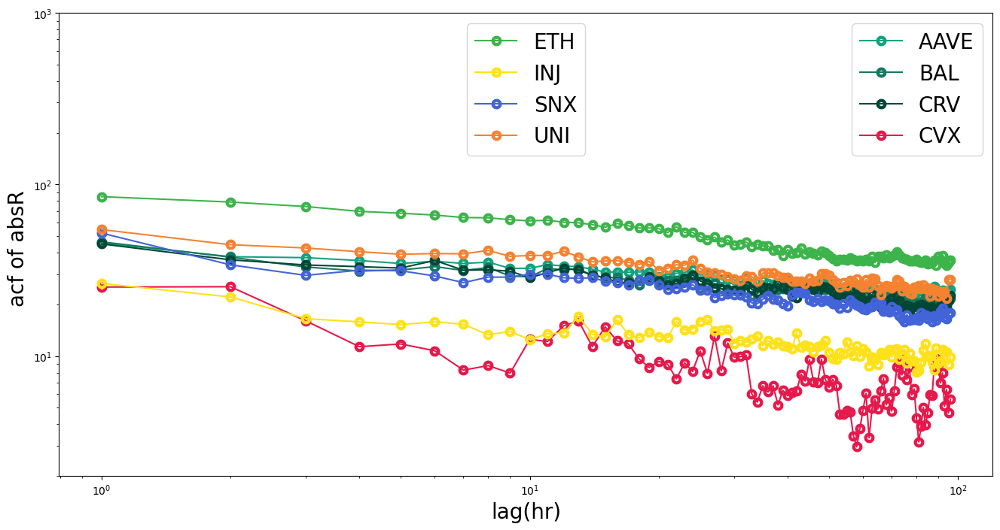

In [79]:
# log-log acf of absR
method = 'abs'
fig,ax=plt.subplots(figsize=(16,8))

df_acf = pd.concat([acf_dict[method],temp[temp.method==method] ]).copy()
token_list = df_acf.token.unique()
for k,token in enumerate(token_list):
    df= df_acf[(df_acf.token==token)&(df_acf.dT== '1H')]
    lab=df.label.values[0]
    if token =='SPY':
        continue
    else:
         ax.plot( df.Lags[1:],df['value'][1:],label=f'{token.replace(" & USD","") }',marker='.'
                 ,mfc ='none', c = color_list[k],mew=7 )

#labels setting
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1, fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9, fontsize=20 )
ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of absR ', fontsize = 20)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_ylim( 2,10**3)

In [85]:
# acf table
df = acf_dict['none']
acf_table_defi = pd.concat( [df[df.Lags ==1].reset_index().drop(columns='index'),
         df[(df.Lags ==24)].reset_index().drop(columns='index')])
acf_table_defi.to_csv('Data/pool_CEX_acf_table_defi.csv')

## Tables about zero returns and timeframe

In [299]:
df = df_all[df_all.dT=='1H'].copy()
df = df[(df.label.isin([ 'arb_3000','m_500' ])) & (df.token.isin(['WETH & USDC','WETH & USDT'])  )]

In [416]:
print( (df.index.max().date() - df.index.min().date()).days )

755


In [318]:
temp = [df]+df_list_L1+df_list_mix+df_list_defi
df_check = pd.concat(temp)

df_check.loc[:,'label'] = df_check.apply( lambda c: c.label+'_'+c.token , axis =1 )
df_check=df_check.groupby('label').apply(lambda x: 
    pd.Series( { 'timeframe': f"{x.index.min().date()} to {x.index.max().date()}",
                'length(day)': f'{(x.index.max().date() - x.index.min().date()).days}',
                'fraction of zeros(%)': round((x['return'] == 0).sum()*100 / len(x),4 ) } ) )
df_check

In [316]:
df_check[df_check['fraction of zeros'] >=0.1]

,timeframe,length,fraction of zeros
label,,,
coinbase_CVX & USD,2022-09-08 to 2023-11-06,424 days,0.179707
coinbase_GNO & USD,2022-07-21 to 2023-11-06,473 days,0.238356


## Cross correlation
Using USDC, direction: Binance $\to$ pool

In [150]:
token = 'WETH & USDC'
dT = '10min'
cex_return = df_all[ (df_all.label == 'Binance') &( df_all.token == 'ETH & USD' )& (df_all.dT == dT)]['return'].values

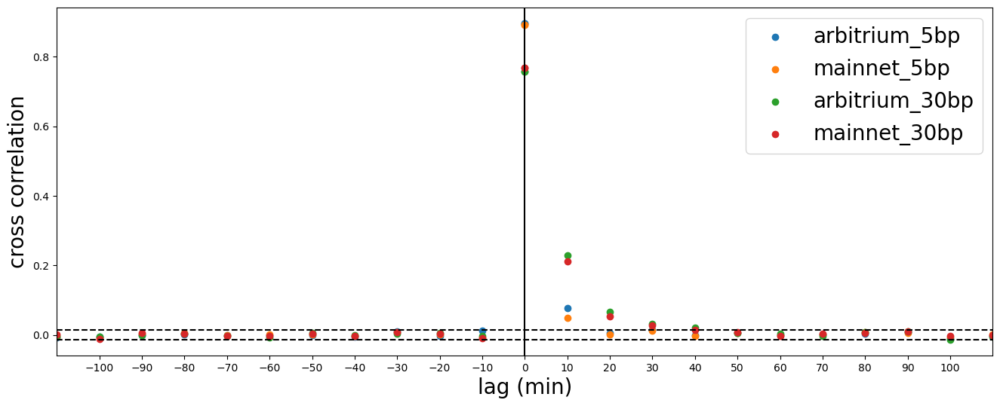

In [151]:

fig,ax = plt.subplots(figsize=(16,6))
for i,lab in enumerate(['arb_500','m_500','arb_3000','m_3000']):
    x_p = cc(lab,token,dT,24)[0]
    x_n = -x_p
    y_p = cc(lab,token,dT,24)[1]
    y_n = cc(lab,token,dT,24)[2]
    #plt.plot(x_p,y_p,color=c_cycle[i],label=f'{lab} {token}',marker='.'
                 #,mfc ='none',mew=3)
    #plt.plot(x_n,y_n,color=c_cycle[i], marker='.'
                 #,mfc ='none',mew=3)
    ax.scatter(10*x_p,y_p,color=c_cycle[i],label=f'{label_dict[lab]}')
    ax.scatter(10*x_n,y_n,color=c_cycle[i])
ax.axvline(x=0,color='k')
ax.axhline(y=2/np.sqrt(18126),color='k',linestyle='dashed')
ax.axhline(y=-2/np.sqrt(18126),color='k',linestyle='dashed')
ax.set_xlabel('lag (min)',fontsize=20)
ax.set_ylabel('cross correlation',fontsize=20)

ax.set_xlim(-110,110)
ax.set_xticks( list(range(-100,110,10)) )
ax.legend(fontsize=20)




## Sending dataframe

Send data to 威綸,  'datetime','close','return','dT', 'label'. Here 'label' is the comb of label(before) and token , 
e.g label(new) = arb_500 WETH & USDC  

In [ ]:
# df_p = test[test.label=='arb_500']
# df_p = df_p[df_p.token=='WETH & USDC']

# df_ETH = test[test.label=='Binance']
# df_ETH = df_ETH[df_ETH.token=='ETH & USD']

# df_BTC = test[test.label=='Binance']
# df_BTC = df_BTC[df_BTC.token=='BTC & USD']


label_list = []
token_list = ['WETH & USDC', 'WETH & USDT']
df_p = test[(test.label =='m_3000')& (test.token in token_list)].copy()

In [15]:
# time_list = ['10min','1H','1D','1W','1M']
time_list = ['5min']

df_list_send =[]
#for df in [df_p,df_ETH,df_BTC]:
for df in [df_p]:
    df1 = df[ ['datetime','close','return','dT']].copy()
    df1 = df1[ df1.dT.isin(time_list)]
    df1['label']=df.apply(lambda r: f'{r.label}  {r.token}' , axis=1)
    df1.set_index('datetime',inplace=True)
    df1.index = pd.to_datetime(df1.index)
    df_list_send.append(df1)

In [16]:
df_send = df_list_send[0]

In [20]:
df_send.to_csv('Data/token dataframe.csv')

In [103]:
for df in df_list_send:
    print(np.unique(df.dT.values),df.label[0])

['10min' '1D' '1H' '1M' '1W'] m_500  WETH & USDC


In [105]:
df_list_send

[                           close    return     dT               label
 datetime                                                             
 2021-09-23 10:40:00  3086.397106  0.002656  10min  m_500  WETH & USDC
 2021-09-23 10:50:00  3086.258979 -0.000045  10min  m_500  WETH & USDC
 2021-09-23 11:00:00  3076.514047 -0.003163  10min  m_500  WETH & USDC
 2021-09-23 11:10:00  3066.661184 -0.003208  10min  m_500  WETH & USDC
 2021-09-23 11:20:00  3077.333667  0.003474  10min  m_500  WETH & USDC
 ...                          ...       ...    ...                 ...
 2023-09-18 15:30:00  1659.092333 -0.053862     1M  m_500  WETH & USDC
 2023-09-18 15:40:00  1658.409289 -0.054373     1M  m_500  WETH & USDC
 2023-09-18 15:50:00  1655.782329 -0.052395     1M  m_500  WETH & USDC
 2023-09-18 16:00:00  1657.204231 -0.051613     1M  m_500  WETH & USDC
 2023-09-18 16:10:00  1653.956312 -0.048992     1M  m_500  WETH & USDC
 
 [447670 rows x 4 columns]]

In [35]:
df_crypto_list = df_list_L1+df_list_mix[:-1]+df_list_defi[:-1]

for i,df in enumerate(df_crypto_list):
    df1 = df[ ['close','return','dT']].copy()
    df1['label']=df.apply(lambda r: f'{r.label}  {r.token}' , axis=1)
    df_crypto_list[i]= df1

df_crypto = pd.concat(df_crypto_list)

df_crypto.to_csv('Data/more token.csv')

## Random zeros replacement
Randomly replace $r$ percent of data points of return with zeros, where $r$ is the porpotion of zeros in GNO return data
,roughly $0.238$.

In [633]:
def replace_zero(array,r):
    N = len(array)
    n = max(int(N*r),1)
    replace_index=np.random.choice(np.arange(N),size=n,replace=False)
    temp = array.copy()
    for   i in replace_index:
        temp[i] = 0
    return temp

In [689]:
r= 0.23
temp = df_all_L1[(df_all_L1.label=='coinbase') & (df_all_L1.token=='BTC & USD')][['close','return','dT','label','token']].copy()
temp = temp[temp.dT=='1H']
temp.token = 'BTC'
temp_list =[temp]
test = temp['return'].values[1:]
for i in range(10):
    temp2 =temp[['close','dT','label','token']].copy()
    
    temp2['return']=np.insert(replace_zero(test,r),0,np.NaN)
    temp2.token = 'BTC' + f' {i}'
    temp_list.append(temp2)
df_temp = pd.concat( temp_list)
acf_dict = plot_acf( ['none','abs'],df_temp)    

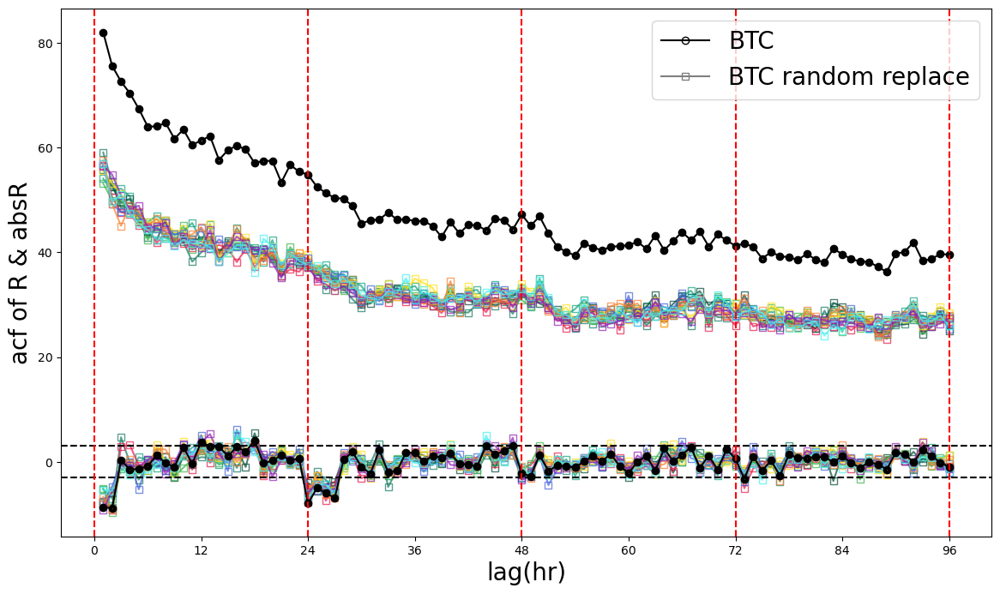

In [690]:
fig,ax=plt.subplots(figsize=(14,8))

for l,method in enumerate(['none','abs']):
    df1 = acf_dict[method]
    for k,token in enumerate([f'BTC {i}' for i in range(10)]+['BTC']):
        if token == 'BTC':
            c = 'k'
            mew =4
            alpha=1
            marker ='.'
        else:
            c = color_list[k]
            mew =1
            alpha=0.7
            marker ='s'
        df = df1[df1.token == token]
        ax.plot(df.Lags[1:],df['value'][1:],marker=marker
                 ,mfc ='none', c = c,mew=mew,alpha=alpha )
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')

#legend setting    
marker_legend =[Line2D([0], [0], color='k',  marker='o', linestyle='-', markerfacecolor ='none'),
                Line2D([0], [0], color=color_list[-6], marker='s', linestyle='-', markerfacecolor ='none')]
ax.legend( marker_legend    , ['BTC']+[ 'BTC random replace' ],
        loc=1,prop={'size': 20})
ax.set_xticks([0,12,24,36,48,60,72,84,96])

ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of R & absR', fontsize=20)
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

In [686]:
r= 0.7
temp = df_all_L1[(df_all_L1.label=='coinbase') & (df_all_L1.token=='BTC & USD')][['close','return','dT','label','token']].copy()
temp = temp[temp.dT=='1H']
temp.token = 'BTC'
temp_list =[temp]
test = temp['return'].values[1:]
for i in range(10):
    temp2 =temp[['close','dT','label','token']].copy()
    
    temp2['return']=np.insert(replace_zero(test,r),0,np.NaN)
    temp2.token = 'BTC' + f' {i}'
    temp_list.append(temp2)
df_temp = pd.concat( temp_list)
acf_dict = plot_acf( ['none','abs'],df_temp)    

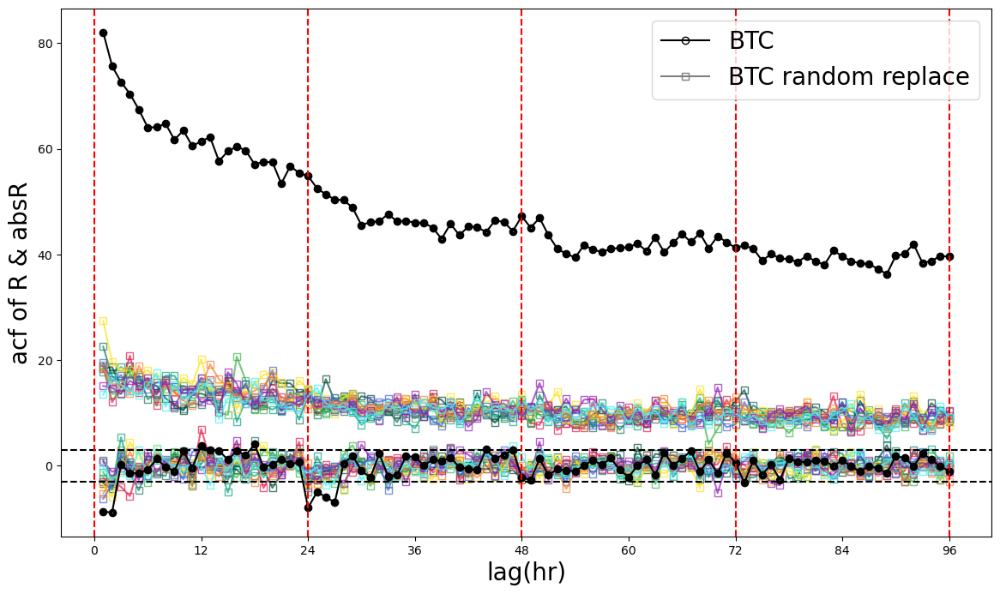

In [688]:
fig,ax=plt.subplots(figsize=(14,8))

for l,method in enumerate(['none','abs']):
    df1 = acf_dict[method]
    for k,token in enumerate([f'BTC {i}' for i in range(10)]+['BTC']):
        if token == 'BTC':
            c = 'k'
            mew =4
            alpha=1
            marker ='.'
        else:
            c = color_list[k]
            mew =1
            alpha=0.7
            marker ='s'
        df = df1[df1.token == token]
        ax.plot(df.Lags[1:],df['value'][1:],marker=marker
                 ,mfc ='none', c = c,mew=mew,alpha=alpha )
ax.axhline(y= 3,c='k',linestyle='dashed')
ax.axhline(y=-3,c='k',linestyle='dashed')

#legend setting    
marker_legend =[Line2D([0], [0], color='k',  marker='o', linestyle='-', markerfacecolor ='none'),
                Line2D([0], [0], color=color_list[-6], marker='s', linestyle='-', markerfacecolor ='none')]
ax.legend( marker_legend    , ['BTC']+[ 'BTC random replace' ],
        loc=1,prop={'size': 20})
ax.set_xticks([0,12,24,36,48,60,72,84,96])

ax.set_xlabel('lag(hr)',fontsize=20)
ax.set_ylabel('acf of R & absR', fontsize=20)
#plot daily vline
for x in [0,24,48,72,96]:
    ax.axvline(x=x,c='red',linestyle='dashed')

## Leverage effect
It is reported that volatility and return are negative correlated in short time region. Such phenomenon is called 
**leverage effect**. Here We quantify this effect by the correlation between return and absolute return:
    $$L(k) \equiv \frac{\mathbb{E}\left[ (\lvert R_{t} \rvert -\mu_{\lvert R \rvert}) (R_{t+k} -        \mu_R)\right]}{\sigma_{\lvert R \rvert} \sigma_R}
$$

Q:why 1hr lag for return in note?  should SPY, EUR also use the similar method as ACF?(hourly analysis have overnight problem)

### Pool & CEX 
Significant negative value at 0,-1, except for BTC.

In [58]:

def leverage(dff,dT='1H',nlag = 10):
    df = dff[dff.dT==dT].copy()
    R = df['return'].values
    absR= np.abs(df['return'])
    y_p = st.tsa.stattools.ccf(R,absR ,nlags= nlag)
    y_n =  st.tsa.stattools.ccf(absR,R,nlags= nlag)
    return np.arange(nlag) , y_p, y_n 
                               

In [53]:
onehr_lsit=[]
for df in df_list:
    if df.dT[0]== '1H':
        print(df.label[0],df.token[0])
        onehr_lsit.append(df)

arb_3000 WETH & USDC
arb_3000 WETH & DAI
arb_500 WETH & USDC
arb_500 WETH & USDT
m_3000 WETH & USDC
m_3000 WETH & USDT
m_3000 WETH & DAI
m_500 WETH & USDC
Binance ETH & USD
Binance all ETH & USD
Binance BTC & USD


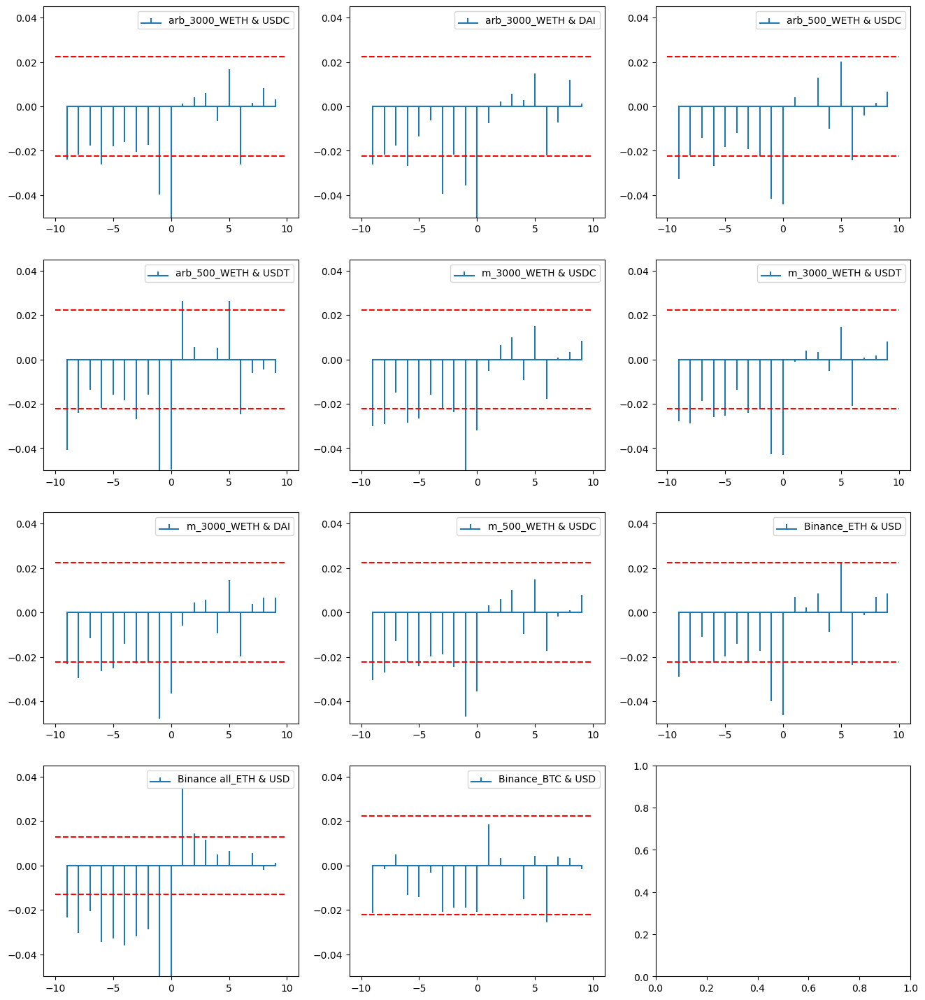

In [91]:
fig,ax = plt.subplots(4,3,figsize=(16,18))
for k,dff in  enumerate(onehr_lsit):
    df= dff.dropna()
    i = int(k/3)
    j = k%3
    lags_array , y_p ,y_n = leverage(df,dT='1H',nlag = 10)
    #plt.plot(lags_array,y_p,label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(-lags_array,y_n, linefmt='-' , markerfmt='', basefmt='C0-', 
        label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(lags_array, y_p , linefmt='-' , markerfmt='', basefmt='C0-')
    ax[i,j].hlines(y=3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].hlines(y=-3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].set_ylim(-0.05,0.045)
    ax[i,j].legend()

### Traditional 
SPY: seems to have leverage effect, but include overnight
EUR: doesn't seem to have leverage effect, but include overnight

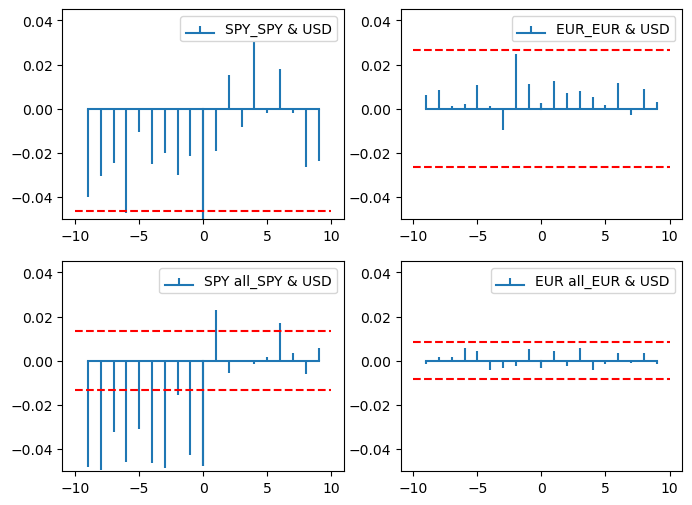

In [95]:
fig,ax = plt.subplots(2,2,figsize=(8,6))
for k,dff in  enumerate(df_list_trad):
    df= dff.dropna()
    i = int(k/2)
    j = k%2
    lags_array , y_p ,y_n = leverage(df,dT='1H',nlag = 10)
    #plt.plot(lags_array,y_p,label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(-lags_array,y_n, linefmt='-' , markerfmt='', basefmt='C0-', 
        label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(lags_array, y_p , linefmt='-' , markerfmt='', basefmt='C0-')
    ax[i,j].hlines(y=3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].hlines(y=-3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].set_ylim(-0.05,0.045)
    ax[i,j].legend()

### L1
GNO, LTC ,XRP : doesn't seems to have the effect
SOL: not sure

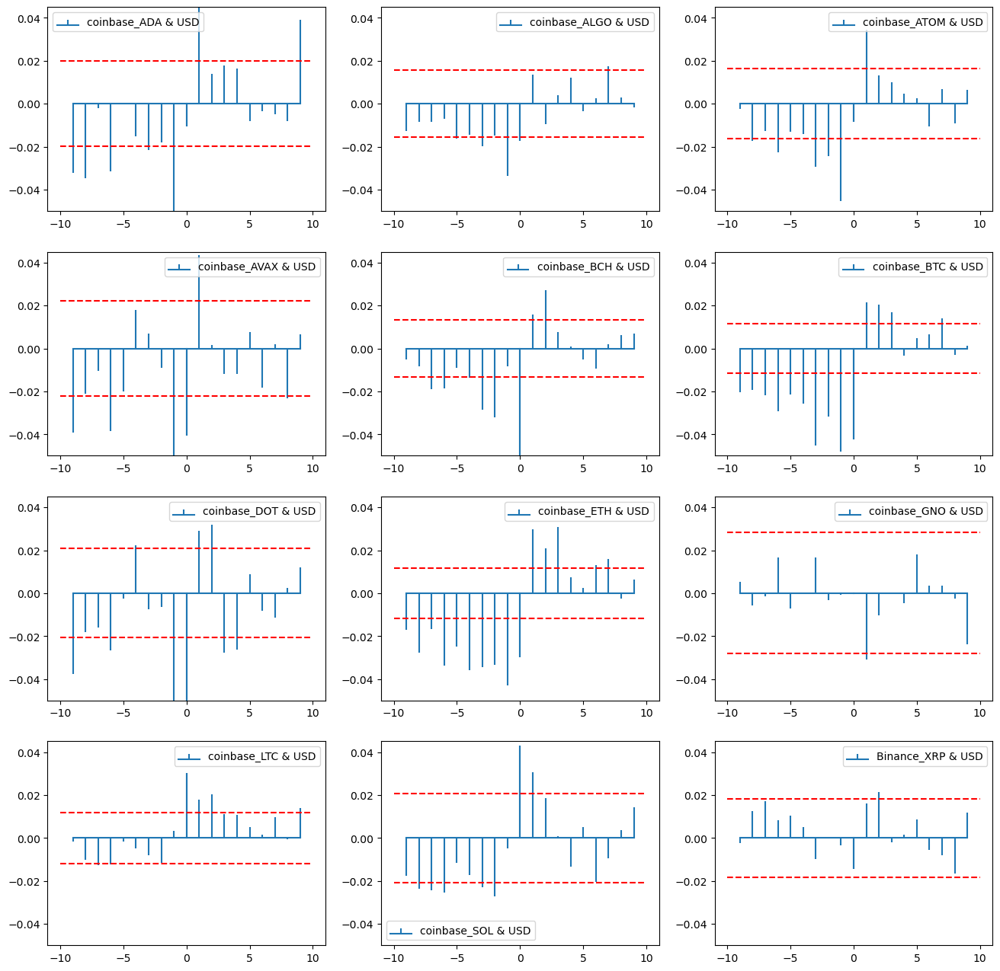

In [98]:
fig,ax = plt.subplots(4,3,figsize=(16,16))
for k,dff in  enumerate(df_list_L1):
    df= dff.dropna()
    i = int(k/3)
    j = k%3
    lags_array , y_p ,y_n = leverage(df,dT='1H',nlag = 10)
    #plt.plot(lags_array,y_p,label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(-lags_array,y_n, linefmt='-' , markerfmt='', basefmt='C0-', 
        label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(lags_array, y_p , linefmt='-' , markerfmt='', basefmt='C0-')
    ax[i,j].hlines(y=3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].hlines(y=-3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].set_ylim(-0.05,0.045)
    ax[i,j].legend()

### L2+others
Only Matic and Link seems to have the efect

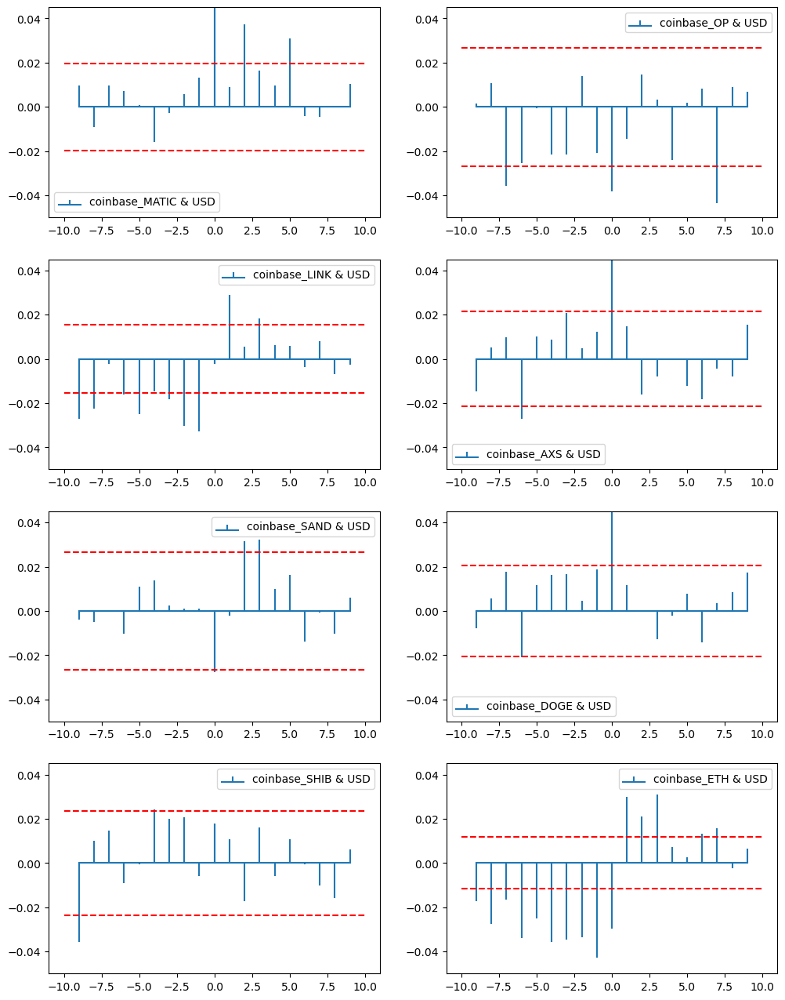

In [100]:
fig,ax = plt.subplots(4,2,figsize=(12,16))
for k,dff in  enumerate(df_list_mix):
    df= dff.dropna()
    i = int(k/2)
    j = k%2
    lags_array , y_p ,y_n = leverage(df,dT='1H',nlag = 10)
    #plt.plot(lags_array,y_p,label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(-lags_array,y_n, linefmt='-' , markerfmt='', basefmt='C0-', 
        label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(lags_array, y_p , linefmt='-' , markerfmt='', basefmt='C0-')
    ax[i,j].hlines(y=3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].hlines(y=-3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].set_ylim(-0.05,0.045)
    ax[i,j].legend()

### Defi
Only BAL has significant effect. CVX,INJ,SNX seem to have the oppsite effect!

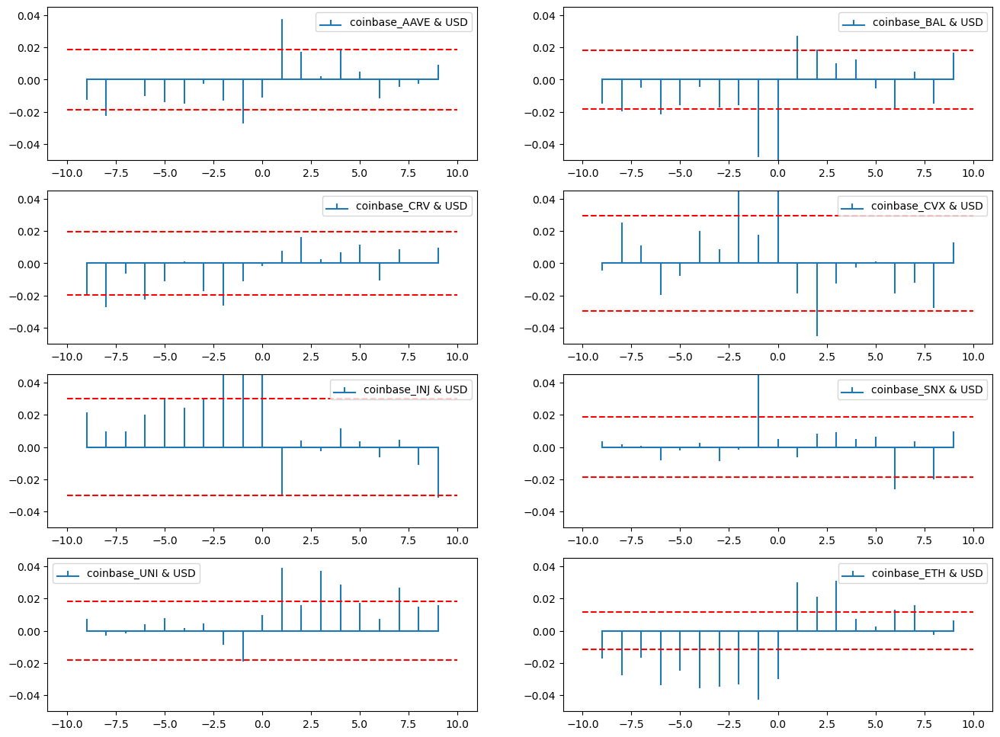

In [108]:
fig,ax = plt.subplots(4,2,figsize=(16,12))
for k,dff in  enumerate(df_list_defi):
    df= dff.dropna()
    i = int(k/2)
    j = k%2
    lags_array , y_p ,y_n = leverage(df,dT='1H',nlag = 10)
    #plt.plot(lags_array,y_p,label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(-lags_array,y_n, linefmt='-' , markerfmt='', basefmt='C0-', 
        label =f'{df.label[0]}_{df.token[0]}')
    ax[i,j].stem(lags_array, y_p , linefmt='-' , markerfmt='', basefmt='C0-')
    ax[i,j].hlines(y=3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].hlines(y=-3/np.sqrt(df.shape[0]),xmin=-10,xmax=10,color='red',linestyles='dashed')
    ax[i,j].set_ylim(-0.05,0.045)
    ax[i,j].legend()

## Time reversal asymmetry/Zumbach effect

We compare the $k >0$ part and $k<0$ part of the following quantity:

$$
  C(k) \equiv  
   \frac{ \mathbb{E}\left[ ( \lvert R_t \rvert - \mu_{\lvert R \rvert} )
  ( s^{(D)}_{t+k}  - \mu_{s^{(D)}} )\right] }{ \sigma_{\lvert R \rvert} \sigma_{s^{(D)} }}
  $$
  
where $R$ is the daily return and $s^{(D)}$ is the empirical intraday standard deviation.
It is reported that $C(k) \geq C(-k)$.

We also compute their cumulative difference:
$$
    \Delta(N) = \sum^N_{k=1} \left[ C(k) - C(-k) \right]
$$
which will be an increasing function if the statement is true.

In [10]:
def time_rev_day(df,dT='1H',days=np.arange(1,22)):
    a =  df[df['dT']==dT].copy()
    a['day'] = a.index.date
    a['rD'] = a.groupby('day')['close'].diff()/a.groupby('day')['close'].shift(1)
    b = pd.DataFrame(a.groupby('day')['rD'].std())
    b['open'] = a.groupby('day')['close'].first().to_numpy()
    b['close'] = a.groupby('day')['close'].last().to_numpy()
    b['R'] = (b['close']-b['open'])/b['open']
    b['S'] = b['rD']-np.mean(b['rD'])
    c_mat = np.zeros([len(days),2])
    for d in days:
        tb = b.copy()
        #tb= b
        tb['h'] = tb['R'].shift(d)
        tb['f'] = tb['R'].shift(-d)
        tb = tb.dropna()
        c_mat[d-1,0] = np.corrcoef(np.abs(tb['h']),tb['rD'])[0,1]
        c_mat[d-1,1] = np.corrcoef(np.abs(tb['f']),tb['rD'])[0,1]
        #c_mat[d-1,0] = np.corrcoef(tb['h']**2,tb['rD']**2)[0,1]
        #c_mat[d-1,1] = np.corrcoef(tb['f']**2,tb['rD']**2)[0,1]
    return c_mat

It seems that this effect is less apparent on EUR data, or even that it doesn't have such effect.

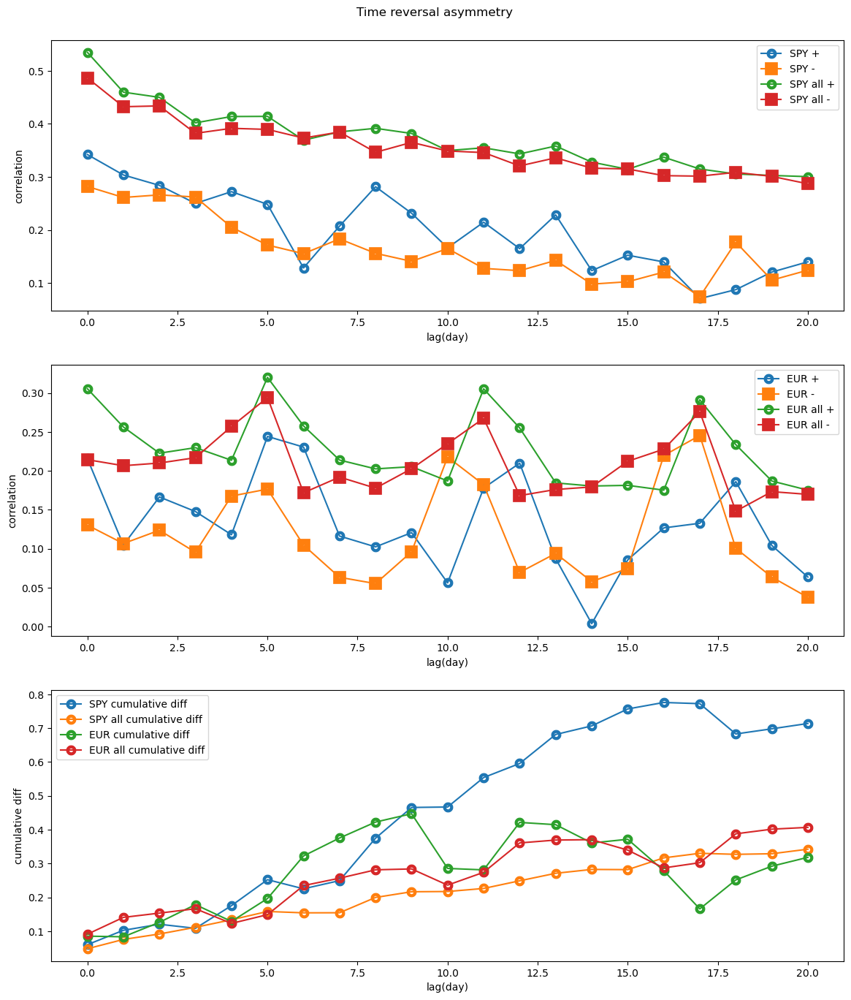

In [215]:
fig,ax =plt.subplots(3,1,figsize=(14,15))
for i,value in { 0:['SPY','SPY all'], 1:['EUR','EUR all']}.items():
    for lab in value:
        df = df_all[df_all.label==lab].copy()
        df = df[df.dT=='1H']
        c_mat =time_rev_day(df)
        #plot correlation
        ax[i].plot(c_mat[:,0] ,  label = f'{lab} +',marker='.'
                     ,mfc ='none',mew=7 )
        ax[i].plot(c_mat[:,1] ,  label = f'{lab} -',marker='.'
                     ,mfc ='none',mew=7 )
        #plot cumulative difference
        ax[2].plot(np.cumsum(c_mat[:,0]-c_mat[:,1]),label=f'{lab} cumulative diff',marker='.'
                     ,mfc ='none',mew=7)
    ax[i].legend(fontsize=13)
    ax[i].set_xlabel('lag(day)',fontsize=14)
    ax[i].set_ylabel('correlation',fontsize=14)
    ax[2].set_xlabel('lag(day)',fontsize=14)
    ax[2].set_ylabel('cumulative diff',fontsize=14)
    ax[2].legend()
plt.suptitle('Time reversal asymmetry',fontsize=14)
plt.subplots_adjust(hspace=0.2, top=0.95)


Quickly check crypto data. Two exception: BTC, ETH Binance all. Others are very colse.

In [87]:
label_token_list =[]
for df in df_list:
    if df.dT[0] == '1H':
        label_token_list .append( (df.label[0] ,df.token[0]) )

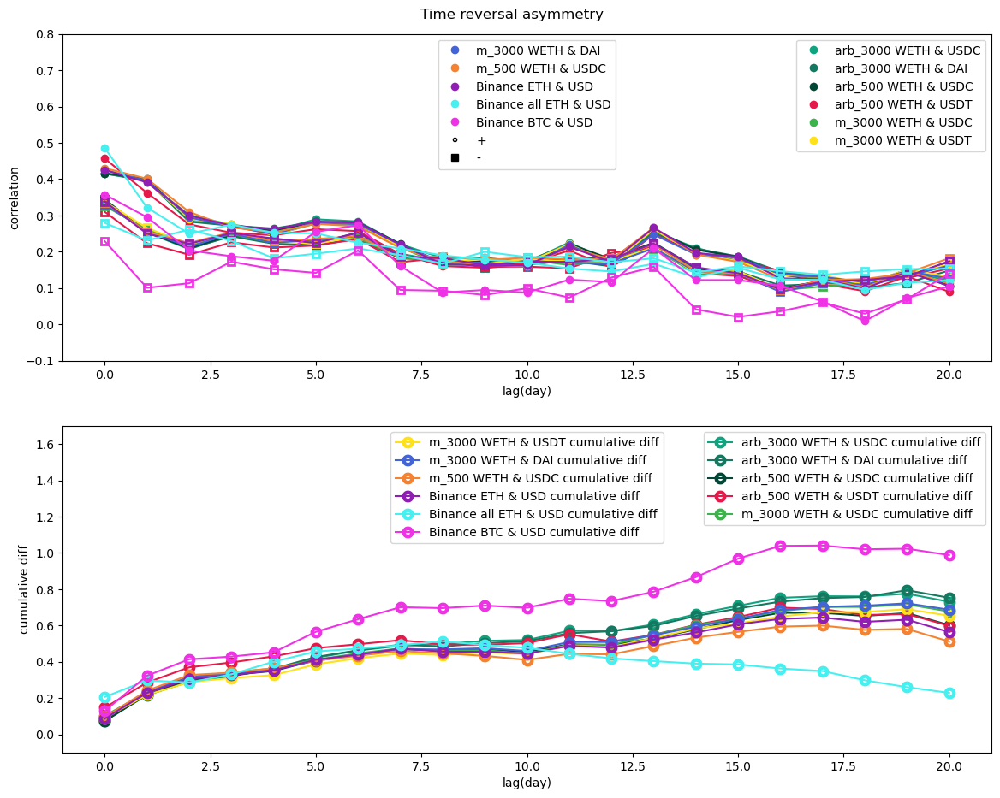

In [252]:
# label_token_list = [('m_3000','WETH & USDC') , ('m_500','WETH & USDC') ,('m_3000','WETH & USDT') ]
N = len(label_token_list)
fig,ax =plt.subplots(2,1,figsize=(14,10))
for i,(lab,token) in enumerate(label_token_list):
    df = df_all[(df_all.label==lab) & (df_all.token==token)].copy()
    df = df[df.dT=='1H']
    c_mat =time_rev_day(df)
    #plot correlation
    ax[0].plot(c_mat[:,0] ,marker='.'
                 ,mfc ='none',mew=4 ,c=color_list[i])
    ax[0].plot(c_mat[:,1] ,marker='s'
                 ,mfc ='none',mew=2 ,c=color_list[i])
    #plot cumulative difference
    ax[1].plot(np.cumsum(c_mat[:,0]-c_mat[:,1]),label=f'{lab} {token} cumulative diff',
               marker='.' ,mfc ='none',mew=7,c=color_list[i])

ax[0].set_xlabel('lag(day)')
ax[0].set_ylabel('correlation')
ax[0].set_ylim(-0.1,0.8)
ax[1].set_xlabel('lag(day)')
ax[1].set_ylabel('cumulative diff')
ax[1].set_ylim(-0.1,1.7)
    
#label setting
    
color_legend = [Line2D([0], [0], color=color_list[k], marker='o', linestyle='') for k in range(len(label_token_list))]
marker_legend =[Line2D([0], [0], color='k', marker='.',  markerfacecolor ='none',linestyle=''),
                 Line2D([0], [0], color='k', marker='s', linestyle='')]
handles = color_legend+marker_legend
labels = [f'{lab} {token}' for (lab,token) in label_token_list] + [ '+','-' ]
ax[0].legend(handles=handles,labels=labels)

for j in [0,1]:
    if j==0:
        hand, lab = handles,labels
    else:
        hand , lab = ax[j].get_legend_handles_labels()
    n = len(hand)
    first_legend = ax[j].legend(handles=[ hand[i] for i in range( int(n/2) ) ],
                                labels = [ lab[i] for i in range( int(n/2) ) ] ,loc = 1)
    ax[j].add_artist(first_legend)
    ax[j].legend(handles=[ hand[i] for i in np.arange(int(n/2),n ) ],
                  labels = [ lab[i] for i in np.arange(int(n/2),n ) ] ,loc = 9 )

plt.suptitle('Time reversal asymmetry')
plt.subplots_adjust(hspace=0.2, top=0.95)


### combine cumulative difference together

In [262]:
label_token_list =[]
for df in df_list+df_list_trad:
    if df.dT[0] == '1H':
        label_token_list .append( (df.label[0] ,df.token[0]) )

Text(0.5, 1.0, 'TRA cumulative difference')

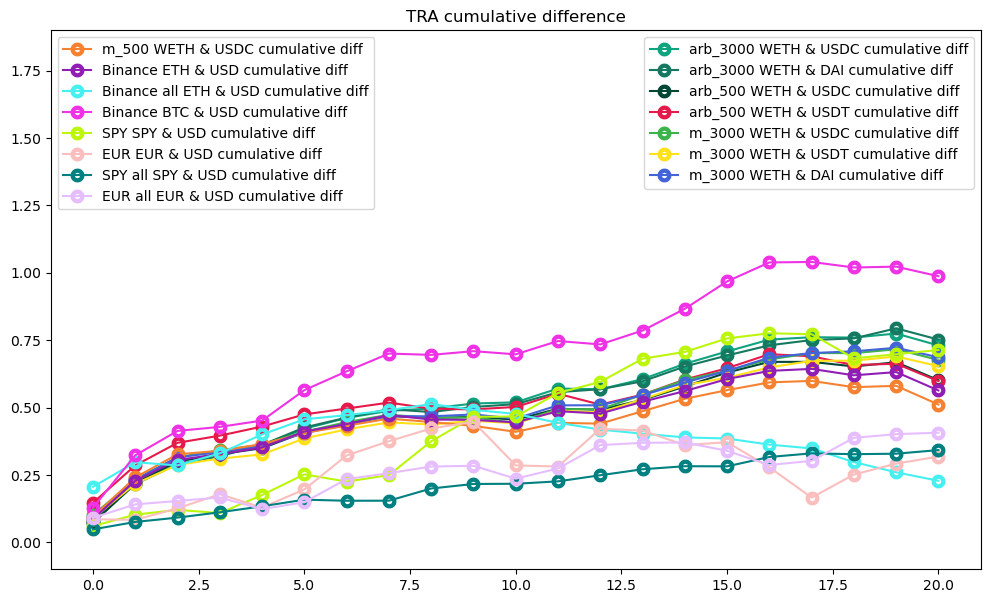

In [268]:
fig,ax = plt.subplots(figsize=(12,7))
for i,(lab,token) in enumerate(label_token_list):
    df = df_all[(df_all.label==lab) & (df_all.token==token)].copy()
    df = df[df.dT=='1H']
    c_mat =time_rev_day(df)
    ax.plot(np.cumsum(c_mat[:,0]-c_mat[:,1]),label=f'{lab} {token} cumulative diff',
               marker='.' ,mfc ='none',mew=7,c=color_list[i])
ax.set_ylim(-0.1,1.9)
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ] ,loc=2)
plt.title('TRA cumulative difference')

#### Other tokens

## Correlation matrix

In [149]:
xc = df_all.reset_index().copy()
xc= xc[(xc.dT=='1H')&(~xc.label.isin(['Binance all','SPY all' , 'EUR all']))]

In [150]:
def filter_data(xc):
    a = xc.groupby(['datetime','label','token'])[['close','return']].mean().reset_index()
    b=pd.pivot(a,index='datetime',columns=['label','token'],values=['close','return']).dropna()

    return b['close'],b['return']

In [151]:
_,R = filter_data(xc)
csa = R.corr()

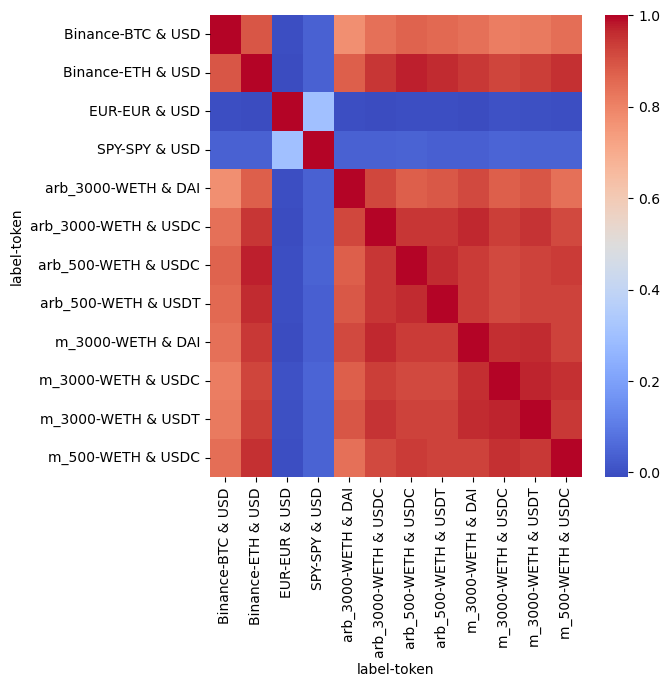

In [200]:
plt.figure(figsize=(6,6))
sns.heatmap(csa,annot=False,cmap='coolwarm')
plt.show()


## DEX vs CEX

In [115]:
df_pool_30 = pd.read_csv('Data/organized data/WETH_USDC_arb_3000/WETH_USDC_arb_3000_1min.csv',index_col='datetime')
df_pool_30.index = pd.to_datetime(df_pool_30.index)
df_pool_5 = pd.read_csv('Data/organized data/WETH_USDC_arb_500/WETH_USDC_arb_500_1min.csv',index_col='datetime')
df_pool_5.index = pd.to_datetime(df_pool_5.index)
df_CEX = pd.read_csv("Data/Binance/ETH/ETH_USD_1min.csv",index_col='datetime')
df_CEX.index = pd.to_datetime(df_CEX.index)


In [116]:
# fee constant
gamma_30 = 1- 0.003
gamma_5 = 1- 0.0005

In [117]:
# align the time frame
pool_CEX_list= [df_pool_30,df_pool_5,df_CEX]
_ =[]
for df in pool_CEX_list:
    _.append( df[(df.index>=start_time) & (df.index<=end_time)] )
    
df_pool_30 =_[0]
df_pool_5 = _[1]
df_CEX = _[2]

### Timeseries of price, locally
Locally, we can see the devation betwween pool and market price. it seems that 30bp spends more time in its no-arbitrage region than 5bp.

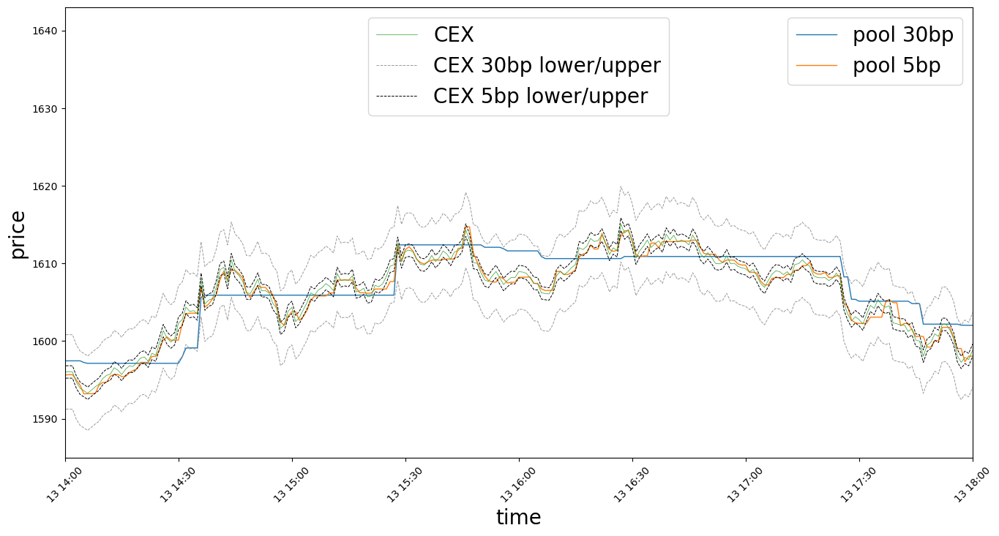

In [137]:
fig,ax = plt.subplots(figsize=(16,8))
ax.plot( df_pool_30.index, df_pool_30['close'].values , label="pool 30bp" , linewidth = 1 )
ax.plot( df_pool_5.index, df_pool_5['close'].values , label="pool 5bp" , linewidth = 1 )

ax.plot(df_CEX.index , df_CEX['close'].values,label="CEX",lw=0.5)

ax.plot(df_CEX.index , df_CEX['close'].values*gamma_30**(-1),lw=0.7,ls='dashed',c='gray' ,alpha=0.8)
ax.plot(df_CEX.index , df_CEX['close'].values*gamma_30,label="CEX 30bp lower/upper",lw=0.7,ls='dashed',c='gray'  ,alpha=0.8)


ax.plot(df_CEX.index , df_CEX['close'].values*gamma_5**(-1),lw=0.7,ls='dashed',c='k' )
ax.plot(df_CEX.index , df_CEX['close'].values*gamma_5,label="CEX 5bp lower/upper",lw=0.7,ls='dashed',c='k')

ax.set_xlim(datetime(2023,9,13,14,0,0),datetime(2023,9,13,18,0,0))
ax.set_ylim(1585,1643)
ax.set_ylabel('price',fontsize=20)
ax.set_xlabel('time',fontsize=20)
ax.tick_params(axis='x', labelrotation=45)
handles, labels = ax.get_legend_handles_labels()
n = len(handles)
first_legend = ax.legend(handles=[ handles[i] for i in range( int(n/2) ) ], loc = 1,fontsize=20)
ax.add_artist(first_legend)
ax.legend(handles=[ handles[i] for i in np.arange(int(n/2),n ) ],loc = 9 ,fontsize = 20)


### Tools

In [123]:
def plot_pdf_misP(array,norm=False):
    if norm == True:
        array = normalize(array)
    if len(array) < 10000:
        n = 11
        m = 6
    else:
        n = 21
        m = 11
    # 99%insdie (l,r)
    l = -0.008
    r = 0.008
    
    # 60% inside (-0.002,0.002)
    bin_m = np.linspace(-0.002,0.002,60)
    
    bin_l = np.linspace(l,-0.002,n)
    bin_r = np.linspace(0.002,r,n)
    bin_l = bin_l[bin_l !=-2]
    bin_r = bin_r[bin_r != 2]
    
    r_max=max(array)
    r_min=min(array)
    if r_max > r:
        bin_rr = np.linspace(r,max(array),m)
        bin_rr = bin_rr[bin_rr != r]
    else:
        bin_rr=[]
    if r_min < l:
        bin_ll = np.linspace(min(array),l,m)
        bin_ll = bin_ll[bin_ll !=l]
    else:
        bin_ll=[]
     
    bins = np.concatenate((bin_ll,bin_l,bin_m,bin_r,bin_rr ))
    
    return np.histogram( array  ,bins=bins,density=True );
def inside_ratio(array,a):
    return len(array[ np.logical_and (array <= a ,array >= -a )]) / len(array)

In [124]:
def eff_range(array,ratio=0.95):
    for a in np.linspace(0,1,10000):
        if a == 0:
            continue
        if inside_ratio(array,a)>= 0.95:
            break
    return a

### mispricing
A huge deviation around 2023/3 is due to the depg.


fraction of time pool price stays inside no-arb region is 0.8410813117051376


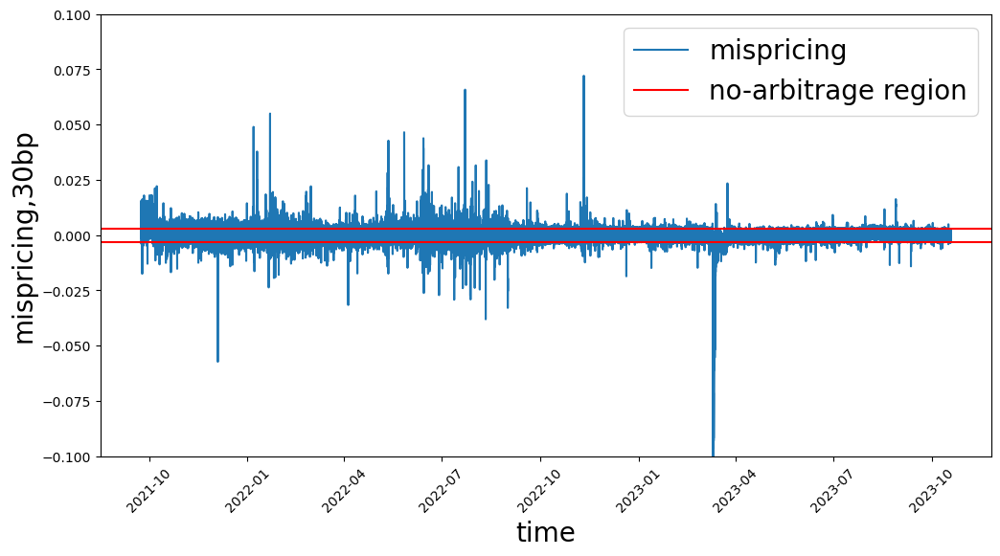

In [139]:
misP_30 =  np.log(df_CEX['close'].values) - np.log(df_pool_30['close'].values)
plt.figure(figsize=(12,6))
plt.plot( df_CEX.index,misP_30,label='mispricing')
plt.axhline( y = np.log(gamma_30) ,c = 'r' )
plt.axhline( y = -np.log(gamma_30) ,c = 'r',label='no-arbitrage region' )
plt.ylim(-0.1,0.1)
plt.xticks(rotation=45);
plt.xlabel('time',fontsize=20)
plt.ylabel('mispricing,30bp',fontsize=20)
plt.legend(fontsize=20)
ratio = inside_ratio(misP_30, -np.log(gamma_30))
print(f'fraction of time pool price stays inside no-arb region is {ratio}')

fraction of time pool price stays inside no-arb region is 0.4863125740783481


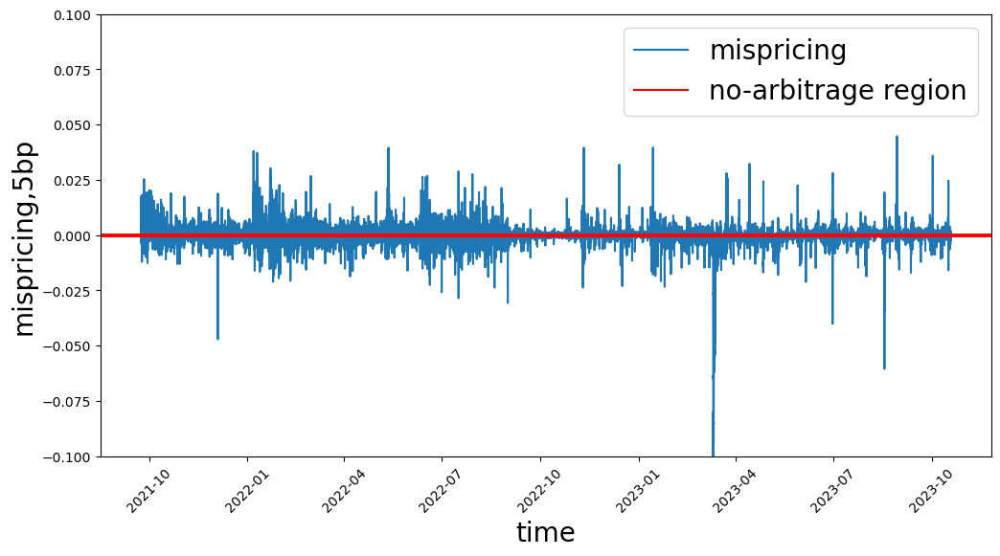

In [140]:
misP_5 =  np.log(df_CEX['close'].values) - np.log(df_pool_5['close'].values)
plt.figure(figsize=(12,6))
plt.plot( df_CEX.index,misP_5,label='mispricing')
plt.axhline( y = np.log(gamma_5) ,c = 'r' )
plt.axhline( y = -np.log(gamma_5) ,c = 'r',label='no-arbitrage region' )
plt.ylim(-0.1,0.1)
plt.xticks(rotation=45);
plt.xlabel('time',fontsize=20)
plt.ylabel('mispricing,5bp',fontsize=20)
plt.legend(fontsize=20)
ratio = inside_ratio(misP_5, -np.log(gamma_5))
print(f'fraction of time pool price stays inside no-arb region is {ratio}')

(-100.0, 100.0)

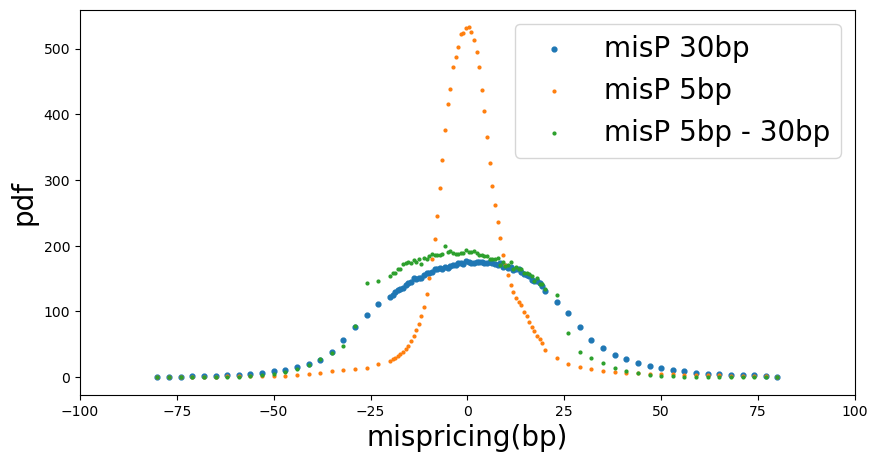

In [144]:
prob30,bins30=plot_pdf_misP(misP_30);
prob5,bins5=plot_pdf_misP(misP_5);
misP_30_5 = np.log(df_pool_30['close'].values) - np.log(df_pool_5['close'].values)
prob,bins=plot_pdf_misP(misP_30_5);
plt.figure(figsize=(10,5))
plt.scatter(bins30[:-1]*10**4, prob30, s=12,label='misP 30bp')
plt.scatter(bins5[:-1]*10**4, prob5, s=4,label='misP 5bp')
plt.scatter(bins[:-1]*10**4, prob, s=4,label='misP 5bp - 30bp')
plt.xlabel('mispricing(bp)',fontsize=20)
plt.ylabel('pdf',fontsize=20)
plt.legend(fontsize=20)
plt.xlim(-0.01*10**4,0.01*10**4)

#### effective fee
smallest $1-\gamma_{e}$ s.t $95\%$ of mispircing is in $[\log \gamma_{e}, \log \gamma^{-1}_{e}]$

In [275]:
print(f' the effective fee are 30bp:{1-np.exp(-eff_range(misP_30))},  5bp:{1-np.exp(-eff_range(misP_5))} )

(0.004589894138575246, 0.003095509032668309)

## Moments 

## Check negative ACF for EUR
FX is 24/5

Text(0.5, 1.0, 'numer of pair vs lag, EUR')

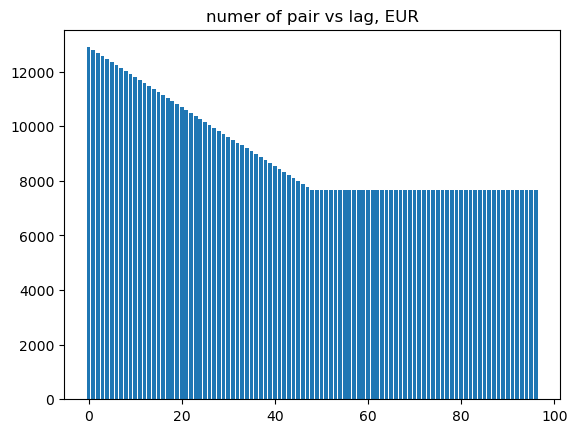

In [331]:
hour = pd.Timedelta('0 days 01:00:00')
df =  df_all[df_all.label == 'EUR'].copy()
df  =df[df.dT=='1H']
T_array = df.index
N = len(df)
Lags= []

for t in T_array:
    for s in T_array[np.logical_and(T_array>=t ,T_array<= t+ 96*hour)]:
        diff = (s-t)/hour
        Lags.append( int(diff) )
test = np.array([Lags])
numbers = [len(test[test== lag]) for lag in range(97)]
plt.bar(np.arange(97),numbers);
plt.title('numer of pair vs lag, EUR')

In [337]:
dff = df.reset_index()
dff['diff'] = dff.datetime - dff.datetime.shift(1)
dff[dff['diff'] != '0 days 01:00:00']

,datetime,close,return,dT,token,label,volume,diff
0,2021-09-23 11:00:00,1.17369,-0.001073,1H,EUR & USD,EUR,NaN,NaT
30,2021-09-26 17:00:00,1.17207,-0.000094,1H,EUR & USD,EUR,NaN,2 days 01:00:00
150,2021-10-03 17:00:00,1.15973,0.000336,1H,EUR & USD,EUR,NaN,2 days 01:00:00
270,2021-10-10 17:00:00,1.15720,-0.000268,1H,EUR & USD,EUR,NaN,2 days 01:00:00
390,2021-10-17 17:00:00,1.16016,0.000233,1H,EUR & USD,EUR,NaN,2 days 01:00:00
...,...,...,...,...,...,...,...,...
12343,2023-09-17 17:00:00,1.06644,0.000385,1H,EUR & USD,EUR,NaN,2 days 01:00:00
12463,2023-09-24 17:00:00,1.06461,0.000085,1H,EUR & USD,EUR,NaN,2 days 01:00:00
12583,2023-10-01 17:00:00,1.05687,-0.000378,1H,EUR & USD,EUR,NaN,2 days 01:00:00
12703,2023-10-08 17:00:00,1.05558,-0.002895,1H,EUR & USD,EUR,NaN,2 days 01:00:00


In [324]:

df2=plot_acf(method_list=['abs'], df_all = df_all[df_all.label =='EUR'],scale=True)['abs']

In [327]:
df2['method']='abs'

In [284]:

df2=plot_acf_2(df_all[df_all.label =='EUR'])
df2

2021-09-23 11:00:00
2022-01-21 11:00:00
2023-01-16 11:00:00
2023-05-16 11:00:00
2023-09-13 11:00:00


,method,Lags,value,label,dT,token
0,abs,0,113.547347,EUR,1H,EUR & USD
1,abs,1,27.888466,EUR,1H,EUR & USD
2,abs,2,22.492385,EUR,1H,EUR & USD
3,abs,3,14.407964,EUR,1H,EUR & USD
4,abs,4,12.092472,EUR,1H,EUR & USD
...,...,...,...,...,...,...
189,none,92,-2.757649,EUR,1H,EUR & USD
190,none,93,-0.062185,EUR,1H,EUR & USD
191,none,94,0.112927,EUR,1H,EUR & USD
192,none,95,0.047051,EUR,1H,EUR & USD


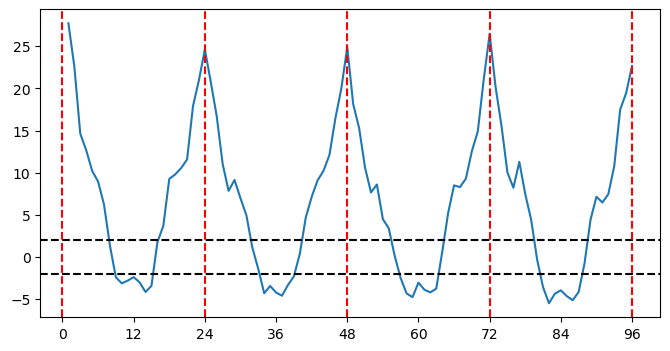

In [338]:
df2 = df2[df2.method=='abs']

plt.figure(figsize=(8,4))

plt.plot( df2.Lags[1:],df2['value'][1:])

plt.axhline(y= 2,c='k',linestyle='dashed', label=f'ebar of 1H')
plt.axhline(y=-2,c='k',linestyle='dashed')

    

plt.xticks([0,12,24,36,48,60,72,84,96])

#plot daily vline
for x in [0,24,48,72,96]:
    plt.axvline(x=x,c='red',linestyle='dashed')


In [347]:
neg = df2[df2['value']<0].Lags.values

### Exact check those data points

In [346]:
nlags = 48
hour = pd.Timedelta('0 days 01:00:00')
T_array = df.index
df['abs return'] = df['return'].abs()
df_acf = pd.DataFrame(columns=['Lags','return','shifted return','method'])
R_product = []
Lags = []
R =[]
absR=[]
time=[]
shifted_time=[]
for t in T_array:
    # print the time per quarter
    if (t-df.index[0])/hour % (24*30*4)==0:
        print(t)
    for s in T_array[np.logical_and(T_array>=t ,T_array<= t+ nlags*hour)]:
        diff = (s-t)/hour
        Lags.append( int(diff) )
        absR.append( (df.loc[t,'abs return'], df.loc[s,'abs return'] ) )
        time.append(t)
        shifted_time.append(s)
absR = np.array(absR)      
df_acf['Lags'] = Lags 
df_acf['time'] = time
df_acf['shifted_time'] = shifted_time
df_acf['method'] = ['abs' for i in range(len(Lags))]
df_acf.loc[df_acf.method=='abs','return'] = absR[:,0] 
df_acf.loc[df_acf.method=='abs','shifted return'] = absR[:,1] 
    
    # df_acf=df_acf.groupby(['method','Lags']).apply(lambda r: pd.Series(
    #                   {'value': cor(r['return'],r['shifted return'] )/np.sqrt(len(r)) }) ).reset_index()
    # df_acf['label']=df.label[0]
    # df_acf['dT']='1H'
    # df_acf['token'] = df.token[0]


2021-09-23 11:00:00
2022-01-21 11:00:00
2023-01-16 11:00:00
2023-05-16 11:00:00
2023-09-13 11:00:00


In [398]:
df_acf_4 = df_acf[df_acf.Lags==4].copy()
df_acf_22 = df_acf[df_acf.Lags==22].copy()
df_acf_9 = df_acf[df_acf.Lags==9].copy()
df_acf_38 = df_acf[df_acf.Lags==38].copy()
_list=[df_acf_4,df_acf_22,df_acf_9,df_acf_38]
acf_list=[]

In [404]:
neg

array([ 9, 10, 11, 12, 13, 14, 15, 33, 34, 35, 36, 37, 38, 39, 57, 58, 59,
       60, 61, 62, 63, 80, 81, 82, 83, 84, 85, 86, 87, 88], dtype=int64)

In [383]:
def pm_check(r,r_shifted):
    if (r>0) and (r_shifted>0):
        return '++'
    elif (r>0) and (r_shifted<0):
        return '+-'
    elif (r<0) and (r_shifted>0):
        return '-+'
    elif (r<0) and (r_shifted<0):
        return '--'
    else: return'xx'

In [399]:
for ddf in _list:
    ddff= ddf.copy()
    ddff.loc[:,'return'] = ddff[['return']].apply(lambda r: r - r.mean() ,axis=0) 
    ddff.loc[:,'shifted return'] = ddff[['shifted return']].apply(lambda r: r - r.mean() ,axis=0) 
    ddff['pm'] = ddff.apply(lambda r: pm_check(r['return'],r['shifted return'] ),axis=1)
    acf_list.append(ddff)

In [400]:
for ddff in acf_list:
    lag=ddff.Lags.values[0]
    N = len(ddff)
    p1 = len(ddff[ddff['pm']=='++' ])/N
    p2 = len(ddff[ddff['pm']=='+-' ])/N
    p3 = len(ddff[ddff['pm']=='-+' ])/N
    p4 = len(ddff[ddff['pm']=='--' ])/N
    print(f' lag={lag} ++:{p1} +-:{p2} -+:{p3} --:{p4} xx:{1-p1-p2-p3-p4}')

 lag=4 ++:0.1277296082209377 +-:0.2077713551701991 -+:0.20849389852280026 --:0.45600513808606297 xx:0.0
 lag=22 ++:0.13988946064417762 +-:0.19735086716218792 -+:0.19201448446731464 --:0.4707451877263198 xx:0.0
 lag=9 ++:0.10830324909747292 +-:0.22878011921753003 -+:0.22894803123163462 --:0.43396860045336244 xx:-5.551115123125783e-17
 lag=38 ++:0.10504681434117379 +-:0.23624115094770495 -+:0.2298469970312857 --:0.4288650376798356 xx:0.0


In [407]:
_ =plot_acf_2(df_list[1])

2021-09-23 11:00:00
2022-01-21 11:00:00
2022-05-21 11:00:00
2022-09-18 11:00:00
2023-01-16 11:00:00
2023-05-16 11:00:00
2023-09-13 11:00:00


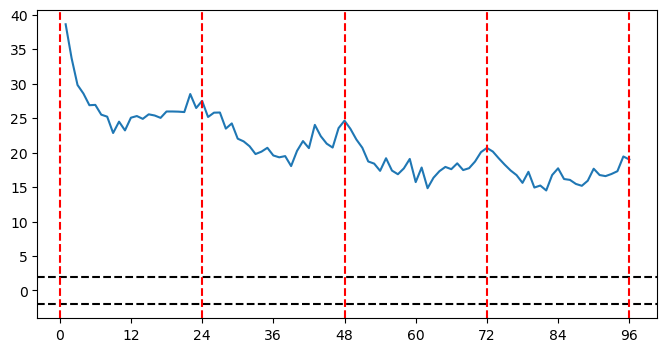

In [409]:
_ = _[_.method=='abs']

plt.figure(figsize=(8,4))

plt.plot( _.Lags[1:],_['value'][1:])

plt.axhline(y= 2,c='k',linestyle='dashed', label=f'ebar of 1H')
plt.axhline(y=-2,c='k',linestyle='dashed')

    

plt.xticks([0,12,24,36,48,60,72,84,96])

#plot daily vline
for x in [0,24,48,72,96]:
    plt.axvline(x=x,c='red',linestyle='dashed')


# Pool price model from arbitrage
* $S_n$: CEX/market price $\sim$ simple random walk with fw prob $p$, step size $\delta$

* $Z_n$: pool price s.t $Z_0 = S_0$ and

$$
  Z_n =
    \begin{cases}
        Z_{n-1} & \text{if} \; \gamma S_n \leq Z_{n-1}
        \leq \gamma^{-1} S_n
        \\
        \gamma S_n & \text{if} \; Z_{n-1} < \gamma S_n
        \\
        \gamma^{-1} S_n & \text{if} \;Z_{n-1} > \gamma^{-1} S_n
    \end{cases}
$$

# Test

In [ ]:
df =df_list[-6]


In [156]:
d=df['return'].abs().mean()

In [159]:
gamma = 0.997
np.log(gamma)/d

-1.5832120317408922

In [160]:
d

0.0018977300324044286

In [162]:
(1+0.03)**(1/(365*24*6))-1

5.623822403322265e-07